In [10]:
from sys import path as syspath
from os import path as ospath
syspath.append(ospath.join(ospath.expanduser("~"), '/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f'))

In [11]:
import torch as torch
torch._C._cuda_getDeviceCount() > 0

True

In [12]:
import os
import gym 
import matplotlib.pyplot as plt
import numpy as np 
from SB3_f.sb3f import DQN
from SB3_f.sb3f.common.vec_env import DummyVecEnv
from SB3_f.sb3f.common.evaluation import evaluate_policy
from SB3_f.sb3f.common.callbacks import EvalCallback, StopTrainingOnRewardThreshold


In [13]:
rewards = [[2,0,10],[1,0,0]]
from GridEnv import WindyGridworld
env = WindyGridworld(
        height=20,
        width=11,
        rewards=rewards,
        wind=True,
        allowed_actions=['L', 'R', 'C'],
        reward_terminates_episode=False
    )

In [14]:
episodes = 5
for episode in range(1, episodes+1):
    state = env.reset()
    done = False
    score = 0 
    
    while not done:
        env.render()
        action = env.action_space.sample()
        n_state, reward, done, info = env.step(action)
        score+=reward
    print('Episode:{} Score:{}'.format(episode, score))
env.close()

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to tar

Episode:1 Score:1
Episode:2 Score:0
Episode:3 Score:0
Episode:4 Score:0
Episode:5 Score:0


In [15]:
save_path = os.path.join('Training', 'Saved Models')
log_path = os.path.join('Training', 'Logs Bias Only', 'Env 3')

In [16]:
stop_callback = StopTrainingOnRewardThreshold(reward_threshold=3, verbose=1)
eval_callback = EvalCallback(env, 
                             callback_on_new_best=stop_callback, 
                             eval_freq=10000, 
                             best_model_save_path=save_path, 
                             verbose=1)

In [17]:
# Using same prams that performed optimally in Baseline
opt_val = env.opt_val
model = DQN('CnnPolicy', env, opt_val=opt_val, exploration_fraction=0.8,
    exploration_final_eps=0.1,learning_starts=200000,
    verbose = 1, 
    buffer_size = 50000,
    target_update_interval=1000,
    tensorboard_log=log_path)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


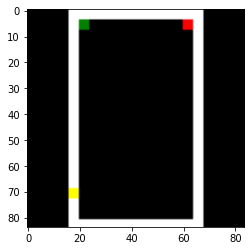

In [18]:
from SB3_f.sb3f.common.utils import obs_as_tensor
device = torch.device('cuda:0')

obs = env.canvas
plt.imshow(obs)


# Check the Network Q Value
observation = np.transpose(obs, (2, 0, 1))
observation = observation[np.newaxis, ...]
observation = obs_as_tensor(observation, device)
with torch.no_grad():
        q_values = model.q_net(observation)

In [19]:
q_values


tensor([[1.9984, 1.9919, 2.0046]], device='cuda:0')

In [20]:
model.learn(total_timesteps=1000000,callback=eval_callback, tb_log_name='Env3_1m_0.8exp')

2023-01-17 02:44:13.467530: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


Logging to Training/Logs Bias Only/Env 3/Env3_1m_0.8exp_5
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 4        |
|    fps              | 29       |
|    time_elapsed     | 2        |
|    total_timesteps  | 69       |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 1        |
| time/               |          |
|    episodes         | 8        |
|    fps              | 54       |
|    time_elapsed     | 2        |
|    total_timesteps  | 130      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 1       

/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f/sb3f/common/callbacks.py:388: UserWarning: Training and eval env are not of the same type<sb3f.common.vec_env.vec_transpose.VecTransposeImage object at 0x7f6b8ecdb5e0> != <sb3f.common.vec_env.dummy_vec_env.DummyVecEnv object at 0x7f6b8ec79850>
  warnings.warn("Training and eval env are not of the same type" f"{self.training_env} != {self.eval_env}")


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.0227   |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 44       |
|    fps              | 270      |
|    time_elapsed     | 2        |
|    total_timesteps  | 689      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.0208   |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes         | 48       |
|    fps              | 296      |
|    time_elapsed     | 2        |
|    total_timesteps  | 763      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.0192   |
|    exploration_rate | 0.999    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 132      |
|    fps              | 463      |
|    time_elapsed     | 4        |
|    total_timesteps  | 2001     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes         | 136      |
|    fps              | 479      |
|    time_elapsed     | 4        |
|    total_timesteps  | 2081     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.998    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 220      |
|    fps              | 715      |
|    time_elapsed     | 4        |
|    total_timesteps  | 3368     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes         | 224      |
|    fps              | 725      |
|    time_elapsed     | 4        |
|    total_timesteps  | 3431     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.996    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 308      |
|    fps              | 927      |
|    time_elapsed     | 5        |
|    total_timesteps  | 4735     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes         | 312      |
|    fps              | 938      |
|    time_elapsed     | 5        |
|    total_timesteps  | 4806     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.995    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.993    |
| time/               |          |
|    episodes         | 396      |
|    fps              | 1085     |
|    time_elapsed     | 5        |
|    total_timesteps  | 5916     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.993    |
| time/               |          |
|    episodes         | 400      |
|    fps              | 1094     |
|    time_elapsed     | 5        |
|    total_timesteps  | 5986     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.993    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 484      |
|    fps              | 1244     |
|    time_elapsed     | 5        |
|    total_timesteps  | 7275     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes         | 488      |
|    fps              | 1252     |
|    time_elapsed     | 5        |
|    total_timesteps  | 7346     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.992    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes         | 572      |
|    fps              | 1380     |
|    time_elapsed     | 6        |
|    total_timesteps  | 8602     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes         | 576      |
|    fps              | 1384     |
|    time_elapsed     | 6        |
|    total_timesteps  | 8649     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.99     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 660      |
|    fps              | 1495     |
|    time_elapsed     | 6        |
|    total_timesteps  | 9895     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.989    |
| time/               |          |
|    episodes         | 664      |
|    fps              | 1502     |
|    time_elapsed     | 6        |
|    total_timesteps  | 9975     |
----------------------------------
Eval num_timesteps=10000, episode_reward=0.20 +/- 0.40
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.2      |
| ro

/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f/sb3f/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(


----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 688      |
|    fps              | 1510     |
|    time_elapsed     | 6        |
|    total_timesteps  | 10377    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes         | 692      |
|    fps              | 1516     |
|    time_elapsed     | 6        |
|    total_timesteps  | 10445    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.988    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 776      |
|    fps              | 1612     |
|    time_elapsed     | 7        |
|    total_timesteps  | 11699    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes         | 780      |
|    fps              | 1616     |
|    time_elapsed     | 7        |
|    total_timesteps  | 11759    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.987    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 864      |
|    fps              | 1695     |
|    time_elapsed     | 7        |
|    total_timesteps  | 12908    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes         | 868      |
|    fps              | 1697     |
|    time_elapsed     | 7        |
|    total_timesteps  | 12945    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.985    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 952      |
|    fps              | 1773     |
|    time_elapsed     | 7        |
|    total_timesteps  | 14173    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes         | 956      |
|    fps              | 1778     |
|    time_elapsed     | 8        |
|    total_timesteps  | 14253    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.984    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.983    |
| time/               |          |
|    episodes         | 1040     |
|    fps              | 1846     |
|    time_elapsed     | 8        |
|    total_timesteps  | 15457    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.983    |
| time/               |          |
|    episodes         | 1044     |
|    fps              | 1850     |
|    time_elapsed     | 8        |
|    total_timesteps  | 15534    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.982    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1128     |
|    fps              | 1917     |
|    time_elapsed     | 8        |
|    total_timesteps  | 16810    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes         | 1132     |
|    fps              | 1921     |
|    time_elapsed     | 8        |
|    total_timesteps  | 16881    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.981    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.98     |
| time/               |          |
|    episodes         | 1216     |
|    fps              | 1978     |
|    time_elapsed     | 9        |
|    total_timesteps  | 18088    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.98     |
| time/               |          |
|    episodes         | 1220     |
|    fps              | 1982     |
|    time_elapsed     | 9        |
|    total_timesteps  | 18161    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.98     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1304     |
|    fps              | 2037     |
|    time_elapsed     | 9        |
|    total_timesteps  | 19417    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes         | 1308     |
|    fps              | 2039     |
|    time_elapsed     | 9        |
|    total_timesteps  | 19479    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.978    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes         | 1388     |
|    fps              | 2075     |
|    time_elapsed     | 9        |
|    total_timesteps  | 20711    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes         | 1392     |
|    fps              | 2078     |
|    time_elapsed     | 10       |
|    total_timesteps  | 20791    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.977    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1476     |
|    fps              | 2124     |
|    time_elapsed     | 10       |
|    total_timesteps  | 22075    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes         | 1480     |
|    fps              | 2127     |
|    time_elapsed     | 10       |
|    total_timesteps  | 22155    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.975    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 1564     |
|    fps              | 2165     |
|    time_elapsed     | 10       |
|    total_timesteps  | 23333    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes         | 1568     |
|    fps              | 2166     |
|    time_elapsed     | 10       |
|    total_timesteps  | 23384    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.974    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1652     |
|    fps              | 2204     |
|    time_elapsed     | 11       |
|    total_timesteps  | 24685    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes         | 1656     |
|    fps              | 2206     |
|    time_elapsed     | 11       |
|    total_timesteps  | 24754    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.972    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1740     |
|    fps              | 2242     |
|    time_elapsed     | 11       |
|    total_timesteps  | 26079    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes         | 1744     |
|    fps              | 2244     |
|    time_elapsed     | 11       |
|    total_timesteps  | 26122    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.971    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1828     |
|    fps              | 2277     |
|    time_elapsed     | 12       |
|    total_timesteps  | 27335    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes         | 1832     |
|    fps              | 2278     |
|    time_elapsed     | 12       |
|    total_timesteps  | 27386    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.969    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 1916     |
|    fps              | 2307     |
|    time_elapsed     | 12       |
|    total_timesteps  | 28598    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes         | 1920     |
|    fps              | 2309     |
|    time_elapsed     | 12       |
|    total_timesteps  | 28678    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.968    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2004     |
|    fps              | 2337     |
|    time_elapsed     | 12       |
|    total_timesteps  | 29912    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.966    |
| time/               |          |
|    episodes         | 2008     |
|    fps              | 2339     |
|    time_elapsed     | 12       |
|    total_timesteps  | 29987    |
----------------------------------
Eval num_timesteps=30000, episode_reward=0.20 +/- 0.40
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.2      |
| ro

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2088     |
|    fps              | 2355     |
|    time_elapsed     | 13       |
|    total_timesteps  | 31206    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes         | 2092     |
|    fps              | 2356     |
|    time_elapsed     | 13       |
|    total_timesteps  | 31252    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.965    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2176     |
|    fps              | 2386     |
|    time_elapsed     | 13       |
|    total_timesteps  | 32536    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes         | 2180     |
|    fps              | 2387     |
|    time_elapsed     | 13       |
|    total_timesteps  | 32591    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.963    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2264     |
|    fps              | 2413     |
|    time_elapsed     | 14       |
|    total_timesteps  | 33794    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes         | 2268     |
|    fps              | 2413     |
|    time_elapsed     | 14       |
|    total_timesteps  | 33826    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.962    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.961    |
| time/               |          |
|    episodes         | 2352     |
|    fps              | 2438     |
|    time_elapsed     | 14       |
|    total_timesteps  | 35044    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes         | 2356     |
|    fps              | 2439     |
|    time_elapsed     | 14       |
|    total_timesteps  | 35112    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.96     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2440     |
|    fps              | 2462     |
|    time_elapsed     | 14       |
|    total_timesteps  | 36300    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes         | 2444     |
|    fps              | 2463     |
|    time_elapsed     | 14       |
|    total_timesteps  | 36353    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.959    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes         | 2528     |
|    fps              | 2487     |
|    time_elapsed     | 15       |
|    total_timesteps  | 37656    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes         | 2532     |
|    fps              | 2488     |
|    time_elapsed     | 15       |
|    total_timesteps  | 37713    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.958    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2616     |
|    fps              | 2507     |
|    time_elapsed     | 15       |
|    total_timesteps  | 38857    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes         | 2620     |
|    fps              | 2508     |
|    time_elapsed     | 15       |
|    total_timesteps  | 38911    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.956    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes         | 2700     |
|    fps              | 2517     |
|    time_elapsed     | 15       |
|    total_timesteps  | 40105    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes         | 2704     |
|    fps              | 2518     |
|    time_elapsed     | 15       |
|    total_timesteps  | 40166    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.955    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.954    |
| time/               |          |
|    episodes         | 2788     |
|    fps              | 2534     |
|    time_elapsed     | 16       |
|    total_timesteps  | 41319    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes         | 2792     |
|    fps              | 2535     |
|    time_elapsed     | 16       |
|    total_timesteps  | 41365    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.953    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2876     |
|    fps              | 2552     |
|    time_elapsed     | 16       |
|    total_timesteps  | 42546    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes         | 2880     |
|    fps              | 2553     |
|    time_elapsed     | 16       |
|    total_timesteps  | 42596    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.952    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 2964     |
|    fps              | 2572     |
|    time_elapsed     | 17       |
|    total_timesteps  | 43890    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.951    |
| time/               |          |
|    episodes         | 2968     |
|    fps              | 2573     |
|    time_elapsed     | 17       |
|    total_timesteps  | 43960    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.95     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3052     |
|    fps              | 2591     |
|    time_elapsed     | 17       |
|    total_timesteps  | 45228    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes         | 3056     |
|    fps              | 2591     |
|    time_elapsed     | 17       |
|    total_timesteps  | 45276    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.949    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3140     |
|    fps              | 2605     |
|    time_elapsed     | 17       |
|    total_timesteps  | 46307    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes         | 3144     |
|    fps              | 2606     |
|    time_elapsed     | 17       |
|    total_timesteps  | 46375    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.948    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3228     |
|    fps              | 2622     |
|    time_elapsed     | 18       |
|    total_timesteps  | 47624    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes         | 3232     |
|    fps              | 2623     |
|    time_elapsed     | 18       |
|    total_timesteps  | 47692    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.946    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 3316     |
|    fps              | 2641     |
|    time_elapsed     | 18       |
|    total_timesteps  | 49105    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes         | 3320     |
|    fps              | 2641     |
|    time_elapsed     | 18       |
|    total_timesteps  | 49147    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.945    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3400     |
|    fps              | 2646     |
|    time_elapsed     | 19       |
|    total_timesteps  | 50327    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes         | 3404     |
|    fps              | 2647     |
|    time_elapsed     | 19       |
|    total_timesteps  | 50377    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.943    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes         | 3488     |
|    fps              | 2662     |
|    time_elapsed     | 19       |
|    total_timesteps  | 51621    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes         | 3492     |
|    fps              | 2663     |
|    time_elapsed     | 19       |
|    total_timesteps  | 51692    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.942    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3576     |
|    fps              | 2678     |
|    time_elapsed     | 19       |
|    total_timesteps  | 52890    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes         | 3580     |
|    fps              | 2679     |
|    time_elapsed     | 19       |
|    total_timesteps  | 52951    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.94     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 3664     |
|    fps              | 2693     |
|    time_elapsed     | 20       |
|    total_timesteps  | 54116    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes         | 3668     |
|    fps              | 2693     |
|    time_elapsed     | 20       |
|    total_timesteps  | 54162    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.939    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3752     |
|    fps              | 2709     |
|    time_elapsed     | 20       |
|    total_timesteps  | 55442    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.938    |
| time/               |          |
|    episodes         | 3756     |
|    fps              | 2710     |
|    time_elapsed     | 20       |
|    total_timesteps  | 55515    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.937    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3840     |
|    fps              | 2722     |
|    time_elapsed     | 20       |
|    total_timesteps  | 56619    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes         | 3844     |
|    fps              | 2723     |
|    time_elapsed     | 20       |
|    total_timesteps  | 56699    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.936    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3928     |
|    fps              | 2737     |
|    time_elapsed     | 21       |
|    total_timesteps  | 57961    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes         | 3932     |
|    fps              | 2738     |
|    time_elapsed     | 21       |
|    total_timesteps  | 58041    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.935    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4016     |
|    fps              | 2750     |
|    time_elapsed     | 21       |
|    total_timesteps  | 59217    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes         | 4020     |
|    fps              | 2751     |
|    time_elapsed     | 21       |
|    total_timesteps  | 59297    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.933    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes         | 4100     |
|    fps              | 2751     |
|    time_elapsed     | 21       |
|    total_timesteps  | 60524    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes         | 4104     |
|    fps              | 2752     |
|    time_elapsed     | 22       |
|    total_timesteps  | 60604    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.932    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4188     |
|    fps              | 2766     |
|    time_elapsed     | 22       |
|    total_timesteps  | 61932    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes         | 4192     |
|    fps              | 2766     |
|    time_elapsed     | 22       |
|    total_timesteps  | 62012    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.93     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes         | 4276     |
|    fps              | 2778     |
|    time_elapsed     | 22       |
|    total_timesteps  | 63259    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes         | 4280     |
|    fps              | 2779     |
|    time_elapsed     | 22       |
|    total_timesteps  | 63296    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.929    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4364     |
|    fps              | 2791     |
|    time_elapsed     | 23       |
|    total_timesteps  | 64549    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes         | 4368     |
|    fps              | 2791     |
|    time_elapsed     | 23       |
|    total_timesteps  | 64615    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.927    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes         | 4452     |
|    fps              | 2803     |
|    time_elapsed     | 23       |
|    total_timesteps  | 65876    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes         | 4456     |
|    fps              | 2803     |
|    time_elapsed     | 23       |
|    total_timesteps  | 65944    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.926    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4540     |
|    fps              | 2815     |
|    time_elapsed     | 23       |
|    total_timesteps  | 67274    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes         | 4544     |
|    fps              | 2816     |
|    time_elapsed     | 23       |
|    total_timesteps  | 67354    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.924    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes         | 4628     |
|    fps              | 2827     |
|    time_elapsed     | 24       |
|    total_timesteps  | 68608    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes         | 4632     |
|    fps              | 2827     |
|    time_elapsed     | 24       |
|    total_timesteps  | 68666    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.923    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4716     |
|    fps              | 2838     |
|    time_elapsed     | 24       |
|    total_timesteps  | 69903    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.921    |
| time/               |          |
|    episodes         | 4720     |
|    fps              | 2838     |
|    time_elapsed     | 24       |
|    total_timesteps  | 69964    |
----------------------------------
Eval num_timesteps=70000, episode_reward=0.40 +/- 0.80
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.4      |
| ro

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes         | 4800     |
|    fps              | 2839     |
|    time_elapsed     | 25       |
|    total_timesteps  | 71180    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes         | 4804     |
|    fps              | 2840     |
|    time_elapsed     | 25       |
|    total_timesteps  | 71260    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.92     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 4888     |
|    fps              | 2851     |
|    time_elapsed     | 25       |
|    total_timesteps  | 72561    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes         | 4892     |
|    fps              | 2851     |
|    time_elapsed     | 25       |
|    total_timesteps  | 72641    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.918    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 4976     |
|    fps              | 2859     |
|    time_elapsed     | 25       |
|    total_timesteps  | 73709    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes         | 4980     |
|    fps              | 2860     |
|    time_elapsed     | 25       |
|    total_timesteps  | 73784    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.917    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 5064     |
|    fps              | 2868     |
|    time_elapsed     | 26       |
|    total_timesteps  | 74920    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes         | 5068     |
|    fps              | 2869     |
|    time_elapsed     | 26       |
|    total_timesteps  | 74993    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.916    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5152     |
|    fps              | 2877     |
|    time_elapsed     | 26       |
|    total_timesteps  | 76169    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes         | 5156     |
|    fps              | 2877     |
|    time_elapsed     | 26       |
|    total_timesteps  | 76249    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.914    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 5240     |
|    fps              | 2886     |
|    time_elapsed     | 26       |
|    total_timesteps  | 77421    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes         | 5244     |
|    fps              | 2886     |
|    time_elapsed     | 26       |
|    total_timesteps  | 77477    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.913    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 5328     |
|    fps              | 2895     |
|    time_elapsed     | 27       |
|    total_timesteps  | 78772    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes         | 5332     |
|    fps              | 2896     |
|    time_elapsed     | 27       |
|    total_timesteps  | 78833    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.911    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5412     |
|    fps              | 2893     |
|    time_elapsed     | 27       |
|    total_timesteps  | 80067    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes         | 5416     |
|    fps              | 2894     |
|    time_elapsed     | 27       |
|    total_timesteps  | 80129    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.91     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5500     |
|    fps              | 2902     |
|    time_elapsed     | 28       |
|    total_timesteps  | 81344    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes         | 5504     |
|    fps              | 2902     |
|    time_elapsed     | 28       |
|    total_timesteps  | 81393    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.908    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5588     |
|    fps              | 2911     |
|    time_elapsed     | 28       |
|    total_timesteps  | 82675    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes         | 5592     |
|    fps              | 2911     |
|    time_elapsed     | 28       |
|    total_timesteps  | 82752    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.907    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.906    |
| time/               |          |
|    episodes         | 5676     |
|    fps              | 2919     |
|    time_elapsed     | 28       |
|    total_timesteps  | 83973    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes         | 5680     |
|    fps              | 2919     |
|    time_elapsed     | 28       |
|    total_timesteps  | 84027    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.905    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes         | 5764     |
|    fps              | 2927     |
|    time_elapsed     | 29       |
|    total_timesteps  | 85225    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes         | 5768     |
|    fps              | 2927     |
|    time_elapsed     | 29       |
|    total_timesteps  | 85286    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.904    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5852     |
|    fps              | 2935     |
|    time_elapsed     | 29       |
|    total_timesteps  | 86507    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes         | 5856     |
|    fps              | 2935     |
|    time_elapsed     | 29       |
|    total_timesteps  | 86568    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.903    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes         | 5940     |
|    fps              | 2942     |
|    time_elapsed     | 29       |
|    total_timesteps  | 87776    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes         | 5944     |
|    fps              | 2943     |
|    time_elapsed     | 29       |
|    total_timesteps  | 87856    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.901    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes         | 6028     |
|    fps              | 2950     |
|    time_elapsed     | 30       |
|    total_timesteps  | 89099    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes         | 6032     |
|    fps              | 2950     |
|    time_elapsed     | 30       |
|    total_timesteps  | 89162    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.9      |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6112     |
|    fps              | 2950     |
|    time_elapsed     | 30       |
|    total_timesteps  | 90343    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes         | 6116     |
|    fps              | 2950     |
|    time_elapsed     | 30       |
|    total_timesteps  | 90423    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.898    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6200     |
|    fps              | 2957     |
|    time_elapsed     | 30       |
|    total_timesteps  | 91584    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes         | 6204     |
|    fps              | 2957     |
|    time_elapsed     | 30       |
|    total_timesteps  | 91641    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.897    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes         | 6288     |
|    fps              | 2963     |
|    time_elapsed     | 31       |
|    total_timesteps  | 92746    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.896    |
| time/               |          |
|    episodes         | 6292     |
|    fps              | 2963     |
|    time_elapsed     | 31       |
|    total_timesteps  | 92815    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.895    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes         | 6376     |
|    fps              | 2970     |
|    time_elapsed     | 31       |
|    total_timesteps  | 94162    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes         | 6380     |
|    fps              | 2970     |
|    time_elapsed     | 31       |
|    total_timesteps  | 94185    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.894    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6464     |
|    fps              | 2976     |
|    time_elapsed     | 32       |
|    total_timesteps  | 95305    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes         | 6468     |
|    fps              | 2976     |
|    time_elapsed     | 32       |
|    total_timesteps  | 95343    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.893    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes         | 6552     |
|    fps              | 2982     |
|    time_elapsed     | 32       |
|    total_timesteps  | 96608    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes         | 6556     |
|    fps              | 2982     |
|    time_elapsed     | 32       |
|    total_timesteps  | 96627    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.891    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6640     |
|    fps              | 2988     |
|    time_elapsed     | 32       |
|    total_timesteps  | 97837    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes         | 6644     |
|    fps              | 2989     |
|    time_elapsed     | 32       |
|    total_timesteps  | 97906    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.89     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 6728     |
|    fps              | 2995     |
|    time_elapsed     | 33       |
|    total_timesteps  | 99168    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes         | 6732     |
|    fps              | 2995     |
|    time_elapsed     | 33       |
|    total_timesteps  | 99237    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.888    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.887    |
| time/               |          |
|    episodes         | 6812     |
|    fps              | 2994     |
|    time_elapsed     | 33       |
|    total_timesteps  | 100464   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.887    |
| time/               |          |
|    episodes         | 6816     |
|    fps              | 2995     |
|    time_elapsed     | 33       |
|    total_timesteps  | 100535   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.887    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.886    |
| time/               |          |
|    episodes         | 6900     |
|    fps              | 3000     |
|    time_elapsed     | 33       |
|    total_timesteps  | 101770   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes         | 6904     |
|    fps              | 3000     |
|    time_elapsed     | 33       |
|    total_timesteps  | 101832   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.885    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 6988     |
|    fps              | 3006     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103136   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes         | 6992     |
|    fps              | 3007     |
|    time_elapsed     | 34       |
|    total_timesteps  | 103200   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.884    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.883    |
| time/               |          |
|    episodes         | 7076     |
|    fps              | 3012     |
|    time_elapsed     | 34       |
|    total_timesteps  | 104417   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes         | 7080     |
|    fps              | 3012     |
|    time_elapsed     | 34       |
|    total_timesteps  | 104466   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.882    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7164     |
|    fps              | 3017     |
|    time_elapsed     | 35       |
|    total_timesteps  | 105663   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes         | 7168     |
|    fps              | 3017     |
|    time_elapsed     | 35       |
|    total_timesteps  | 105702   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.881    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7252     |
|    fps              | 3023     |
|    time_elapsed     | 35       |
|    total_timesteps  | 106989   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes         | 7256     |
|    fps              | 3023     |
|    time_elapsed     | 35       |
|    total_timesteps  | 107038   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.88     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7340     |
|    fps              | 3028     |
|    time_elapsed     | 35       |
|    total_timesteps  | 108252   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes         | 7344     |
|    fps              | 3028     |
|    time_elapsed     | 35       |
|    total_timesteps  | 108306   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.878    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes         | 7428     |
|    fps              | 3033     |
|    time_elapsed     | 36       |
|    total_timesteps  | 109507   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes         | 7432     |
|    fps              | 3033     |
|    time_elapsed     | 36       |
|    total_timesteps  | 109567   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.877    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7512     |
|    fps              | 3030     |
|    time_elapsed     | 36       |
|    total_timesteps  | 110528   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes         | 7516     |
|    fps              | 3031     |
|    time_elapsed     | 36       |
|    total_timesteps  | 110593   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.876    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7600     |
|    fps              | 3036     |
|    time_elapsed     | 36       |
|    total_timesteps  | 111878   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes         | 7604     |
|    fps              | 3036     |
|    time_elapsed     | 36       |
|    total_timesteps  | 111936   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.874    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7688     |
|    fps              | 3041     |
|    time_elapsed     | 37       |
|    total_timesteps  | 113154   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes         | 7692     |
|    fps              | 3041     |
|    time_elapsed     | 37       |
|    total_timesteps  | 113205   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.873    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7776     |
|    fps              | 3045     |
|    time_elapsed     | 37       |
|    total_timesteps  | 114335   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes         | 7780     |
|    fps              | 3045     |
|    time_elapsed     | 37       |
|    total_timesteps  | 114403   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.871    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7864     |
|    fps              | 3050     |
|    time_elapsed     | 37       |
|    total_timesteps  | 115695   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes         | 7868     |
|    fps              | 3050     |
|    time_elapsed     | 37       |
|    total_timesteps  | 115747   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.87     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 7952     |
|    fps              | 3054     |
|    time_elapsed     | 38       |
|    total_timesteps  | 116918   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes         | 7956     |
|    fps              | 3055     |
|    time_elapsed     | 38       |
|    total_timesteps  | 116981   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.868    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 8040     |
|    fps              | 3059     |
|    time_elapsed     | 38       |
|    total_timesteps  | 118230   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes         | 8044     |
|    fps              | 3059     |
|    time_elapsed     | 38       |
|    total_timesteps  | 118271   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.867    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8128     |
|    fps              | 3064     |
|    time_elapsed     | 39       |
|    total_timesteps  | 119571   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes         | 8132     |
|    fps              | 3064     |
|    time_elapsed     | 39       |
|    total_timesteps  | 119643   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.865    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8212     |
|    fps              | 3063     |
|    time_elapsed     | 39       |
|    total_timesteps  | 120858   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes         | 8216     |
|    fps              | 3063     |
|    time_elapsed     | 39       |
|    total_timesteps  | 120925   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.864    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8300     |
|    fps              | 3067     |
|    time_elapsed     | 39       |
|    total_timesteps  | 122080   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes         | 8304     |
|    fps              | 3067     |
|    time_elapsed     | 39       |
|    total_timesteps  | 122114   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.863    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8388     |
|    fps              | 3072     |
|    time_elapsed     | 40       |
|    total_timesteps  | 123527   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes         | 8392     |
|    fps              | 3072     |
|    time_elapsed     | 40       |
|    total_timesteps  | 123573   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.861    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8476     |
|    fps              | 3076     |
|    time_elapsed     | 40       |
|    total_timesteps  | 124786   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.86     |
| time/               |          |
|    episodes         | 8480     |
|    fps              | 3076     |
|    time_elapsed     | 40       |
|    total_timesteps  | 124853   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.859    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8564     |
|    fps              | 3081     |
|    time_elapsed     | 40       |
|    total_timesteps  | 126152   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes         | 8568     |
|    fps              | 3081     |
|    time_elapsed     | 40       |
|    total_timesteps  | 126215   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.858    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8652     |
|    fps              | 3085     |
|    time_elapsed     | 41       |
|    total_timesteps  | 127422   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.857    |
| time/               |          |
|    episodes         | 8656     |
|    fps              | 3085     |
|    time_elapsed     | 41       |
|    total_timesteps  | 127502   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.856    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8740     |
|    fps              | 3089     |
|    time_elapsed     | 41       |
|    total_timesteps  | 128687   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes         | 8744     |
|    fps              | 3089     |
|    time_elapsed     | 41       |
|    total_timesteps  | 128708   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.855    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.854    |
| time/               |          |
|    episodes         | 8828     |
|    fps              | 3093     |
|    time_elapsed     | 42       |
|    total_timesteps  | 129945   |
----------------------------------
Eval num_timesteps=130000, episode_reward=0.20 +/- 0.40
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 0.2      |
| rollout/            |          |
|    exploration_rate | 0.854    |
| time/               |          |
|    total_timesteps  | 130000   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.854    |
| time/               |          |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8912     |
|    fps              | 3091     |
|    time_elapsed     | 42       |
|    total_timesteps  | 131173   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes         | 8916     |
|    fps              | 3092     |
|    time_elapsed     | 42       |
|    total_timesteps  | 131247   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.852    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 9000     |
|    fps              | 3095     |
|    time_elapsed     | 42       |
|    total_timesteps  | 132474   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes         | 9004     |
|    fps              | 3096     |
|    time_elapsed     | 42       |
|    total_timesteps  | 132545   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.851    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.85     |
| time/               |          |
|    episodes         | 9088     |
|    fps              | 3099     |
|    time_elapsed     | 43       |
|    total_timesteps  | 133716   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes         | 9092     |
|    fps              | 3099     |
|    time_elapsed     | 43       |
|    total_timesteps  | 133784   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.849    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9176     |
|    fps              | 3103     |
|    time_elapsed     | 43       |
|    total_timesteps  | 134939   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes         | 9180     |
|    fps              | 3103     |
|    time_elapsed     | 43       |
|    total_timesteps  | 135005   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.848    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9264     |
|    fps              | 3107     |
|    time_elapsed     | 43       |
|    total_timesteps  | 136267   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes         | 9268     |
|    fps              | 3107     |
|    time_elapsed     | 43       |
|    total_timesteps  | 136347   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.847    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9352     |
|    fps              | 3110     |
|    time_elapsed     | 44       |
|    total_timesteps  | 137516   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes         | 9356     |
|    fps              | 3110     |
|    time_elapsed     | 44       |
|    total_timesteps  | 137552   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.845    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9440     |
|    fps              | 3114     |
|    time_elapsed     | 44       |
|    total_timesteps  | 138796   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes         | 9444     |
|    fps              | 3114     |
|    time_elapsed     | 44       |
|    total_timesteps  | 138840   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.844    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9524     |
|    fps              | 3113     |
|    time_elapsed     | 45       |
|    total_timesteps  | 140108   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes         | 9528     |
|    fps              | 3113     |
|    time_elapsed     | 45       |
|    total_timesteps  | 140168   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.842    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9612     |
|    fps              | 3116     |
|    time_elapsed     | 45       |
|    total_timesteps  | 141438   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes         | 9616     |
|    fps              | 3116     |
|    time_elapsed     | 45       |
|    total_timesteps  | 141485   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.841    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9700     |
|    fps              | 3120     |
|    time_elapsed     | 45       |
|    total_timesteps  | 142768   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes         | 9704     |
|    fps              | 3120     |
|    time_elapsed     | 45       |
|    total_timesteps  | 142827   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.839    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9788     |
|    fps              | 3124     |
|    time_elapsed     | 46       |
|    total_timesteps  | 144145   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes         | 9792     |
|    fps              | 3124     |
|    time_elapsed     | 46       |
|    total_timesteps  | 144211   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.838    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9876     |
|    fps              | 3127     |
|    time_elapsed     | 46       |
|    total_timesteps  | 145359   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes         | 9880     |
|    fps              | 3127     |
|    time_elapsed     | 46       |
|    total_timesteps  | 145439   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.836    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9964     |
|    fps              | 3131     |
|    time_elapsed     | 46       |
|    total_timesteps  | 146671   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes         | 9968     |
|    fps              | 3131     |
|    time_elapsed     | 46       |
|    total_timesteps  | 146719   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.835    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10052    |
|    fps              | 3134     |
|    time_elapsed     | 47       |
|    total_timesteps  | 147901   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.834    |
| time/               |          |
|    episodes         | 10056    |
|    fps              | 3134     |
|    time_elapsed     | 47       |
|    total_timesteps  | 147966   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.833    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10140    |
|    fps              | 3137     |
|    time_elapsed     | 47       |
|    total_timesteps  | 149275   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes         | 10144    |
|    fps              | 3137     |
|    time_elapsed     | 47       |
|    total_timesteps  | 149355   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.832    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10224    |
|    fps              | 3136     |
|    time_elapsed     | 47       |
|    total_timesteps  | 150517   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes         | 10228    |
|    fps              | 3136     |
|    time_elapsed     | 48       |
|    total_timesteps  | 150586   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.831    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10312    |
|    fps              | 3139     |
|    time_elapsed     | 48       |
|    total_timesteps  | 151793   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes         | 10316    |
|    fps              | 3139     |
|    time_elapsed     | 48       |
|    total_timesteps  | 151836   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.829    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10400    |
|    fps              | 3142     |
|    time_elapsed     | 48       |
|    total_timesteps  | 153074   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes         | 10404    |
|    fps              | 3142     |
|    time_elapsed     | 48       |
|    total_timesteps  | 153137   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.828    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10488    |
|    fps              | 3145     |
|    time_elapsed     | 49       |
|    total_timesteps  | 154352   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes         | 10492    |
|    fps              | 3145     |
|    time_elapsed     | 49       |
|    total_timesteps  | 154413   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.826    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10576    |
|    fps              | 3148     |
|    time_elapsed     | 49       |
|    total_timesteps  | 155669   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes         | 10580    |
|    fps              | 3148     |
|    time_elapsed     | 49       |
|    total_timesteps  | 155723   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.825    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10664    |
|    fps              | 3151     |
|    time_elapsed     | 49       |
|    total_timesteps  | 156952   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes         | 10668    |
|    fps              | 3151     |
|    time_elapsed     | 49       |
|    total_timesteps  | 157010   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.823    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10752    |
|    fps              | 3154     |
|    time_elapsed     | 50       |
|    total_timesteps  | 158182   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes         | 10756    |
|    fps              | 3154     |
|    time_elapsed     | 50       |
|    total_timesteps  | 158253   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.822    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 11.9     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10840    |
|    fps              | 3156     |
|    time_elapsed     | 50       |
|    total_timesteps  | 159240   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.1     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes         | 10844    |
|    fps              | 3156     |
|    time_elapsed     | 50       |
|    total_timesteps  | 159298   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.821    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10924    |
|    fps              | 3154     |
|    time_elapsed     | 50       |
|    total_timesteps  | 160520   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes         | 10928    |
|    fps              | 3154     |
|    time_elapsed     | 50       |
|    total_timesteps  | 160586   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.819    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 11012    |
|    fps              | 3157     |
|    time_elapsed     | 51       |
|    total_timesteps  | 161900   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes         | 11016    |
|    fps              | 3158     |
|    time_elapsed     | 51       |
|    total_timesteps  | 161965   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.818    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.817    |
| time/               |          |
|    episodes         | 11100    |
|    fps              | 3160     |
|    time_elapsed     | 51       |
|    total_timesteps  | 163064   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes         | 11104    |
|    fps              | 3160     |
|    time_elapsed     | 51       |
|    total_timesteps  | 163126   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.816    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11188    |
|    fps              | 3162     |
|    time_elapsed     | 51       |
|    total_timesteps  | 164347   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes         | 11192    |
|    fps              | 3162     |
|    time_elapsed     | 51       |
|    total_timesteps  | 164409   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.815    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.814    |
| time/               |          |
|    episodes         | 11276    |
|    fps              | 3165     |
|    time_elapsed     | 52       |
|    total_timesteps  | 165594   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.814    |
| time/               |          |
|    episodes         | 11280    |
|    fps              | 3165     |
|    time_elapsed     | 52       |
|    total_timesteps  | 165658   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.814    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11364    |
|    fps              | 3167     |
|    time_elapsed     | 52       |
|    total_timesteps  | 166804   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes         | 11368    |
|    fps              | 3167     |
|    time_elapsed     | 52       |
|    total_timesteps  | 166867   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.812    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11452    |
|    fps              | 3170     |
|    time_elapsed     | 53       |
|    total_timesteps  | 168098   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes         | 11456    |
|    fps              | 3170     |
|    time_elapsed     | 53       |
|    total_timesteps  | 168140   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.811    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11540    |
|    fps              | 3172     |
|    time_elapsed     | 53       |
|    total_timesteps  | 169406   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes         | 11544    |
|    fps              | 3172     |
|    time_elapsed     | 53       |
|    total_timesteps  | 169453   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.809    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes         | 11624    |
|    fps              | 3171     |
|    time_elapsed     | 53       |
|    total_timesteps  | 170797   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes         | 11628    |
|    fps              | 3171     |
|    time_elapsed     | 53       |
|    total_timesteps  | 170862   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.808    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11712    |
|    fps              | 3174     |
|    time_elapsed     | 54       |
|    total_timesteps  | 172042   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes         | 11716    |
|    fps              | 3174     |
|    time_elapsed     | 54       |
|    total_timesteps  | 172110   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.806    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11800    |
|    fps              | 3176     |
|    time_elapsed     | 54       |
|    total_timesteps  | 173310   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes         | 11804    |
|    fps              | 3176     |
|    time_elapsed     | 54       |
|    total_timesteps  | 173337   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.805    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.804    |
| time/               |          |
|    episodes         | 11888    |
|    fps              | 3179     |
|    time_elapsed     | 54       |
|    total_timesteps  | 174605   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes         | 11892    |
|    fps              | 3179     |
|    time_elapsed     | 54       |
|    total_timesteps  | 174681   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.803    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 11976    |
|    fps              | 3182     |
|    time_elapsed     | 55       |
|    total_timesteps  | 175994   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes         | 11980    |
|    fps              | 3182     |
|    time_elapsed     | 55       |
|    total_timesteps  | 176074   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.802    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 12064    |
|    fps              | 3184     |
|    time_elapsed     | 55       |
|    total_timesteps  | 177340   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes         | 12068    |
|    fps              | 3184     |
|    time_elapsed     | 55       |
|    total_timesteps  | 177384   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.8      |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12152    |
|    fps              | 3187     |
|    time_elapsed     | 56       |
|    total_timesteps  | 178672   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes         | 12156    |
|    fps              | 3187     |
|    time_elapsed     | 56       |
|    total_timesteps  | 178714   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.799    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12240    |
|    fps              | 3189     |
|    time_elapsed     | 56       |
|    total_timesteps  | 179863   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes         | 12244    |
|    fps              | 3189     |
|    time_elapsed     | 56       |
|    total_timesteps  | 179916   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.798    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12324    |
|    fps              | 3187     |
|    time_elapsed     | 56       |
|    total_timesteps  | 181134   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes         | 12328    |
|    fps              | 3187     |
|    time_elapsed     | 56       |
|    total_timesteps  | 181214   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.796    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12412    |
|    fps              | 3190     |
|    time_elapsed     | 57       |
|    total_timesteps  | 182479   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes         | 12416    |
|    fps              | 3190     |
|    time_elapsed     | 57       |
|    total_timesteps  | 182539   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.795    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12500    |
|    fps              | 3192     |
|    time_elapsed     | 57       |
|    total_timesteps  | 183788   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes         | 12504    |
|    fps              | 3192     |
|    time_elapsed     | 57       |
|    total_timesteps  | 183833   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.793    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12588    |
|    fps              | 3195     |
|    time_elapsed     | 57       |
|    total_timesteps  | 185137   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes         | 12592    |
|    fps              | 3195     |
|    time_elapsed     | 57       |
|    total_timesteps  | 185199   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.792    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12676    |
|    fps              | 3197     |
|    time_elapsed     | 58       |
|    total_timesteps  | 186414   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes         | 12680    |
|    fps              | 3197     |
|    time_elapsed     | 58       |
|    total_timesteps  | 186481   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.79     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12764    |
|    fps              | 3200     |
|    time_elapsed     | 58       |
|    total_timesteps  | 187768   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes         | 12768    |
|    fps              | 3200     |
|    time_elapsed     | 58       |
|    total_timesteps  | 187834   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.789    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12852    |
|    fps              | 3202     |
|    time_elapsed     | 59       |
|    total_timesteps  | 189095   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes         | 12856    |
|    fps              | 3202     |
|    time_elapsed     | 59       |
|    total_timesteps  | 189138   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.787    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12936    |
|    fps              | 3200     |
|    time_elapsed     | 59       |
|    total_timesteps  | 190329   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes         | 12940    |
|    fps              | 3200     |
|    time_elapsed     | 59       |
|    total_timesteps  | 190386   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.786    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 13024    |
|    fps              | 3202     |
|    time_elapsed     | 59       |
|    total_timesteps  | 191616   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes         | 13028    |
|    fps              | 3202     |
|    time_elapsed     | 59       |
|    total_timesteps  | 191646   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.784    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 13112    |
|    fps              | 3204     |
|    time_elapsed     | 60       |
|    total_timesteps  | 192800   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes         | 13116    |
|    fps              | 3204     |
|    time_elapsed     | 60       |
|    total_timesteps  | 192848   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.783    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 13200    |
|    fps              | 3206     |
|    time_elapsed     | 60       |
|    total_timesteps  | 194077   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.782    |
| time/               |          |
|    episodes         | 13204    |
|    fps              | 3206     |
|    time_elapsed     | 60       |
|    total_timesteps  | 194157   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes         | 13288    |
|    fps              | 3208     |
|    time_elapsed     | 60       |
|    total_timesteps  | 195472   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes         | 13292    |
|    fps              | 3208     |
|    time_elapsed     | 60       |
|    total_timesteps  | 195530   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.78     |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.779    |
| time/               |          |
|    episodes         | 13376    |
|    fps              | 3210     |
|    time_elapsed     | 61       |
|    total_timesteps  | 196820   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes         | 13380    |
|    fps              | 3210     |
|    time_elapsed     | 61       |
|    total_timesteps  | 196900   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.778    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13464    |
|    fps              | 3212     |
|    time_elapsed     | 61       |
|    total_timesteps  | 198095   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes         | 13468    |
|    fps              | 3212     |
|    time_elapsed     | 61       |
|    total_timesteps  | 198104   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.777    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13552    |
|    fps              | 3214     |
|    time_elapsed     | 62       |
|    total_timesteps  | 199350   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes         | 13556    |
|    fps              | 3214     |
|    time_elapsed     | 62       |
|    total_timesteps  | 199411   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.776    |
| time/               |          |
|    episodes       

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13624    |
|    fps              | 3158     |
|    time_elapsed     | 63       |
|    total_timesteps  | 200490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.135    |
|    n_updates        | 122      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.774    |
| time/               |          |
|    episodes         | 13628    |
|    fps              | 3154     |
|    time_elapsed     | 63       |
|    total_timesteps  | 200569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0907   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13688    |
|    fps              | 3114     |
|    time_elapsed     | 64       |
|    total_timesteps  | 201442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.178    |
|    n_updates        | 360      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.773    |
| time/               |          |
|    episodes         | 13692    |
|    fps              | 3111     |
|    time_elapsed     | 64       |
|    total_timesteps  | 201508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.132    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13752    |
|    fps              | 3070     |
|    time_elapsed     | 65       |
|    total_timesteps  | 202506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.124    |
|    n_updates        | 626      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.772    |
| time/               |          |
|    episodes         | 13756    |
|    fps              | 3068     |
|    time_elapsed     | 66       |
|    total_timesteps  | 202560   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0846   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13816    |
|    fps              | 3029     |
|    time_elapsed     | 67       |
|    total_timesteps  | 203544   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0423   |
|    n_updates        | 885      |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.771    |
| time/               |          |
|    episodes         | 13820    |
|    fps              | 3026     |
|    time_elapsed     | 67       |
|    total_timesteps  | 203618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00262  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13880    |
|    fps              | 2985     |
|    time_elapsed     | 68       |
|    total_timesteps  | 204527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.113    |
|    n_updates        | 1131     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.77     |
| time/               |          |
|    episodes         | 13884    |
|    fps              | 2982     |
|    time_elapsed     | 68       |
|    total_timesteps  | 204607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.153    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13944    |
|    fps              | 2947     |
|    time_elapsed     | 69       |
|    total_timesteps  | 205535   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0423   |
|    n_updates        | 1383     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.769    |
| time/               |          |
|    episodes         | 13948    |
|    fps              | 2944     |
|    time_elapsed     | 69       |
|    total_timesteps  | 205615   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00269  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 14008    |
|    fps              | 2912     |
|    time_elapsed     | 70       |
|    total_timesteps  | 206486   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.107    |
|    n_updates        | 1621     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.768    |
| time/               |          |
|    episodes         | 14012    |
|    fps              | 2910     |
|    time_elapsed     | 70       |
|    total_timesteps  | 206548   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0379   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 14072    |
|    fps              | 2874     |
|    time_elapsed     | 72       |
|    total_timesteps  | 207568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0379   |
|    n_updates        | 1891     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.766    |
| time/               |          |
|    episodes         | 14076    |
|    fps              | 2871     |
|    time_elapsed     | 72       |
|    total_timesteps  | 207648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.104    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 14136    |
|    fps              | 2838     |
|    time_elapsed     | 73       |
|    total_timesteps  | 208583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.127    |
|    n_updates        | 2145     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.765    |
| time/               |          |
|    episodes         | 14140    |
|    fps              | 2836     |
|    time_elapsed     | 73       |
|    total_timesteps  | 208632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0692   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14200    |
|    fps              | 2806     |
|    time_elapsed     | 74       |
|    total_timesteps  | 209515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0624   |
|    n_updates        | 2378     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.764    |
| time/               |          |
|    episodes         | 14204    |
|    fps              | 2805     |
|    time_elapsed     | 74       |
|    total_timesteps  | 209556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0611   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14260    |
|    fps              | 2775     |
|    time_elapsed     | 75       |
|    total_timesteps  | 210399   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0562   |
|    n_updates        | 2599     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.763    |
| time/               |          |
|    episodes         | 14264    |
|    fps              | 2773     |
|    time_elapsed     | 75       |
|    total_timesteps  | 210479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0768   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14324    |
|    fps              | 2745     |
|    time_elapsed     | 76       |
|    total_timesteps  | 211373   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0782   |
|    n_updates        | 2843     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.762    |
| time/               |          |
|    episodes         | 14328    |
|    fps              | 2744     |
|    time_elapsed     | 77       |
|    total_timesteps  | 211422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0757   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14388    |
|    fps              | 2715     |
|    time_elapsed     | 78       |
|    total_timesteps  | 212356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.076    |
|    n_updates        | 3088     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.761    |
| time/               |          |
|    episodes         | 14392    |
|    fps              | 2713     |
|    time_elapsed     | 78       |
|    total_timesteps  | 212418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.149    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14452    |
|    fps              | 2689     |
|    time_elapsed     | 79       |
|    total_timesteps  | 213238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0447   |
|    n_updates        | 3309     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.76     |
| time/               |          |
|    episodes         | 14456    |
|    fps              | 2687     |
|    time_elapsed     | 79       |
|    total_timesteps  | 213304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.023    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14516    |
|    fps              | 2659     |
|    time_elapsed     | 80       |
|    total_timesteps  | 214263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0659   |
|    n_updates        | 3565     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.759    |
| time/               |          |
|    episodes         | 14520    |
|    fps              | 2658     |
|    time_elapsed     | 80       |
|    total_timesteps  | 214330   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0682   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14580    |
|    fps              | 2630     |
|    time_elapsed     | 81       |
|    total_timesteps  | 215311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0415   |
|    n_updates        | 3827     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.09     |
|    exploration_rate | 0.758    |
| time/               |          |
|    episodes         | 14584    |
|    fps              | 2629     |
|    time_elapsed     | 81       |
|    total_timesteps  | 215356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0021   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14644    |
|    fps              | 2603     |
|    time_elapsed     | 83       |
|    total_timesteps  | 216304   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00299  |
|    n_updates        | 4075     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.757    |
| time/               |          |
|    episodes         | 14648    |
|    fps              | 2602     |
|    time_elapsed     | 83       |
|    total_timesteps  | 216374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00366  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14708    |
|    fps              | 2579     |
|    time_elapsed     | 84       |
|    total_timesteps  | 217229   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0487   |
|    n_updates        | 4307     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.756    |
| time/               |          |
|    episodes         | 14712    |
|    fps              | 2577     |
|    time_elapsed     | 84       |
|    total_timesteps  | 217295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0635   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14772    |
|    fps              | 2551     |
|    time_elapsed     | 85       |
|    total_timesteps  | 218249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0159   |
|    n_updates        | 4562     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14776    |
|    fps              | 2550     |
|    time_elapsed     | 85       |
|    total_timesteps  | 218297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0059   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.754    |
| time/               |          |
|    episodes         | 14836    |
|    fps              | 2530     |
|    time_elapsed     | 86       |
|    total_timesteps  | 219101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0172   |
|    n_updates        | 4775     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.753    |
| time/               |          |
|    episodes         | 14840    |
|    fps              | 2529     |
|    time_elapsed     | 86       |
|    total_timesteps  | 219151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0032   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 14896    |
|    fps              | 2506     |
|    time_elapsed     | 87       |
|    total_timesteps  | 220022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0614   |
|    n_updates        | 5005     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.01     |
|    exploration_rate | 0.752    |
| time/               |          |
|    episodes         | 14900    |
|    fps              | 2505     |
|    time_elapsed     | 87       |
|    total_timesteps  | 220071   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0152   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14960    |
|    fps              | 2484     |
|    time_elapsed     | 88       |
|    total_timesteps  | 220970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000771 |
|    n_updates        | 5242     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0        |
|    exploration_rate | 0.751    |
| time/               |          |
|    episodes         | 14964    |
|    fps              | 2482     |
|    time_elapsed     | 89       |
|    total_timesteps  | 221023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0252   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 15024    |
|    fps              | 2457     |
|    time_elapsed     | 90       |
|    total_timesteps  | 222078   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0129   |
|    n_updates        | 5519     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.75     |
| time/               |          |
|    episodes         | 15028    |
|    fps              | 2456     |
|    time_elapsed     | 90       |
|    total_timesteps  | 222128   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0119   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 15088    |
|    fps              | 2436     |
|    time_elapsed     | 91       |
|    total_timesteps  | 222937   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0232   |
|    n_updates        | 5734     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.749    |
| time/               |          |
|    episodes         | 15092    |
|    fps              | 2435     |
|    time_elapsed     | 91       |
|    total_timesteps  | 223002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0316   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 15152    |
|    fps              | 2415     |
|    time_elapsed     | 92       |
|    total_timesteps  | 223877   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0104   |
|    n_updates        | 5969     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.03     |
|    exploration_rate | 0.748    |
| time/               |          |
|    episodes         | 15156    |
|    fps              | 2414     |
|    time_elapsed     | 92       |
|    total_timesteps  | 223941   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0096   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15216    |
|    fps              | 2394     |
|    time_elapsed     | 93       |
|    total_timesteps  | 224930   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0372   |
|    n_updates        | 6232     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.747    |
| time/               |          |
|    episodes         | 15220    |
|    fps              | 2392     |
|    time_elapsed     | 94       |
|    total_timesteps  | 225004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0157   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15280    |
|    fps              | 2373     |
|    time_elapsed     | 95       |
|    total_timesteps  | 225908   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0134   |
|    n_updates        | 6476     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.746    |
| time/               |          |
|    episodes         | 15284    |
|    fps              | 2371     |
|    time_elapsed     | 95       |
|    total_timesteps  | 225969   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000732 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15344    |
|    fps              | 2352     |
|    time_elapsed     | 96       |
|    total_timesteps  | 226856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00805  |
|    n_updates        | 6713     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.745    |
| time/               |          |
|    episodes         | 15348    |
|    fps              | 2351     |
|    time_elapsed     | 96       |
|    total_timesteps  | 226905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0166   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.1      |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15408    |
|    fps              | 2333     |
|    time_elapsed     | 97       |
|    total_timesteps  | 227737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0593   |
|    n_updates        | 6934     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.11     |
|    exploration_rate | 0.744    |
| time/               |          |
|    episodes         | 15412    |
|    fps              | 2331     |
|    time_elapsed     | 97       |
|    total_timesteps  | 227817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0133   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15472    |
|    fps              | 2312     |
|    time_elapsed     | 98       |
|    total_timesteps  | 228812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00726  |
|    n_updates        | 7202     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.743    |
| time/               |          |
|    episodes         | 15476    |
|    fps              | 2310     |
|    time_elapsed     | 99       |
|    total_timesteps  | 228881   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00725  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.06     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15536    |
|    fps              | 2290     |
|    time_elapsed     | 100      |
|    total_timesteps  | 229885   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0097   |
|    n_updates        | 7471     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.741    |
| time/               |          |
|    episodes         | 15540    |
|    fps              | 2288     |
|    time_elapsed     | 100      |
|    total_timesteps  | 229965   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00688  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15596    |
|    fps              | 2270     |
|    time_elapsed     | 101      |
|    total_timesteps  | 230865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00617  |
|    n_updates        | 7716     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.74     |
| time/               |          |
|    episodes         | 15600    |
|    fps              | 2268     |
|    time_elapsed     | 101      |
|    total_timesteps  | 230944   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00622  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15660    |
|    fps              | 2253     |
|    time_elapsed     | 102      |
|    total_timesteps  | 231823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0156   |
|    n_updates        | 7955     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.04     |
|    exploration_rate | 0.739    |
| time/               |          |
|    episodes         | 15664    |
|    fps              | 2252     |
|    time_elapsed     | 102      |
|    total_timesteps  | 231896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000367 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15724    |
|    fps              | 2237     |
|    time_elapsed     | 104      |
|    total_timesteps  | 232747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0147   |
|    n_updates        | 8186     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.02     |
|    exploration_rate | 0.738    |
| time/               |          |
|    episodes         | 15728    |
|    fps              | 2236     |
|    time_elapsed     | 104      |
|    total_timesteps  | 232802   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00772  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15788    |
|    fps              | 2221     |
|    time_elapsed     | 105      |
|    total_timesteps  | 233700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0055   |
|    n_updates        | 8424     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.737    |
| time/               |          |
|    episodes         | 15792    |
|    fps              | 2220     |
|    time_elapsed     | 105      |
|    total_timesteps  | 233744   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00368  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15852    |
|    fps              | 2203     |
|    time_elapsed     | 106      |
|    total_timesteps  | 234722   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00825  |
|    n_updates        | 8680     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.736    |
| time/               |          |
|    episodes         | 15856    |
|    fps              | 2203     |
|    time_elapsed     | 106      |
|    total_timesteps  | 234771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00241  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15916    |
|    fps              | 2188     |
|    time_elapsed     | 107      |
|    total_timesteps  | 235689   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0115   |
|    n_updates        | 8922     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.735    |
| time/               |          |
|    episodes         | 15920    |
|    fps              | 2187     |
|    time_elapsed     | 107      |
|    total_timesteps  | 235764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00327  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15980    |
|    fps              | 2171     |
|    time_elapsed     | 109      |
|    total_timesteps  | 236742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000806 |
|    n_updates        | 9185     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.734    |
| time/               |          |
|    episodes         | 15984    |
|    fps              | 2170     |
|    time_elapsed     | 109      |
|    total_timesteps  | 236815   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00978  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 16044    |
|    fps              | 2157     |
|    time_elapsed     | 110      |
|    total_timesteps  | 237632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00119  |
|    n_updates        | 9407     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.733    |
| time/               |          |
|    episodes         | 16048    |
|    fps              | 2156     |
|    time_elapsed     | 110      |
|    total_timesteps  | 237712   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00398  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.732    |
| time/               |          |
|    episodes         | 16108    |
|    fps              | 2142     |
|    time_elapsed     | 111      |
|    total_timesteps  | 238632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00484  |
|    n_updates        | 9657     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.07     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16112    |
|    fps              | 2141     |
|    time_elapsed     | 111      |
|    total_timesteps  | 238676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0016   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.731    |
| time/               |          |
|    episodes         | 16172    |
|    fps              | 2128     |
|    time_elapsed     | 112      |
|    total_timesteps  | 239552   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0537   |
|    n_updates        | 9887     |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.05     |
|    exploration_rate | 0.73     |
| time/               |          |
|    episodes         | 16176    |
|    fps              | 2127     |
|    time_elapsed     | 112      |
|    total_timesteps  | 239617   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0448   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16232    |
|    fps              | 2111     |
|    time_elapsed     | 113      |
|    total_timesteps  | 240523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00259  |
|    n_updates        | 10130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.729    |
| time/               |          |
|    episodes         | 16236    |
|    fps              | 2111     |
|    time_elapsed     | 113      |
|    total_timesteps  | 240575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0474   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16296    |
|    fps              | 2097     |
|    time_elapsed     | 115      |
|    total_timesteps  | 241463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0011   |
|    n_updates        | 10365    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.728    |
| time/               |          |
|    episodes         | 16300    |
|    fps              | 2097     |
|    time_elapsed     | 115      |
|    total_timesteps  | 241503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00154  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16360    |
|    fps              | 2084     |
|    time_elapsed     | 116      |
|    total_timesteps  | 242425   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00159  |
|    n_updates        | 10606    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.08     |
|    exploration_rate | 0.727    |
| time/               |          |
|    episodes         | 16364    |
|    fps              | 2083     |
|    time_elapsed     | 116      |
|    total_timesteps  | 242476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00101  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16424    |
|    fps              | 2070     |
|    time_elapsed     | 117      |
|    total_timesteps  | 243443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00322  |
|    n_updates        | 10860    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.726    |
| time/               |          |
|    episodes         | 16428    |
|    fps              | 2069     |
|    time_elapsed     | 117      |
|    total_timesteps  | 243508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.049    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16488    |
|    fps              | 2057     |
|    time_elapsed     | 118      |
|    total_timesteps  | 244442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00628  |
|    n_updates        | 11110    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.725    |
| time/               |          |
|    episodes         | 16492    |
|    fps              | 2056     |
|    time_elapsed     | 118      |
|    total_timesteps  | 244510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0527   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16552    |
|    fps              | 2043     |
|    time_elapsed     | 120      |
|    total_timesteps  | 245481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00187  |
|    n_updates        | 11370    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.724    |
| time/               |          |
|    episodes         | 16556    |
|    fps              | 2042     |
|    time_elapsed     | 120      |
|    total_timesteps  | 245550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00155  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16616    |
|    fps              | 2030     |
|    time_elapsed     | 121      |
|    total_timesteps  | 246506   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00375  |
|    n_updates        | 11626    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.723    |
| time/               |          |
|    episodes         | 16620    |
|    fps              | 2029     |
|    time_elapsed     | 121      |
|    total_timesteps  | 246573   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00106  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16680    |
|    fps              | 2018     |
|    time_elapsed     | 122      |
|    total_timesteps  | 247490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000964 |
|    n_updates        | 11872    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.722    |
| time/               |          |
|    episodes         | 16684    |
|    fps              | 2017     |
|    time_elapsed     | 122      |
|    total_timesteps  | 247530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00115  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16744    |
|    fps              | 2005     |
|    time_elapsed     | 123      |
|    total_timesteps  | 248473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00772  |
|    n_updates        | 12118    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.72     |
| time/               |          |
|    episodes         | 16748    |
|    fps              | 2004     |
|    time_elapsed     | 123      |
|    total_timesteps  | 248547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00829  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.14     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16808    |
|    fps              | 1992     |
|    time_elapsed     | 125      |
|    total_timesteps  | 249492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00251  |
|    n_updates        | 12372    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.719    |
| time/               |          |
|    episodes         | 16812    |
|    fps              | 1991     |
|    time_elapsed     | 125      |
|    total_timesteps  | 249569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0559   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 16868    |
|    fps              | 1979     |
|    time_elapsed     | 126      |
|    total_timesteps  | 250477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00105  |
|    n_updates        | 12619    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.718    |
| time/               |          |
|    episodes         | 16872    |
|    fps              | 1978     |
|    time_elapsed     | 126      |
|    total_timesteps  | 250540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0021   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 16932    |
|    fps              | 1967     |
|    time_elapsed     | 127      |
|    total_timesteps  | 251516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00051  |
|    n_updates        | 12878    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.717    |
| time/               |          |
|    episodes         | 16936    |
|    fps              | 1966     |
|    time_elapsed     | 127      |
|    total_timesteps  | 251578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00311  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 16996    |
|    fps              | 1955     |
|    time_elapsed     | 129      |
|    total_timesteps  | 252540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00123  |
|    n_updates        | 13134    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.716    |
| time/               |          |
|    episodes         | 17000    |
|    fps              | 1955     |
|    time_elapsed     | 129      |
|    total_timesteps  | 252599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00287  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 17060    |
|    fps              | 1945     |
|    time_elapsed     | 130      |
|    total_timesteps  | 253489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0132   |
|    n_updates        | 13372    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.715    |
| time/               |          |
|    episodes         | 17064    |
|    fps              | 1944     |
|    time_elapsed     | 130      |
|    total_timesteps  | 253551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00474  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17124    |
|    fps              | 1935     |
|    time_elapsed     | 131      |
|    total_timesteps  | 254396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.004    |
|    n_updates        | 13598    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.714    |
| time/               |          |
|    episodes         | 17128    |
|    fps              | 1934     |
|    time_elapsed     | 131      |
|    total_timesteps  | 254474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00333  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17188    |
|    fps              | 1924     |
|    time_elapsed     | 132      |
|    total_timesteps  | 255410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00259  |
|    n_updates        | 13852    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.713    |
| time/               |          |
|    episodes         | 17192    |
|    fps              | 1923     |
|    time_elapsed     | 132      |
|    total_timesteps  | 255489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00503  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.712    |
| time/               |          |
|    episodes         | 17252    |
|    fps              | 1913     |
|    time_elapsed     | 133      |
|    total_timesteps  | 256433   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00262  |
|    n_updates        | 14108    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.711    |
| time/               |          |
|    episodes         | 17256    |
|    fps              | 1913     |
|    time_elapsed     | 134      |
|    total_timesteps  | 256501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00563  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17316    |
|    fps              | 1902     |
|    time_elapsed     | 135      |
|    total_timesteps  | 257477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000781 |
|    n_updates        | 14369    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.71     |
| time/               |          |
|    episodes         | 17320    |
|    fps              | 1902     |
|    time_elapsed     | 135      |
|    total_timesteps  | 257538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00668  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17380    |
|    fps              | 1892     |
|    time_elapsed     | 136      |
|    total_timesteps  | 258480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00354  |
|    n_updates        | 14619    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.709    |
| time/               |          |
|    episodes         | 17384    |
|    fps              | 1891     |
|    time_elapsed     | 136      |
|    total_timesteps  | 258556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0028   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17444    |
|    fps              | 1882     |
|    time_elapsed     | 137      |
|    total_timesteps  | 259469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0016   |
|    n_updates        | 14867    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.708    |
| time/               |          |
|    episodes         | 17448    |
|    fps              | 1881     |
|    time_elapsed     | 137      |
|    total_timesteps  | 259526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00392  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17504    |
|    fps              | 1871     |
|    time_elapsed     | 139      |
|    total_timesteps  | 260397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00147  |
|    n_updates        | 15099    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.12     |
|    exploration_rate | 0.707    |
| time/               |          |
|    episodes         | 17508    |
|    fps              | 1871     |
|    time_elapsed     | 139      |
|    total_timesteps  | 260451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00186  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17568    |
|    fps              | 1863     |
|    time_elapsed     | 140      |
|    total_timesteps  | 261338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000437 |
|    n_updates        | 15334    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.706    |
| time/               |          |
|    episodes         | 17572    |
|    fps              | 1862     |
|    time_elapsed     | 140      |
|    total_timesteps  | 261387   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0015   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17632    |
|    fps              | 1854     |
|    time_elapsed     | 141      |
|    total_timesteps  | 262320   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000288 |
|    n_updates        | 15579    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.705    |
| time/               |          |
|    episodes         | 17636    |
|    fps              | 1853     |
|    time_elapsed     | 141      |
|    total_timesteps  | 262362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00023  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17696    |
|    fps              | 1844     |
|    time_elapsed     | 142      |
|    total_timesteps  | 263313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00172  |
|    n_updates        | 15828    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.704    |
| time/               |          |
|    episodes         | 17700    |
|    fps              | 1843     |
|    time_elapsed     | 142      |
|    total_timesteps  | 263388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0442   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17760    |
|    fps              | 1834     |
|    time_elapsed     | 144      |
|    total_timesteps  | 264361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000458 |
|    n_updates        | 16090    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.703    |
| time/               |          |
|    episodes         | 17764    |
|    fps              | 1834     |
|    time_elapsed     | 144      |
|    total_timesteps  | 264396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0012   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 17824    |
|    fps              | 1825     |
|    time_elapsed     | 145      |
|    total_timesteps  | 265343   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00091  |
|    n_updates        | 16335    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.701    |
| time/               |          |
|    episodes         | 17828    |
|    fps              | 1825     |
|    time_elapsed     | 145      |
|    total_timesteps  | 265397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00108  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 17888    |
|    fps              | 1816     |
|    time_elapsed     | 146      |
|    total_timesteps  | 266338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000807 |
|    n_updates        | 16584    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.7      |
| time/               |          |
|    episodes         | 17892    |
|    fps              | 1816     |
|    time_elapsed     | 146      |
|    total_timesteps  | 266395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00131  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 17952    |
|    fps              | 1807     |
|    time_elapsed     | 147      |
|    total_timesteps  | 267359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0832   |
|    n_updates        | 16839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.699    |
| time/               |          |
|    episodes         | 17956    |
|    fps              | 1807     |
|    time_elapsed     | 147      |
|    total_timesteps  | 267404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000816 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18016    |
|    fps              | 1798     |
|    time_elapsed     | 149      |
|    total_timesteps  | 268361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00159  |
|    n_updates        | 17090    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.698    |
| time/               |          |
|    episodes         | 18020    |
|    fps              | 1798     |
|    time_elapsed     | 149      |
|    total_timesteps  | 268441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0387   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18080    |
|    fps              | 1790     |
|    time_elapsed     | 150      |
|    total_timesteps  | 269295   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0021   |
|    n_updates        | 17323    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.697    |
| time/               |          |
|    episodes         | 18084    |
|    fps              | 1789     |
|    time_elapsed     | 150      |
|    total_timesteps  | 269375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00053  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18140    |
|    fps              | 1781     |
|    time_elapsed     | 151      |
|    total_timesteps  | 270312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000261 |
|    n_updates        | 17577    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.696    |
| time/               |          |
|    episodes         | 18144    |
|    fps              | 1780     |
|    time_elapsed     | 151      |
|    total_timesteps  | 270361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00253  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18204    |
|    fps              | 1773     |
|    time_elapsed     | 153      |
|    total_timesteps  | 271306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000964 |
|    n_updates        | 17826    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.695    |
| time/               |          |
|    episodes         | 18208    |
|    fps              | 1772     |
|    time_elapsed     | 153      |
|    total_timesteps  | 271360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0374   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18268    |
|    fps              | 1764     |
|    time_elapsed     | 154      |
|    total_timesteps  | 272335   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000377 |
|    n_updates        | 18083    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.694    |
| time/               |          |
|    episodes         | 18272    |
|    fps              | 1764     |
|    time_elapsed     | 154      |
|    total_timesteps  | 272397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00048  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18332    |
|    fps              | 1756     |
|    time_elapsed     | 155      |
|    total_timesteps  | 273341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000985 |
|    n_updates        | 18335    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.692    |
| time/               |          |
|    episodes         | 18336    |
|    fps              | 1755     |
|    time_elapsed     | 155      |
|    total_timesteps  | 273398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00158  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18396    |
|    fps              | 1748     |
|    time_elapsed     | 156      |
|    total_timesteps  | 274341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00638  |
|    n_updates        | 18585    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.691    |
| time/               |          |
|    episodes         | 18400    |
|    fps              | 1747     |
|    time_elapsed     | 156      |
|    total_timesteps  | 274412   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00219  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18460    |
|    fps              | 1741     |
|    time_elapsed     | 158      |
|    total_timesteps  | 275270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00144  |
|    n_updates        | 18817    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.69     |
| time/               |          |
|    episodes         | 18464    |
|    fps              | 1740     |
|    time_elapsed     | 158      |
|    total_timesteps  | 275331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0333   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18524    |
|    fps              | 1733     |
|    time_elapsed     | 159      |
|    total_timesteps  | 276252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0023   |
|    n_updates        | 19062    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.689    |
| time/               |          |
|    episodes         | 18528    |
|    fps              | 1732     |
|    time_elapsed     | 159      |
|    total_timesteps  | 276310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00416  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18588    |
|    fps              | 1725     |
|    time_elapsed     | 160      |
|    total_timesteps  | 277190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0338   |
|    n_updates        | 19297    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.688    |
| time/               |          |
|    episodes         | 18592    |
|    fps              | 1724     |
|    time_elapsed     | 160      |
|    total_timesteps  | 277252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00406  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18652    |
|    fps              | 1717     |
|    time_elapsed     | 162      |
|    total_timesteps  | 278195   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00266  |
|    n_updates        | 19548    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.687    |
| time/               |          |
|    episodes         | 18656    |
|    fps              | 1716     |
|    time_elapsed     | 162      |
|    total_timesteps  | 278239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00669  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18716    |
|    fps              | 1709     |
|    time_elapsed     | 163      |
|    total_timesteps  | 279175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00237  |
|    n_updates        | 19793    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.686    |
| time/               |          |
|    episodes         | 18720    |
|    fps              | 1708     |
|    time_elapsed     | 163      |
|    total_timesteps  | 279255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00234  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18776    |
|    fps              | 1699     |
|    time_elapsed     | 164      |
|    total_timesteps  | 280137   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00111  |
|    n_updates        | 20034    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.685    |
| time/               |          |
|    episodes         | 18780    |
|    fps              | 1699     |
|    time_elapsed     | 164      |
|    total_timesteps  | 280191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0253   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 18840    |
|    fps              | 1691     |
|    time_elapsed     | 166      |
|    total_timesteps  | 281132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0277   |
|    n_updates        | 20282    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.684    |
| time/               |          |
|    episodes         | 18844    |
|    fps              | 1690     |
|    time_elapsed     | 166      |
|    total_timesteps  | 281200   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00258  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 18904    |
|    fps              | 1682     |
|    time_elapsed     | 167      |
|    total_timesteps  | 282114   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000764 |
|    n_updates        | 20528    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.683    |
| time/               |          |
|    episodes         | 18908    |
|    fps              | 1682     |
|    time_elapsed     | 167      |
|    total_timesteps  | 282187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0104   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 18968    |
|    fps              | 1673     |
|    time_elapsed     | 169      |
|    total_timesteps  | 283175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00408  |
|    n_updates        | 20793    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.681    |
| time/               |          |
|    episodes         | 18972    |
|    fps              | 1672     |
|    time_elapsed     | 169      |
|    total_timesteps  | 283255   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00317  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19032    |
|    fps              | 1664     |
|    time_elapsed     | 170      |
|    total_timesteps  | 284201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0268   |
|    n_updates        | 21050    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.68     |
| time/               |          |
|    episodes         | 19036    |
|    fps              | 1663     |
|    time_elapsed     | 170      |
|    total_timesteps  | 284263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0112   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19096    |
|    fps              | 1655     |
|    time_elapsed     | 172      |
|    total_timesteps  | 285276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0122   |
|    n_updates        | 21318    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.679    |
| time/               |          |
|    episodes         | 19100    |
|    fps              | 1654     |
|    time_elapsed     | 172      |
|    total_timesteps  | 285356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0248   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19160    |
|    fps              | 1646     |
|    time_elapsed     | 173      |
|    total_timesteps  | 286375   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00485  |
|    n_updates        | 21593    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.678    |
| time/               |          |
|    episodes         | 19164    |
|    fps              | 1645     |
|    time_elapsed     | 174      |
|    total_timesteps  | 286443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0161   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.677    |
| time/               |          |
|    episodes         | 19224    |
|    fps              | 1637     |
|    time_elapsed     | 175      |
|    total_timesteps  | 287536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00452  |
|    n_updates        | 21883    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.676    |
| time/               |          |
|    episodes         | 19228    |
|    fps              | 1636     |
|    time_elapsed     | 175      |
|    total_timesteps  | 287598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0185   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19288    |
|    fps              | 1629     |
|    time_elapsed     | 177      |
|    total_timesteps  | 288522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00228  |
|    n_updates        | 22130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.675    |
| time/               |          |
|    episodes         | 19292    |
|    fps              | 1629     |
|    time_elapsed     | 177      |
|    total_timesteps  | 288602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0128   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19352    |
|    fps              | 1621     |
|    time_elapsed     | 178      |
|    total_timesteps  | 289666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0106   |
|    n_updates        | 22416    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.674    |
| time/               |          |
|    episodes         | 19356    |
|    fps              | 1620     |
|    time_elapsed     | 178      |
|    total_timesteps  | 289739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00227  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19412    |
|    fps              | 1612     |
|    time_elapsed     | 180      |
|    total_timesteps  | 290718   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00606  |
|    n_updates        | 22679    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.673    |
| time/               |          |
|    episodes         | 19416    |
|    fps              | 1612     |
|    time_elapsed     | 180      |
|    total_timesteps  | 290779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0107   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19476    |
|    fps              | 1605     |
|    time_elapsed     | 181      |
|    total_timesteps  | 291771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00843  |
|    n_updates        | 22942    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.672    |
| time/               |          |
|    episodes         | 19480    |
|    fps              | 1604     |
|    time_elapsed     | 181      |
|    total_timesteps  | 291851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0284   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.671    |
| time/               |          |
|    episodes         | 19540    |
|    fps              | 1594     |
|    time_elapsed     | 183      |
|    total_timesteps  | 292882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00934  |
|    n_updates        | 23220    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.67     |
| time/               |          |
|    episodes         | 19544    |
|    fps              | 1593     |
|    time_elapsed     | 183      |
|    total_timesteps  | 292961   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00886  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19604    |
|    fps              | 1581     |
|    time_elapsed     | 185      |
|    total_timesteps  | 293979   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00493  |
|    n_updates        | 23494    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.669    |
| time/               |          |
|    episodes         | 19608    |
|    fps              | 1581     |
|    time_elapsed     | 185      |
|    total_timesteps  | 294056   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0117   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19668    |
|    fps              | 1573     |
|    time_elapsed     | 187      |
|    total_timesteps  | 295050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0187   |
|    n_updates        | 23762    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.668    |
| time/               |          |
|    episodes         | 19672    |
|    fps              | 1573     |
|    time_elapsed     | 187      |
|    total_timesteps  | 295125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00956  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 19732    |
|    fps              | 1566     |
|    time_elapsed     | 189      |
|    total_timesteps  | 296108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0162   |
|    n_updates        | 24026    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.667    |
| time/               |          |
|    episodes         | 19736    |
|    fps              | 1565     |
|    time_elapsed     | 189      |
|    total_timesteps  | 296180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0322   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 19796    |
|    fps              | 1558     |
|    time_elapsed     | 190      |
|    total_timesteps  | 297222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0132   |
|    n_updates        | 24305    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.666    |
| time/               |          |
|    episodes         | 19800    |
|    fps              | 1558     |
|    time_elapsed     | 190      |
|    total_timesteps  | 297287   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0125   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 19860    |
|    fps              | 1550     |
|    time_elapsed     | 192      |
|    total_timesteps  | 298328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0289   |
|    n_updates        | 24581    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.664    |
| time/               |          |
|    episodes         | 19864    |
|    fps              | 1550     |
|    time_elapsed     | 192      |
|    total_timesteps  | 298376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00346  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 19924    |
|    fps              | 1542     |
|    time_elapsed     | 194      |
|    total_timesteps  | 299416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0102   |
|    n_updates        | 24853    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.663    |
| time/               |          |
|    episodes         | 19928    |
|    fps              | 1542     |
|    time_elapsed     | 194      |
|    total_timesteps  | 299475   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0232   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 19984    |
|    fps              | 1537     |
|    time_elapsed     | 195      |
|    total_timesteps  | 300368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0141   |
|    n_updates        | 25091    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.662    |
| time/               |          |
|    episodes         | 19988    |
|    fps              | 1536     |
|    time_elapsed     | 195      |
|    total_timesteps  | 300448   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00422  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20048    |
|    fps              | 1531     |
|    time_elapsed     | 196      |
|    total_timesteps  | 301472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00764  |
|    n_updates        | 25367    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.661    |
| time/               |          |
|    episodes         | 20052    |
|    fps              | 1531     |
|    time_elapsed     | 196      |
|    total_timesteps  | 301513   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0138   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20112    |
|    fps              | 1527     |
|    time_elapsed     | 197      |
|    total_timesteps  | 302405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0119   |
|    n_updates        | 25601    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.66     |
| time/               |          |
|    episodes         | 20116    |
|    fps              | 1527     |
|    time_elapsed     | 198      |
|    total_timesteps  | 302485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0222   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20176    |
|    fps              | 1521     |
|    time_elapsed     | 199      |
|    total_timesteps  | 303481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00694  |
|    n_updates        | 25870    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.659    |
| time/               |          |
|    episodes         | 20180    |
|    fps              | 1520     |
|    time_elapsed     | 199      |
|    total_timesteps  | 303536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0172   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20240    |
|    fps              | 1514     |
|    time_elapsed     | 201      |
|    total_timesteps  | 304554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0271   |
|    n_updates        | 26138    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.657    |
| time/               |          |
|    episodes         | 20244    |
|    fps              | 1513     |
|    time_elapsed     | 201      |
|    total_timesteps  | 304605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00802  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20304    |
|    fps              | 1508     |
|    time_elapsed     | 202      |
|    total_timesteps  | 305503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.017    |
|    n_updates        | 26375    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.656    |
| time/               |          |
|    episodes         | 20308    |
|    fps              | 1507     |
|    time_elapsed     | 202      |
|    total_timesteps  | 305583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00899  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 20368    |
|    fps              | 1502     |
|    time_elapsed     | 204      |
|    total_timesteps  | 306552   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0115   |
|    n_updates        | 26637    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.655    |
| time/               |          |
|    episodes         | 20372    |
|    fps              | 1501     |
|    time_elapsed     | 204      |
|    total_timesteps  | 306625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00716  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20432    |
|    fps              | 1497     |
|    time_elapsed     | 205      |
|    total_timesteps  | 307592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0109   |
|    n_updates        | 26897    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.654    |
| time/               |          |
|    episodes         | 20436    |
|    fps              | 1496     |
|    time_elapsed     | 205      |
|    total_timesteps  | 307660   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00922  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20496    |
|    fps              | 1492     |
|    time_elapsed     | 206      |
|    total_timesteps  | 308623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0145   |
|    n_updates        | 27155    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.653    |
| time/               |          |
|    episodes         | 20500    |
|    fps              | 1491     |
|    time_elapsed     | 206      |
|    total_timesteps  | 308691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00889  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.652    |
| time/               |          |
|    episodes         | 20560    |
|    fps              | 1485     |
|    time_elapsed     | 208      |
|    total_timesteps  | 309732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0248   |
|    n_updates        | 27432    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.651    |
| time/               |          |
|    episodes         | 20564    |
|    fps              | 1485     |
|    time_elapsed     | 208      |
|    total_timesteps  | 309800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00681  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 20620    |
|    fps              | 1479     |
|    time_elapsed     | 210      |
|    total_timesteps  | 310737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00168  |
|    n_updates        | 27684    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.65     |
| time/               |          |
|    episodes         | 20624    |
|    fps              | 1478     |
|    time_elapsed     | 210      |
|    total_timesteps  | 310799   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0091   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 20684    |
|    fps              | 1473     |
|    time_elapsed     | 211      |
|    total_timesteps  | 311793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00677  |
|    n_updates        | 27948    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.649    |
| time/               |          |
|    episodes         | 20688    |
|    fps              | 1473     |
|    time_elapsed     | 211      |
|    total_timesteps  | 311848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0322   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 20748    |
|    fps              | 1467     |
|    time_elapsed     | 213      |
|    total_timesteps  | 312789   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0282   |
|    n_updates        | 28197    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.648    |
| time/               |          |
|    episodes         | 20752    |
|    fps              | 1467     |
|    time_elapsed     | 213      |
|    total_timesteps  | 312861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00637  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 20812    |
|    fps              | 1462     |
|    time_elapsed     | 214      |
|    total_timesteps  | 313811   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00134  |
|    n_updates        | 28452    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.647    |
| time/               |          |
|    episodes         | 20816    |
|    fps              | 1461     |
|    time_elapsed     | 214      |
|    total_timesteps  | 313891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0132   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 20876    |
|    fps              | 1456     |
|    time_elapsed     | 216      |
|    total_timesteps  | 314847   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00702  |
|    n_updates        | 28711    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.646    |
| time/               |          |
|    episodes         | 20880    |
|    fps              | 1456     |
|    time_elapsed     | 216      |
|    total_timesteps  | 314907   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0105   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.645    |
| time/               |          |
|    episodes         | 20940    |
|    fps              | 1450     |
|    time_elapsed     | 217      |
|    total_timesteps  | 315918   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0131   |
|    n_updates        | 28979    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.645    |
| time/               |          |
|    episodes         | 20944    |
|    fps              | 1450     |
|    time_elapsed     | 217      |
|    total_timesteps  | 315996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0083   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21004    |
|    fps              | 1445     |
|    time_elapsed     | 219      |
|    total_timesteps  | 317029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0133   |
|    n_updates        | 29257    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.643    |
| time/               |          |
|    episodes         | 21008    |
|    fps              | 1444     |
|    time_elapsed     | 219      |
|    total_timesteps  | 317072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00652  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21068    |
|    fps              | 1439     |
|    time_elapsed     | 221      |
|    total_timesteps  | 318121   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00529  |
|    n_updates        | 29530    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.642    |
| time/               |          |
|    episodes         | 21072    |
|    fps              | 1438     |
|    time_elapsed     | 221      |
|    total_timesteps  | 318201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00707  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21132    |
|    fps              | 1433     |
|    time_elapsed     | 222      |
|    total_timesteps  | 319183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0044   |
|    n_updates        | 29795    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.641    |
| time/               |          |
|    episodes         | 21136    |
|    fps              | 1433     |
|    time_elapsed     | 222      |
|    total_timesteps  | 319244   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00218  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21192    |
|    fps              | 1428     |
|    time_elapsed     | 224      |
|    total_timesteps  | 320170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00686  |
|    n_updates        | 30042    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.64     |
| time/               |          |
|    episodes         | 21196    |
|    fps              | 1427     |
|    time_elapsed     | 224      |
|    total_timesteps  | 320247   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0139   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21256    |
|    fps              | 1423     |
|    time_elapsed     | 225      |
|    total_timesteps  | 321202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00397  |
|    n_updates        | 30300    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.639    |
| time/               |          |
|    episodes         | 21260    |
|    fps              | 1422     |
|    time_elapsed     | 225      |
|    total_timesteps  | 321263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0031   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21320    |
|    fps              | 1417     |
|    time_elapsed     | 227      |
|    total_timesteps  | 322238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00278  |
|    n_updates        | 30559    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.637    |
| time/               |          |
|    episodes         | 21324    |
|    fps              | 1417     |
|    time_elapsed     | 227      |
|    total_timesteps  | 322290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00519  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21384    |
|    fps              | 1413     |
|    time_elapsed     | 228      |
|    total_timesteps  | 323272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00202  |
|    n_updates        | 30817    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.636    |
| time/               |          |
|    episodes         | 21388    |
|    fps              | 1412     |
|    time_elapsed     | 228      |
|    total_timesteps  | 323338   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00136  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 21448    |
|    fps              | 1408     |
|    time_elapsed     | 230      |
|    total_timesteps  | 324314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00166  |
|    n_updates        | 31078    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.635    |
| time/               |          |
|    episodes         | 21452    |
|    fps              | 1407     |
|    time_elapsed     | 230      |
|    total_timesteps  | 324381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00545  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 21512    |
|    fps              | 1402     |
|    time_elapsed     | 231      |
|    total_timesteps  | 325420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00777  |
|    n_updates        | 31354    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.634    |
| time/               |          |
|    episodes         | 21516    |
|    fps              | 1402     |
|    time_elapsed     | 232      |
|    total_timesteps  | 325500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00435  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 21576    |
|    fps              | 1396     |
|    time_elapsed     | 233      |
|    total_timesteps  | 326487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000841 |
|    n_updates        | 31621    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.633    |
| time/               |          |
|    episodes         | 21580    |
|    fps              | 1396     |
|    time_elapsed     | 233      |
|    total_timesteps  | 326540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0017   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.19     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 21640    |
|    fps              | 1392     |
|    time_elapsed     | 235      |
|    total_timesteps  | 327430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00678  |
|    n_updates        | 31857    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.632    |
| time/               |          |
|    episodes         | 21644    |
|    fps              | 1391     |
|    time_elapsed     | 235      |
|    total_timesteps  | 327508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00249  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.631    |
| time/               |          |
|    episodes         | 21704    |
|    fps              | 1387     |
|    time_elapsed     | 236      |
|    total_timesteps  | 328397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00284  |
|    n_updates        | 32099    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.63     |
| time/               |          |
|    episodes         | 21708    |
|    fps              | 1387     |
|    time_elapsed     | 236      |
|    total_timesteps  | 328454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00173  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.13     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 21768    |
|    fps              | 1383     |
|    time_elapsed     | 238      |
|    total_timesteps  | 329346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00532  |
|    n_updates        | 32336    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.629    |
| time/               |          |
|    episodes         | 21772    |
|    fps              | 1383     |
|    time_elapsed     | 238      |
|    total_timesteps  | 329419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0023   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 21828    |
|    fps              | 1378     |
|    time_elapsed     | 239      |
|    total_timesteps  | 330297   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00824  |
|    n_updates        | 32574    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.628    |
| time/               |          |
|    episodes         | 21832    |
|    fps              | 1378     |
|    time_elapsed     | 239      |
|    total_timesteps  | 330369   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00544  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 21892    |
|    fps              | 1374     |
|    time_elapsed     | 241      |
|    total_timesteps  | 331360   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00139  |
|    n_updates        | 32839    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.627    |
| time/               |          |
|    episodes         | 21896    |
|    fps              | 1373     |
|    time_elapsed     | 241      |
|    total_timesteps  | 331428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00187  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 21956    |
|    fps              | 1369     |
|    time_elapsed     | 242      |
|    total_timesteps  | 332280   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00111  |
|    n_updates        | 33069    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.626    |
| time/               |          |
|    episodes         | 21960    |
|    fps              | 1369     |
|    time_elapsed     | 242      |
|    total_timesteps  | 332346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00793  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22020    |
|    fps              | 1365     |
|    time_elapsed     | 244      |
|    total_timesteps  | 333328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000666 |
|    n_updates        | 33331    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.625    |
| time/               |          |
|    episodes         | 22024    |
|    fps              | 1364     |
|    time_elapsed     | 244      |
|    total_timesteps  | 333404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00133  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22084    |
|    fps              | 1361     |
|    time_elapsed     | 245      |
|    total_timesteps  | 334322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000727 |
|    n_updates        | 33580    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.624    |
| time/               |          |
|    episodes         | 22088    |
|    fps              | 1360     |
|    time_elapsed     | 245      |
|    total_timesteps  | 334381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00191  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22148    |
|    fps              | 1357     |
|    time_elapsed     | 246      |
|    total_timesteps  | 335220   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000592 |
|    n_updates        | 33804    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.623    |
| time/               |          |
|    episodes         | 22152    |
|    fps              | 1357     |
|    time_elapsed     | 247      |
|    total_timesteps  | 335265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00164  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22212    |
|    fps              | 1353     |
|    time_elapsed     | 248      |
|    total_timesteps  | 336163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00141  |
|    n_updates        | 34040    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.622    |
| time/               |          |
|    episodes         | 22216    |
|    fps              | 1353     |
|    time_elapsed     | 248      |
|    total_timesteps  | 336216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00597  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22276    |
|    fps              | 1349     |
|    time_elapsed     | 249      |
|    total_timesteps  | 337022   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00202  |
|    n_updates        | 34255    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.621    |
| time/               |          |
|    episodes         | 22280    |
|    fps              | 1349     |
|    time_elapsed     | 249      |
|    total_timesteps  | 337102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0012   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 22340    |
|    fps              | 1345     |
|    time_elapsed     | 251      |
|    total_timesteps  | 337956   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000932 |
|    n_updates        | 34488    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.62     |
| time/               |          |
|    episodes         | 22344    |
|    fps              | 1345     |
|    time_elapsed     | 251      |
|    total_timesteps  | 338033   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00072  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22404    |
|    fps              | 1341     |
|    time_elapsed     | 252      |
|    total_timesteps  | 338970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000825 |
|    n_updates        | 34742    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.619    |
| time/               |          |
|    episodes         | 22408    |
|    fps              | 1341     |
|    time_elapsed     | 252      |
|    total_timesteps  | 339045   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00558  |
|    n_updates      

Eval num_timesteps=340000, episode_reward=2.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.618    |
| time/               |          |
|    total_timesteps  | 340000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00453  |
|    n_updates        | 34999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.617    |
| time/               |          |
|    episodes         | 22468    |
|    fps              | 1337     |
|    time_elapsed     | 254      |
|    total_timesteps  | 340020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00125  |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 22528    |
|    fps              | 1333     |
|    time_elapsed     | 255      |
|    total_timesteps  | 340943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000501 |
|    n_updates        | 35235    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.616    |
| time/               |          |
|    episodes         | 22532    |
|    fps              | 1333     |
|    time_elapsed     | 255      |
|    total_timesteps  | 341015   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0037   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 22592    |
|    fps              | 1329     |
|    time_elapsed     | 257      |
|    total_timesteps  | 341878   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000754 |
|    n_updates        | 35469    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.615    |
| time/               |          |
|    episodes         | 22596    |
|    fps              | 1329     |
|    time_elapsed     | 257      |
|    total_timesteps  | 341954   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000667 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 22656    |
|    fps              | 1326     |
|    time_elapsed     | 258      |
|    total_timesteps  | 342823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00118  |
|    n_updates        | 35705    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.614    |
| time/               |          |
|    episodes         | 22660    |
|    fps              | 1325     |
|    time_elapsed     | 258      |
|    total_timesteps  | 342903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000359 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.613    |
| time/               |          |
|    episodes         | 22720    |
|    fps              | 1320     |
|    time_elapsed     | 260      |
|    total_timesteps  | 343768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000302 |
|    n_updates        | 35941    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.613    |
| time/               |          |
|    episodes         | 22724    |
|    fps              | 1320     |
|    time_elapsed     | 260      |
|    total_timesteps  | 343826   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000227 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 22784    |
|    fps              | 1315     |
|    time_elapsed     | 262      |
|    total_timesteps  | 344724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000998 |
|    n_updates        | 36180    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.612    |
| time/               |          |
|    episodes         | 22788    |
|    fps              | 1315     |
|    time_elapsed     | 262      |
|    total_timesteps  | 344773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000287 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 22848    |
|    fps              | 1312     |
|    time_elapsed     | 263      |
|    total_timesteps  | 345769   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000417 |
|    n_updates        | 36442    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.611    |
| time/               |          |
|    episodes         | 22852    |
|    fps              | 1311     |
|    time_elapsed     | 263      |
|    total_timesteps  | 345817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000569 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 22912    |
|    fps              | 1308     |
|    time_elapsed     | 265      |
|    total_timesteps  | 346696   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00028  |
|    n_updates        | 36673    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.61     |
| time/               |          |
|    episodes         | 22916    |
|    fps              | 1307     |
|    time_elapsed     | 265      |
|    total_timesteps  | 346746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 22976    |
|    fps              | 1303     |
|    time_elapsed     | 266      |
|    total_timesteps  | 347752   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000296 |
|    n_updates        | 36937    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.609    |
| time/               |          |
|    episodes         | 22980    |
|    fps              | 1303     |
|    time_elapsed     | 266      |
|    total_timesteps  | 347808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000422 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23040    |
|    fps              | 1299     |
|    time_elapsed     | 268      |
|    total_timesteps  | 348781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000774 |
|    n_updates        | 37195    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.608    |
| time/               |          |
|    episodes         | 23044    |
|    fps              | 1299     |
|    time_elapsed     | 268      |
|    total_timesteps  | 348841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000201 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23104    |
|    fps              | 1295     |
|    time_elapsed     | 270      |
|    total_timesteps  | 349895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000966 |
|    n_updates        | 37473    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.606    |
| time/               |          |
|    episodes         | 23108    |
|    fps              | 1295     |
|    time_elapsed     | 270      |
|    total_timesteps  | 349973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00049  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23164    |
|    fps              | 1291     |
|    time_elapsed     | 271      |
|    total_timesteps  | 350902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000586 |
|    n_updates        | 37725    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.605    |
| time/               |          |
|    episodes         | 23168    |
|    fps              | 1291     |
|    time_elapsed     | 271      |
|    total_timesteps  | 350966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000436 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23228    |
|    fps              | 1288     |
|    time_elapsed     | 273      |
|    total_timesteps  | 351862   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000672 |
|    n_updates        | 37965    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.604    |
| time/               |          |
|    episodes         | 23232    |
|    fps              | 1288     |
|    time_elapsed     | 273      |
|    total_timesteps  | 351910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23292    |
|    fps              | 1285     |
|    time_elapsed     | 274      |
|    total_timesteps  | 352785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000149 |
|    n_updates        | 38196    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.603    |
| time/               |          |
|    episodes         | 23296    |
|    fps              | 1285     |
|    time_elapsed     | 274      |
|    total_timesteps  | 352822   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23356    |
|    fps              | 1282     |
|    time_elapsed     | 275      |
|    total_timesteps  | 353728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000871 |
|    n_updates        | 38431    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.602    |
| time/               |          |
|    episodes         | 23360    |
|    fps              | 1282     |
|    time_elapsed     | 275      |
|    total_timesteps  | 353796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00036  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 23420    |
|    fps              | 1279     |
|    time_elapsed     | 277      |
|    total_timesteps  | 354648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000252 |
|    n_updates        | 38661    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.601    |
| time/               |          |
|    episodes         | 23424    |
|    fps              | 1279     |
|    time_elapsed     | 277      |
|    total_timesteps  | 354682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 23484    |
|    fps              | 1276     |
|    time_elapsed     | 278      |
|    total_timesteps  | 355511   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000209 |
|    n_updates        | 38877    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.6      |
| time/               |          |
|    episodes         | 23488    |
|    fps              | 1276     |
|    time_elapsed     | 278      |
|    total_timesteps  | 355590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00014  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 23548    |
|    fps              | 1274     |
|    time_elapsed     | 279      |
|    total_timesteps  | 356401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00242  |
|    n_updates        | 39100    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.599    |
| time/               |          |
|    episodes         | 23552    |
|    fps              | 1274     |
|    time_elapsed     | 279      |
|    total_timesteps  | 356476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000116 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 23612    |
|    fps              | 1272     |
|    time_elapsed     | 280      |
|    total_timesteps  | 357390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000126 |
|    n_updates        | 39347    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.598    |
| time/               |          |
|    episodes         | 23616    |
|    fps              | 1271     |
|    time_elapsed     | 281      |
|    total_timesteps  | 357470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000555 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 23676    |
|    fps              | 1269     |
|    time_elapsed     | 282      |
|    total_timesteps  | 358345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0042   |
|    n_updates        | 39586    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.597    |
| time/               |          |
|    episodes         | 23680    |
|    fps              | 1269     |
|    time_elapsed     | 282      |
|    total_timesteps  | 358401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00031  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 23740    |
|    fps              | 1267     |
|    time_elapsed     | 283      |
|    total_timesteps  | 359317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates        | 39829    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.596    |
| time/               |          |
|    episodes         | 23744    |
|    fps              | 1267     |
|    time_elapsed     | 283      |
|    total_timesteps  | 359382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000163 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 23800    |
|    fps              | 1264     |
|    time_elapsed     | 284      |
|    total_timesteps  | 360258   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000272 |
|    n_updates        | 40064    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.595    |
| time/               |          |
|    episodes         | 23804    |
|    fps              | 1264     |
|    time_elapsed     | 284      |
|    total_timesteps  | 360333   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000168 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 23864    |
|    fps              | 1262     |
|    time_elapsed     | 286      |
|    total_timesteps  | 361152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000195 |
|    n_updates        | 40287    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.594    |
| time/               |          |
|    episodes         | 23868    |
|    fps              | 1261     |
|    time_elapsed     | 286      |
|    total_timesteps  | 361202   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000279 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 23928    |
|    fps              | 1259     |
|    time_elapsed     | 287      |
|    total_timesteps  | 362081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000156 |
|    n_updates        | 40520    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.593    |
| time/               |          |
|    episodes         | 23932    |
|    fps              | 1259     |
|    time_elapsed     | 287      |
|    total_timesteps  | 362109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000325 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 23992    |
|    fps              | 1257     |
|    time_elapsed     | 288      |
|    total_timesteps  | 362906   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.91e-05 |
|    n_updates        | 40726    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.18     |
|    exploration_rate | 0.592    |
| time/               |          |
|    episodes         | 23996    |
|    fps              | 1256     |
|    time_elapsed     | 288      |
|    total_timesteps  | 362974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24056    |
|    fps              | 1254     |
|    time_elapsed     | 290      |
|    total_timesteps  | 363756   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000219 |
|    n_updates        | 40938    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.22     |
|    exploration_rate | 0.591    |
| time/               |          |
|    episodes         | 24060    |
|    fps              | 1254     |
|    time_elapsed     | 290      |
|    total_timesteps  | 363836   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000186 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24120    |
|    fps              | 1251     |
|    time_elapsed     | 291      |
|    total_timesteps  | 364715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-05 |
|    n_updates        | 41178    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.59     |
| time/               |          |
|    episodes         | 24124    |
|    fps              | 1251     |
|    time_elapsed     | 291      |
|    total_timesteps  | 364754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.589    |
| time/               |          |
|    episodes         | 24184    |
|    fps              | 1249     |
|    time_elapsed     | 292      |
|    total_timesteps  | 365728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000231 |
|    n_updates        | 41431    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.588    |
| time/               |          |
|    episodes         | 24188    |
|    fps              | 1248     |
|    time_elapsed     | 292      |
|    total_timesteps  | 365788   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000372 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 24248    |
|    fps              | 1246     |
|    time_elapsed     | 294      |
|    total_timesteps  | 366726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00104  |
|    n_updates        | 41681    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.587    |
| time/               |          |
|    episodes         | 24252    |
|    fps              | 1246     |
|    time_elapsed     | 294      |
|    total_timesteps  | 366806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000338 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24312    |
|    fps              | 1244     |
|    time_elapsed     | 295      |
|    total_timesteps  | 367830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000117 |
|    n_updates        | 41957    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.586    |
| time/               |          |
|    episodes         | 24316    |
|    fps              | 1244     |
|    time_elapsed     | 295      |
|    total_timesteps  | 367888   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24376    |
|    fps              | 1241     |
|    time_elapsed     | 297      |
|    total_timesteps  | 368856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.48e-05 |
|    n_updates        | 42213    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.585    |
| time/               |          |
|    episodes         | 24380    |
|    fps              | 1241     |
|    time_elapsed     | 297      |
|    total_timesteps  | 368901   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24440    |
|    fps              | 1238     |
|    time_elapsed     | 298      |
|    total_timesteps  | 369935   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000118 |
|    n_updates        | 42483    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.584    |
| time/               |          |
|    episodes         | 24444    |
|    fps              | 1238     |
|    time_elapsed     | 298      |
|    total_timesteps  | 369998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000227 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 24500    |
|    fps              | 1235     |
|    time_elapsed     | 300      |
|    total_timesteps  | 370895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.52e-05 |
|    n_updates        | 42723    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.15     |
|    exploration_rate | 0.583    |
| time/               |          |
|    episodes         | 24504    |
|    fps              | 1235     |
|    time_elapsed     | 300      |
|    total_timesteps  | 370946   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.2      |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 24564    |
|    fps              | 1233     |
|    time_elapsed     | 301      |
|    total_timesteps  | 371822   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates        | 42955    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.582    |
| time/               |          |
|    episodes         | 24568    |
|    fps              | 1232     |
|    time_elapsed     | 301      |
|    total_timesteps  | 371902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 24628    |
|    fps              | 1230     |
|    time_elapsed     | 302      |
|    total_timesteps  | 372772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.36e-05 |
|    n_updates        | 43192    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.17     |
|    exploration_rate | 0.581    |
| time/               |          |
|    episodes         | 24632    |
|    fps              | 1230     |
|    time_elapsed     | 302      |
|    total_timesteps  | 372852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.58     |
| time/               |          |
|    episodes         | 24692    |
|    fps              | 1229     |
|    time_elapsed     | 304      |
|    total_timesteps  | 373740   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.43e-05 |
|    n_updates        | 43434    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 24696    |
|    fps              | 1228     |
|    time_elapsed     | 304      |
|    total_timesteps  | 373797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.579    |
| time/               |          |
|    episodes         | 24756    |
|    fps              | 1226     |
|    time_elapsed     | 305      |
|    total_timesteps  | 374618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000313 |
|    n_updates        | 43654    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.578    |
| time/               |          |
|    episodes         | 24760    |
|    fps              | 1226     |
|    time_elapsed     | 305      |
|    total_timesteps  | 374698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000134 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 24820    |
|    fps              | 1224     |
|    time_elapsed     | 306      |
|    total_timesteps  | 375605   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.88e-05 |
|    n_updates        | 43901    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.577    |
| time/               |          |
|    episodes         | 24824    |
|    fps              | 1224     |
|    time_elapsed     | 306      |
|    total_timesteps  | 375681   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 24884    |
|    fps              | 1222     |
|    time_elapsed     | 308      |
|    total_timesteps  | 376618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates        | 44154    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.576    |
| time/               |          |
|    episodes         | 24888    |
|    fps              | 1222     |
|    time_elapsed     | 308      |
|    total_timesteps  | 376684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 24948    |
|    fps              | 1220     |
|    time_elapsed     | 309      |
|    total_timesteps  | 377508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.56e-05 |
|    n_updates        | 44376    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.575    |
| time/               |          |
|    episodes         | 24952    |
|    fps              | 1220     |
|    time_elapsed     | 309      |
|    total_timesteps  | 377558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 25012    |
|    fps              | 1218     |
|    time_elapsed     | 310      |
|    total_timesteps  | 378479   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates        | 44619    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.574    |
| time/               |          |
|    episodes         | 25016    |
|    fps              | 1218     |
|    time_elapsed     | 310      |
|    total_timesteps  | 378536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000134 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25076    |
|    fps              | 1216     |
|    time_elapsed     | 311      |
|    total_timesteps  | 379414   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.05e-05 |
|    n_updates        | 44853    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.573    |
| time/               |          |
|    episodes         | 25080    |
|    fps              | 1216     |
|    time_elapsed     | 312      |
|    total_timesteps  | 379446   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25136    |
|    fps              | 1213     |
|    time_elapsed     | 313      |
|    total_timesteps  | 380382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates        | 45095    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.572    |
| time/               |          |
|    episodes         | 25140    |
|    fps              | 1213     |
|    time_elapsed     | 313      |
|    total_timesteps  | 380429   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25200    |
|    fps              | 1211     |
|    time_elapsed     | 314      |
|    total_timesteps  | 381272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-05 |
|    n_updates        | 45317    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.21     |
|    exploration_rate | 0.571    |
| time/               |          |
|    episodes         | 25204    |
|    fps              | 1211     |
|    time_elapsed     | 314      |
|    total_timesteps  | 381309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25264    |
|    fps              | 1208     |
|    time_elapsed     | 316      |
|    total_timesteps  | 382311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.78e-05 |
|    n_updates        | 45577    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.57     |
| time/               |          |
|    episodes         | 25268    |
|    fps              | 1208     |
|    time_elapsed     | 316      |
|    total_timesteps  | 382364   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 25328    |
|    fps              | 1205     |
|    time_elapsed     | 317      |
|    total_timesteps  | 383331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00011  |
|    n_updates        | 45832    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.569    |
| time/               |          |
|    episodes         | 25332    |
|    fps              | 1205     |
|    time_elapsed     | 317      |
|    total_timesteps  | 383411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25392    |
|    fps              | 1203     |
|    time_elapsed     | 319      |
|    total_timesteps  | 384362   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-05 |
|    n_updates        | 46090    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.568    |
| time/               |          |
|    episodes         | 25396    |
|    fps              | 1203     |
|    time_elapsed     | 319      |
|    total_timesteps  | 384411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25456    |
|    fps              | 1200     |
|    time_elapsed     | 320      |
|    total_timesteps  | 385365   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.41e-05 |
|    n_updates        | 46341    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.566    |
| time/               |          |
|    episodes         | 25460    |
|    fps              | 1200     |
|    time_elapsed     | 321      |
|    total_timesteps  | 385445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 25520    |
|    fps              | 1198     |
|    time_elapsed     | 322      |
|    total_timesteps  | 386467   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates        | 46616    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.565    |
| time/               |          |
|    episodes         | 25524    |
|    fps              | 1198     |
|    time_elapsed     | 322      |
|    total_timesteps  | 386547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00011  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 25584    |
|    fps              | 1196     |
|    time_elapsed     | 323      |
|    total_timesteps  | 387590   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-05 |
|    n_updates        | 46897    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.564    |
| time/               |          |
|    episodes         | 25588    |
|    fps              | 1196     |
|    time_elapsed     | 323      |
|    total_timesteps  | 387663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00028  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 25648    |
|    fps              | 1195     |
|    time_elapsed     | 325      |
|    total_timesteps  | 388587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.11e-05 |
|    n_updates        | 47146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.563    |
| time/               |          |
|    episodes         | 25652    |
|    fps              | 1194     |
|    time_elapsed     | 325      |
|    total_timesteps  | 388651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 25712    |
|    fps              | 1193     |
|    time_elapsed     | 326      |
|    total_timesteps  | 389547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-05 |
|    n_updates        | 47386    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.562    |
| time/               |          |
|    episodes         | 25716    |
|    fps              | 1193     |
|    time_elapsed     | 326      |
|    total_timesteps  | 389618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 25772    |
|    fps              | 1191     |
|    time_elapsed     | 327      |
|    total_timesteps  | 390498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.05e-05 |
|    n_updates        | 47624    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.561    |
| time/               |          |
|    episodes         | 25776    |
|    fps              | 1190     |
|    time_elapsed     | 327      |
|    total_timesteps  | 390558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 25836    |
|    fps              | 1188     |
|    time_elapsed     | 329      |
|    total_timesteps  | 391470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.24e-05 |
|    n_updates        | 47867    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.56     |
| time/               |          |
|    episodes         | 25840    |
|    fps              | 1188     |
|    time_elapsed     | 329      |
|    total_timesteps  | 391521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.559    |
| time/               |          |
|    episodes         | 25900    |
|    fps              | 1186     |
|    time_elapsed     | 330      |
|    total_timesteps  | 392407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000264 |
|    n_updates        | 48101    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.23     |
|    exploration_rate | 0.558    |
| time/               |          |
|    episodes         | 25904    |
|    fps              | 1186     |
|    time_elapsed     | 330      |
|    total_timesteps  | 392469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000135 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 25964    |
|    fps              | 1184     |
|    time_elapsed     | 332      |
|    total_timesteps  | 393389   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates        | 48347    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.16     |
|    exploration_rate | 0.557    |
| time/               |          |
|    episodes         | 25968    |
|    fps              | 1184     |
|    time_elapsed     | 332      |
|    total_timesteps  | 393464   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26028    |
|    fps              | 1182     |
|    time_elapsed     | 333      |
|    total_timesteps  | 394423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-05 |
|    n_updates        | 48605    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.556    |
| time/               |          |
|    episodes         | 26032    |
|    fps              | 1181     |
|    time_elapsed     | 333      |
|    total_timesteps  | 394483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26092    |
|    fps              | 1180     |
|    time_elapsed     | 334      |
|    total_timesteps  | 395341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.74e-05 |
|    n_updates        | 48835    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.555    |
| time/               |          |
|    episodes         | 26096    |
|    fps              | 1180     |
|    time_elapsed     | 335      |
|    total_timesteps  | 395382   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26156    |
|    fps              | 1178     |
|    time_elapsed     | 336      |
|    total_timesteps  | 396249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.09e-05 |
|    n_updates        | 49062    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.554    |
| time/               |          |
|    episodes         | 26160    |
|    fps              | 1178     |
|    time_elapsed     | 336      |
|    total_timesteps  | 396315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26220    |
|    fps              | 1176     |
|    time_elapsed     | 337      |
|    total_timesteps  | 397251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000109 |
|    n_updates        | 49312    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.553    |
| time/               |          |
|    episodes         | 26224    |
|    fps              | 1176     |
|    time_elapsed     | 337      |
|    total_timesteps  | 397310   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 26284    |
|    fps              | 1174     |
|    time_elapsed     | 339      |
|    total_timesteps  | 398254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-05 |
|    n_updates        | 49563    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.552    |
| time/               |          |
|    episodes         | 26288    |
|    fps              | 1174     |
|    time_elapsed     | 339      |
|    total_timesteps  | 398318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26348    |
|    fps              | 1173     |
|    time_elapsed     | 340      |
|    total_timesteps  | 399318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.47e-05 |
|    n_updates        | 49829    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.551    |
| time/               |          |
|    episodes         | 26352    |
|    fps              | 1172     |
|    time_elapsed     | 340      |
|    total_timesteps  | 399366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26408    |
|    fps              | 1171     |
|    time_elapsed     | 341      |
|    total_timesteps  | 400332   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.21e-05 |
|    n_updates        | 50082    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.55     |
| time/               |          |
|    episodes         | 26412    |
|    fps              | 1171     |
|    time_elapsed     | 341      |
|    total_timesteps  | 400406   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00016  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 26472    |
|    fps              | 1169     |
|    time_elapsed     | 343      |
|    total_timesteps  | 401334   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-05 |
|    n_updates        | 50333    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.548    |
| time/               |          |
|    episodes         | 26476    |
|    fps              | 1169     |
|    time_elapsed     | 343      |
|    total_timesteps  | 401390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 26536    |
|    fps              | 1168     |
|    time_elapsed     | 344      |
|    total_timesteps  | 402396   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000645 |
|    n_updates        | 50598    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.547    |
| time/               |          |
|    episodes         | 26540    |
|    fps              | 1167     |
|    time_elapsed     | 344      |
|    total_timesteps  | 402463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000315 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 26600    |
|    fps              | 1166     |
|    time_elapsed     | 345      |
|    total_timesteps  | 403420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates        | 50854    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.546    |
| time/               |          |
|    episodes         | 26604    |
|    fps              | 1166     |
|    time_elapsed     | 345      |
|    total_timesteps  | 403459   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 26664    |
|    fps              | 1164     |
|    time_elapsed     | 347      |
|    total_timesteps  | 404469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-05 |
|    n_updates        | 51117    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.545    |
| time/               |          |
|    episodes         | 26668    |
|    fps              | 1164     |
|    time_elapsed     | 347      |
|    total_timesteps  | 404531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 26728    |
|    fps              | 1163     |
|    time_elapsed     | 348      |
|    total_timesteps  | 405441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.91e-05 |
|    n_updates        | 51360    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.544    |
| time/               |          |
|    episodes         | 26732    |
|    fps              | 1163     |
|    time_elapsed     | 348      |
|    total_timesteps  | 405501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 26792    |
|    fps              | 1161     |
|    time_elapsed     | 349      |
|    total_timesteps  | 406498   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 51624    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.543    |
| time/               |          |
|    episodes         | 26796    |
|    fps              | 1161     |
|    time_elapsed     | 349      |
|    total_timesteps  | 406578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 26856    |
|    fps              | 1160     |
|    time_elapsed     | 351      |
|    total_timesteps  | 407583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-05 |
|    n_updates        | 51895    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.541    |
| time/               |          |
|    episodes         | 26860    |
|    fps              | 1160     |
|    time_elapsed     | 351      |
|    total_timesteps  | 407641   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000307 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 26920    |
|    fps              | 1158     |
|    time_elapsed     | 352      |
|    total_timesteps  | 408668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.66e-05 |
|    n_updates        | 52166    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.54     |
| time/               |          |
|    episodes         | 26924    |
|    fps              | 1158     |
|    time_elapsed     | 352      |
|    total_timesteps  | 408735   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00024  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 26984    |
|    fps              | 1157     |
|    time_elapsed     | 354      |
|    total_timesteps  | 409775   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.6e-05  |
|    n_updates        | 52443    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.539    |
| time/               |          |
|    episodes         | 26988    |
|    fps              | 1157     |
|    time_elapsed     | 354      |
|    total_timesteps  | 409855   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27044    |
|    fps              | 1155     |
|    time_elapsed     | 355      |
|    total_timesteps  | 410760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-05    |
|    n_updates        | 52689    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.538    |
| time/               |          |
|    episodes         | 27048    |
|    fps              | 1155     |
|    time_elapsed     | 355      |
|    total_timesteps  | 410816   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 27108    |
|    fps              | 1154     |
|    time_elapsed     | 356      |
|    total_timesteps  | 411767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-05 |
|    n_updates        | 52941    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.537    |
| time/               |          |
|    episodes         | 27112    |
|    fps              | 1154     |
|    time_elapsed     | 356      |
|    total_timesteps  | 411833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27172    |
|    fps              | 1152     |
|    time_elapsed     | 358      |
|    total_timesteps  | 412757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 53189    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.536    |
| time/               |          |
|    episodes         | 27176    |
|    fps              | 1152     |
|    time_elapsed     | 358      |
|    total_timesteps  | 412781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.79e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 27236    |
|    fps              | 1151     |
|    time_elapsed     | 359      |
|    total_timesteps  | 413600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 53399    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.535    |
| time/               |          |
|    episodes         | 27240    |
|    fps              | 1151     |
|    time_elapsed     | 359      |
|    total_timesteps  | 413660   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27300    |
|    fps              | 1150     |
|    time_elapsed     | 360      |
|    total_timesteps  | 414603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-05 |
|    n_updates        | 53650    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.534    |
| time/               |          |
|    episodes         | 27304    |
|    fps              | 1150     |
|    time_elapsed     | 360      |
|    total_timesteps  | 414646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.533    |
| time/               |          |
|    episodes         | 27364    |
|    fps              | 1149     |
|    time_elapsed     | 361      |
|    total_timesteps  | 415545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.49e-05 |
|    n_updates        | 53886    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.532    |
| time/               |          |
|    episodes         | 27368    |
|    fps              | 1148     |
|    time_elapsed     | 361      |
|    total_timesteps  | 415625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 27428    |
|    fps              | 1147     |
|    time_elapsed     | 363      |
|    total_timesteps  | 416585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.56e-05 |
|    n_updates        | 54146    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.32     |
|    exploration_rate | 0.531    |
| time/               |          |
|    episodes         | 27432    |
|    fps              | 1147     |
|    time_elapsed     | 363      |
|    total_timesteps  | 416648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 27492    |
|    fps              | 1146     |
|    time_elapsed     | 364      |
|    total_timesteps  | 417512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.06e-05 |
|    n_updates        | 54377    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.33     |
|    exploration_rate | 0.53     |
| time/               |          |
|    episodes         | 27496    |
|    fps              | 1146     |
|    time_elapsed     | 364      |
|    total_timesteps  | 417577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 27556    |
|    fps              | 1144     |
|    time_elapsed     | 365      |
|    total_timesteps  | 418427   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates        | 54606    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.529    |
| time/               |          |
|    episodes         | 27560    |
|    fps              | 1144     |
|    time_elapsed     | 365      |
|    total_timesteps  | 418497   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000128 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 27620    |
|    fps              | 1143     |
|    time_elapsed     | 366      |
|    total_timesteps  | 419430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.65e-05 |
|    n_updates        | 54857    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.528    |
| time/               |          |
|    episodes         | 27624    |
|    fps              | 1143     |
|    time_elapsed     | 366      |
|    total_timesteps  | 419461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 27680    |
|    fps              | 1141     |
|    time_elapsed     | 368      |
|    total_timesteps  | 420237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.08e-05 |
|    n_updates        | 55059    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.527    |
| time/               |          |
|    episodes         | 27684    |
|    fps              | 1141     |
|    time_elapsed     | 368      |
|    total_timesteps  | 420299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000193 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 27744    |
|    fps              | 1140     |
|    time_elapsed     | 369      |
|    total_timesteps  | 421070   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000233 |
|    n_updates        | 55267    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13       |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.526    |
| time/               |          |
|    episodes         | 27748    |
|    fps              | 1140     |
|    time_elapsed     | 369      |
|    total_timesteps  | 421118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 27808    |
|    fps              | 1138     |
|    time_elapsed     | 370      |
|    total_timesteps  | 422004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000297 |
|    n_updates        | 55500    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.525    |
| time/               |          |
|    episodes         | 27812    |
|    fps              | 1138     |
|    time_elapsed     | 370      |
|    total_timesteps  | 422040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 27872    |
|    fps              | 1137     |
|    time_elapsed     | 371      |
|    total_timesteps  | 422860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-05 |
|    n_updates        | 55714    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.524    |
| time/               |          |
|    episodes         | 27876    |
|    fps              | 1137     |
|    time_elapsed     | 371      |
|    total_timesteps  | 422918   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 27936    |
|    fps              | 1136     |
|    time_elapsed     | 372      |
|    total_timesteps  | 423785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.05e-05 |
|    n_updates        | 55946    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.27     |
|    exploration_rate | 0.523    |
| time/               |          |
|    episodes         | 27940    |
|    fps              | 1136     |
|    time_elapsed     | 373      |
|    total_timesteps  | 423831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 28000    |
|    fps              | 1135     |
|    time_elapsed     | 374      |
|    total_timesteps  | 424661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.02e-06 |
|    n_updates        | 56165    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.522    |
| time/               |          |
|    episodes         | 28004    |
|    fps              | 1135     |
|    time_elapsed     | 374      |
|    total_timesteps  | 424741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 28064    |
|    fps              | 1133     |
|    time_elapsed     | 375      |
|    total_timesteps  | 425633   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.44e-05 |
|    n_updates        | 56408    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.521    |
| time/               |          |
|    episodes         | 28068    |
|    fps              | 1133     |
|    time_elapsed     | 375      |
|    total_timesteps  | 425684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 28128    |
|    fps              | 1132     |
|    time_elapsed     | 376      |
|    total_timesteps  | 426595   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.33e-05 |
|    n_updates        | 56648    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.52     |
| time/               |          |
|    episodes         | 28132    |
|    fps              | 1132     |
|    time_elapsed     | 376      |
|    total_timesteps  | 426654   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 28192    |
|    fps              | 1131     |
|    time_elapsed     | 378      |
|    total_timesteps  | 427578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.05e-05 |
|    n_updates        | 56894    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.519    |
| time/               |          |
|    episodes         | 28196    |
|    fps              | 1130     |
|    time_elapsed     | 378      |
|    total_timesteps  | 427647   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28256    |
|    fps              | 1129     |
|    time_elapsed     | 379      |
|    total_timesteps  | 428677   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.9e-05  |
|    n_updates        | 57169    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.518    |
| time/               |          |
|    episodes         | 28260    |
|    fps              | 1129     |
|    time_elapsed     | 379      |
|    total_timesteps  | 428757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28320    |
|    fps              | 1128     |
|    time_elapsed     | 380      |
|    total_timesteps  | 429631   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 57407    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.517    |
| time/               |          |
|    episodes         | 28324    |
|    fps              | 1128     |
|    time_elapsed     | 380      |
|    total_timesteps  | 429702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.516    |
| time/               |          |
|    episodes         | 28380    |
|    fps              | 1126     |
|    time_elapsed     | 382      |
|    total_timesteps  | 430624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates        | 57655    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.515    |
| time/               |          |
|    episodes         | 28384    |
|    fps              | 1126     |
|    time_elapsed     | 382      |
|    total_timesteps  | 430704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 28444    |
|    fps              | 1125     |
|    time_elapsed     | 383      |
|    total_timesteps  | 431577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-05 |
|    n_updates        | 57894    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.514    |
| time/               |          |
|    episodes         | 28448    |
|    fps              | 1125     |
|    time_elapsed     | 383      |
|    total_timesteps  | 431653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 28508    |
|    fps              | 1123     |
|    time_elapsed     | 384      |
|    total_timesteps  | 432546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates        | 58136    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.513    |
| time/               |          |
|    episodes         | 28512    |
|    fps              | 1123     |
|    time_elapsed     | 384      |
|    total_timesteps  | 432606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 28572    |
|    fps              | 1122     |
|    time_elapsed     | 386      |
|    total_timesteps  | 433519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.62e-05 |
|    n_updates        | 58379    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.512    |
| time/               |          |
|    episodes         | 28576    |
|    fps              | 1122     |
|    time_elapsed     | 386      |
|    total_timesteps  | 433580   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 28636    |
|    fps              | 1121     |
|    time_elapsed     | 387      |
|    total_timesteps  | 434638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates        | 58659    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.511    |
| time/               |          |
|    episodes         | 28640    |
|    fps              | 1120     |
|    time_elapsed     | 387      |
|    total_timesteps  | 434710   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 28700    |
|    fps              | 1119     |
|    time_elapsed     | 388      |
|    total_timesteps  | 435612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.58e-06 |
|    n_updates        | 58902    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.51     |
| time/               |          |
|    episodes         | 28704    |
|    fps              | 1119     |
|    time_elapsed     | 389      |
|    total_timesteps  | 435668   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 28764    |
|    fps              | 1118     |
|    time_elapsed     | 390      |
|    total_timesteps  | 436609   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-05 |
|    n_updates        | 59152    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.509    |
| time/               |          |
|    episodes         | 28768    |
|    fps              | 1118     |
|    time_elapsed     | 390      |
|    total_timesteps  | 436659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 28828    |
|    fps              | 1117     |
|    time_elapsed     | 391      |
|    total_timesteps  | 437536   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9e-05    |
|    n_updates        | 59383    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.508    |
| time/               |          |
|    episodes         | 28832    |
|    fps              | 1117     |
|    time_elapsed     | 391      |
|    total_timesteps  | 437602   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 28892    |
|    fps              | 1115     |
|    time_elapsed     | 392      |
|    total_timesteps  | 438532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-05 |
|    n_updates        | 59632    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.507    |
| time/               |          |
|    episodes         | 28896    |
|    fps              | 1115     |
|    time_elapsed     | 393      |
|    total_timesteps  | 438593   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 28956    |
|    fps              | 1114     |
|    time_elapsed     | 394      |
|    total_timesteps  | 439476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.89e-05 |
|    n_updates        | 59868    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.506    |
| time/               |          |
|    episodes         | 28960    |
|    fps              | 1114     |
|    time_elapsed     | 394      |
|    total_timesteps  | 439528   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 29016    |
|    fps              | 1113     |
|    time_elapsed     | 395      |
|    total_timesteps  | 440236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.51e-05 |
|    n_updates        | 60058    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.9     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.505    |
| time/               |          |
|    episodes         | 29020    |
|    fps              | 1113     |
|    time_elapsed     | 395      |
|    total_timesteps  | 440282   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29080    |
|    fps              | 1112     |
|    time_elapsed     | 396      |
|    total_timesteps  | 441109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates        | 60277    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.34     |
|    exploration_rate | 0.504    |
| time/               |          |
|    episodes         | 29084    |
|    fps              | 1112     |
|    time_elapsed     | 396      |
|    total_timesteps  | 441177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.28     |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 29144    |
|    fps              | 1111     |
|    time_elapsed     | 397      |
|    total_timesteps  | 442026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.03e-05 |
|    n_updates        | 60506    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.31     |
|    exploration_rate | 0.503    |
| time/               |          |
|    episodes         | 29148    |
|    fps              | 1111     |
|    time_elapsed     | 397      |
|    total_timesteps  | 442097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29208    |
|    fps              | 1109     |
|    time_elapsed     | 399      |
|    total_timesteps  | 443030   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-05 |
|    n_updates        | 60757    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.502    |
| time/               |          |
|    episodes         | 29212    |
|    fps              | 1109     |
|    time_elapsed     | 399      |
|    total_timesteps  | 443102   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.501    |
| time/               |          |
|    episodes         | 29272    |
|    fps              | 1108     |
|    time_elapsed     | 400      |
|    total_timesteps  | 443998   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000137 |
|    n_updates        | 60999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.5      |
| time/               |          |
|    episodes         | 29276    |
|    fps              | 1108     |
|    time_elapsed     | 400      |
|    total_timesteps  | 444077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 29336    |
|    fps              | 1107     |
|    time_elapsed     | 401      |
|    total_timesteps  | 444992   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates        | 61247    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.499    |
| time/               |          |
|    episodes         | 29340    |
|    fps              | 1107     |
|    time_elapsed     | 401      |
|    total_timesteps  | 445057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 29400    |
|    fps              | 1106     |
|    time_elapsed     | 403      |
|    total_timesteps  | 445953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.47e-05 |
|    n_updates        | 61488    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.498    |
| time/               |          |
|    episodes         | 29404    |
|    fps              | 1106     |
|    time_elapsed     | 403      |
|    total_timesteps  | 446023   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 29464    |
|    fps              | 1105     |
|    time_elapsed     | 404      |
|    total_timesteps  | 446838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates        | 61709    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.497    |
| time/               |          |
|    episodes         | 29468    |
|    fps              | 1105     |
|    time_elapsed     | 404      |
|    total_timesteps  | 446886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000152 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 29528    |
|    fps              | 1104     |
|    time_elapsed     | 405      |
|    total_timesteps  | 447726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-05 |
|    n_updates        | 61931    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.496    |
| time/               |          |
|    episodes         | 29532    |
|    fps              | 1104     |
|    time_elapsed     | 405      |
|    total_timesteps  | 447767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 29592    |
|    fps              | 1103     |
|    time_elapsed     | 406      |
|    total_timesteps  | 448698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000107 |
|    n_updates        | 62174    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.495    |
| time/               |          |
|    episodes         | 29596    |
|    fps              | 1102     |
|    time_elapsed     | 406      |
|    total_timesteps  | 448774   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 29656    |
|    fps              | 1101     |
|    time_elapsed     | 408      |
|    total_timesteps  | 449699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000283 |
|    n_updates        | 62424    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.494    |
| time/               |          |
|    episodes         | 29660    |
|    fps              | 1101     |
|    time_elapsed     | 408      |
|    total_timesteps  | 449757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000143 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 29716    |
|    fps              | 1100     |
|    time_elapsed     | 409      |
|    total_timesteps  | 450540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.85e-05 |
|    n_updates        | 62634    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.493    |
| time/               |          |
|    episodes         | 29720    |
|    fps              | 1100     |
|    time_elapsed     | 409      |
|    total_timesteps  | 450600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 29780    |
|    fps              | 1099     |
|    time_elapsed     | 410      |
|    total_timesteps  | 451419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 62854    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.492    |
| time/               |          |
|    episodes         | 29784    |
|    fps              | 1099     |
|    time_elapsed     | 410      |
|    total_timesteps  | 451470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 29844    |
|    fps              | 1098     |
|    time_elapsed     | 411      |
|    total_timesteps  | 452300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 63074    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.491    |
| time/               |          |
|    episodes         | 29848    |
|    fps              | 1098     |
|    time_elapsed     | 411      |
|    total_timesteps  | 452329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 29908    |
|    fps              | 1097     |
|    time_elapsed     | 412      |
|    total_timesteps  | 453154   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-05  |
|    n_updates        | 63288    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.49     |
| time/               |          |
|    episodes         | 29912    |
|    fps              | 1097     |
|    time_elapsed     | 412      |
|    total_timesteps  | 453204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 29972    |
|    fps              | 1096     |
|    time_elapsed     | 414      |
|    total_timesteps  | 454175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates        | 63543    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.489    |
| time/               |          |
|    episodes         | 29976    |
|    fps              | 1096     |
|    time_elapsed     | 414      |
|    total_timesteps  | 454233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.488    |
| time/               |          |
|    episodes         | 30036    |
|    fps              | 1095     |
|    time_elapsed     | 415      |
|    total_timesteps  | 455254   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-05 |
|    n_updates        | 63813    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.488    |
| time/               |          |
|    episodes         | 30040    |
|    fps              | 1095     |
|    time_elapsed     | 415      |
|    total_timesteps  | 455299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 30100    |
|    fps              | 1094     |
|    time_elapsed     | 416      |
|    total_timesteps  | 456233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates        | 64058    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.35     |
|    exploration_rate | 0.487    |
| time/               |          |
|    episodes         | 30104    |
|    fps              | 1094     |
|    time_elapsed     | 417      |
|    total_timesteps  | 456300   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 30164    |
|    fps              | 1093     |
|    time_elapsed     | 418      |
|    total_timesteps  | 457192   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000214 |
|    n_updates        | 64297    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.486    |
| time/               |          |
|    episodes         | 30168    |
|    fps              | 1093     |
|    time_elapsed     | 418      |
|    total_timesteps  | 457237   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30228    |
|    fps              | 1092     |
|    time_elapsed     | 419      |
|    total_timesteps  | 458116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000668 |
|    n_updates        | 64528    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.485    |
| time/               |          |
|    episodes         | 30232    |
|    fps              | 1092     |
|    time_elapsed     | 419      |
|    total_timesteps  | 458196   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000507 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 30292    |
|    fps              | 1091     |
|    time_elapsed     | 420      |
|    total_timesteps  | 459150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000289 |
|    n_updates        | 64787    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.483    |
| time/               |          |
|    episodes         | 30296    |
|    fps              | 1090     |
|    time_elapsed     | 420      |
|    total_timesteps  | 459215   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000179 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 30352    |
|    fps              | 1089     |
|    time_elapsed     | 422      |
|    total_timesteps  | 460020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000134 |
|    n_updates        | 65004    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.482    |
| time/               |          |
|    episodes         | 30356    |
|    fps              | 1089     |
|    time_elapsed     | 422      |
|    total_timesteps  | 460090   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000205 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 30416    |
|    fps              | 1088     |
|    time_elapsed     | 423      |
|    total_timesteps  | 460974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-05    |
|    n_updates        | 65243    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.481    |
| time/               |          |
|    episodes         | 30420    |
|    fps              | 1088     |
|    time_elapsed     | 423      |
|    total_timesteps  | 461028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000783 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 30480    |
|    fps              | 1087     |
|    time_elapsed     | 424      |
|    total_timesteps  | 461895   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.93e-05 |
|    n_updates        | 65473    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.48     |
| time/               |          |
|    episodes         | 30484    |
|    fps              | 1087     |
|    time_elapsed     | 424      |
|    total_timesteps  | 461959   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000176 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 30544    |
|    fps              | 1086     |
|    time_elapsed     | 425      |
|    total_timesteps  | 462760   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00017  |
|    n_updates        | 65689    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.26     |
|    exploration_rate | 0.479    |
| time/               |          |
|    episodes         | 30548    |
|    fps              | 1086     |
|    time_elapsed     | 425      |
|    total_timesteps  | 462803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.1     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 30608    |
|    fps              | 1085     |
|    time_elapsed     | 426      |
|    total_timesteps  | 463628   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.67e-05 |
|    n_updates        | 65906    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.478    |
| time/               |          |
|    episodes         | 30612    |
|    fps              | 1085     |
|    time_elapsed     | 427      |
|    total_timesteps  | 463699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000173 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 30672    |
|    fps              | 1084     |
|    time_elapsed     | 428      |
|    total_timesteps  | 464524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000204 |
|    n_updates        | 66130    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 30676    |
|    fps              | 1084     |
|    time_elapsed     | 428      |
|    total_timesteps  | 464578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000113 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.4     |
|    ep_rew_mean      | 0.24     |
|    exploration_rate | 0.477    |
| time/               |          |
|    episodes         | 30736    |
|    fps              | 1083     |
|    time_elapsed     | 429      |
|    total_timesteps  | 465309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates        | 66327    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 12.8     |
|    ep_rew_mean      | 0.25     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 30740    |
|    fps              | 1083     |
|    time_elapsed     | 429      |
|    total_timesteps  | 465376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000111 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.3     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.476    |
| time/               |          |
|    episodes         | 30800    |
|    fps              | 1083     |
|    time_elapsed     | 430      |
|    total_timesteps  | 466204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00028  |
|    n_updates        | 66550    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.475    |
| time/               |          |
|    episodes         | 30804    |
|    fps              | 1082     |
|    time_elapsed     | 430      |
|    total_timesteps  | 466268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000246 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.29     |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 30864    |
|    fps              | 1082     |
|    time_elapsed     | 431      |
|    total_timesteps  | 467183   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000167 |
|    n_updates        | 66795    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.3      |
|    exploration_rate | 0.474    |
| time/               |          |
|    episodes         | 30868    |
|    fps              | 1081     |
|    time_elapsed     | 431      |
|    total_timesteps  | 467262   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 30928    |
|    fps              | 1081     |
|    time_elapsed     | 432      |
|    total_timesteps  | 468057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000219 |
|    n_updates        | 67014    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.473    |
| time/               |          |
|    episodes         | 30932    |
|    fps              | 1081     |
|    time_elapsed     | 432      |
|    total_timesteps  | 468116   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000545 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 30992    |
|    fps              | 1080     |
|    time_elapsed     | 434      |
|    total_timesteps  | 469108   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.76e-05 |
|    n_updates        | 67276    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.472    |
| time/               |          |
|    episodes         | 30996    |
|    fps              | 1079     |
|    time_elapsed     | 434      |
|    total_timesteps  | 469162   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00012  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 31052    |
|    fps              | 1078     |
|    time_elapsed     | 435      |
|    total_timesteps  | 470105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000139 |
|    n_updates        | 67526    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.471    |
| time/               |          |
|    episodes         | 31056    |
|    fps              | 1078     |
|    time_elapsed     | 435      |
|    total_timesteps  | 470148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 31116    |
|    fps              | 1077     |
|    time_elapsed     | 437      |
|    total_timesteps  | 471127   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000152 |
|    n_updates        | 67781    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.47     |
| time/               |          |
|    episodes         | 31120    |
|    fps              | 1077     |
|    time_elapsed     | 437      |
|    total_timesteps  | 471207   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 31180    |
|    fps              | 1076     |
|    time_elapsed     | 438      |
|    total_timesteps  | 472105   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000129 |
|    n_updates        | 68026    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.469    |
| time/               |          |
|    episodes         | 31184    |
|    fps              | 1076     |
|    time_elapsed     | 438      |
|    total_timesteps  | 472170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 31244    |
|    fps              | 1075     |
|    time_elapsed     | 439      |
|    total_timesteps  | 473158   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.82e-05 |
|    n_updates        | 68289    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.468    |
| time/               |          |
|    episodes         | 31248    |
|    fps              | 1075     |
|    time_elapsed     | 440      |
|    total_timesteps  | 473238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31308    |
|    fps              | 1074     |
|    time_elapsed     | 441      |
|    total_timesteps  | 474225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.01e-05 |
|    n_updates        | 68556    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.466    |
| time/               |          |
|    episodes         | 31312    |
|    fps              | 1074     |
|    time_elapsed     | 441      |
|    total_timesteps  | 474286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31372    |
|    fps              | 1073     |
|    time_elapsed     | 442      |
|    total_timesteps  | 475177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.35e-05 |
|    n_updates        | 68794    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.465    |
| time/               |          |
|    episodes         | 31376    |
|    fps              | 1073     |
|    time_elapsed     | 442      |
|    total_timesteps  | 475240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31436    |
|    fps              | 1072     |
|    time_elapsed     | 444      |
|    total_timesteps  | 476208   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-05 |
|    n_updates        | 69051    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.464    |
| time/               |          |
|    episodes         | 31440    |
|    fps              | 1072     |
|    time_elapsed     | 444      |
|    total_timesteps  | 476273   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 31500    |
|    fps              | 1071     |
|    time_elapsed     | 445      |
|    total_timesteps  | 477269   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.23e-05 |
|    n_updates        | 69317    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.463    |
| time/               |          |
|    episodes         | 31504    |
|    fps              | 1071     |
|    time_elapsed     | 445      |
|    total_timesteps  | 477349   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 31564    |
|    fps              | 1069     |
|    time_elapsed     | 447      |
|    total_timesteps  | 478378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-05  |
|    n_updates        | 69594    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.462    |
| time/               |          |
|    episodes         | 31568    |
|    fps              | 1069     |
|    time_elapsed     | 447      |
|    total_timesteps  | 478444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000123 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.461    |
| time/               |          |
|    episodes         | 31628    |
|    fps              | 1068     |
|    time_elapsed     | 448      |
|    total_timesteps  | 479504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates        | 69875    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.46     |
| time/               |          |
|    episodes         | 31632    |
|    fps              | 1068     |
|    time_elapsed     | 448      |
|    total_timesteps  | 479570   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 31688    |
|    fps              | 1067     |
|    time_elapsed     | 450      |
|    total_timesteps  | 480582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.05e-05 |
|    n_updates        | 70145    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.459    |
| time/               |          |
|    episodes         | 31692    |
|    fps              | 1067     |
|    time_elapsed     | 450      |
|    total_timesteps  | 480662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 31752    |
|    fps              | 1066     |
|    time_elapsed     | 451      |
|    total_timesteps  | 481698   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.61e-05 |
|    n_updates        | 70424    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.458    |
| time/               |          |
|    episodes         | 31756    |
|    fps              | 1066     |
|    time_elapsed     | 451      |
|    total_timesteps  | 481770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.69e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 31816    |
|    fps              | 1065     |
|    time_elapsed     | 453      |
|    total_timesteps  | 482728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000125 |
|    n_updates        | 70681    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.457    |
| time/               |          |
|    episodes         | 31820    |
|    fps              | 1065     |
|    time_elapsed     | 453      |
|    total_timesteps  | 482796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000213 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 31880    |
|    fps              | 1064     |
|    time_elapsed     | 454      |
|    total_timesteps  | 483797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.33e-05 |
|    n_updates        | 70949    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.456    |
| time/               |          |
|    episodes         | 31884    |
|    fps              | 1064     |
|    time_elapsed     | 454      |
|    total_timesteps  | 483860   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 31944    |
|    fps              | 1063     |
|    time_elapsed     | 456      |
|    total_timesteps  | 484889   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.25e-05 |
|    n_updates        | 71222    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.454    |
| time/               |          |
|    episodes         | 31948    |
|    fps              | 1063     |
|    time_elapsed     | 456      |
|    total_timesteps  | 484936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 32008    |
|    fps              | 1062     |
|    time_elapsed     | 457      |
|    total_timesteps  | 485880   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.37e-05 |
|    n_updates        | 71469    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.453    |
| time/               |          |
|    episodes         | 32012    |
|    fps              | 1062     |
|    time_elapsed     | 457      |
|    total_timesteps  | 485929   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 32072    |
|    fps              | 1060     |
|    time_elapsed     | 458      |
|    total_timesteps  | 486900   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.28e-06 |
|    n_updates        | 71724    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.452    |
| time/               |          |
|    episodes         | 32076    |
|    fps              | 1060     |
|    time_elapsed     | 459      |
|    total_timesteps  | 486977   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 32136    |
|    fps              | 1059     |
|    time_elapsed     | 460      |
|    total_timesteps  | 488004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.12e-05 |
|    n_updates        | 72000    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.451    |
| time/               |          |
|    episodes         | 32140    |
|    fps              | 1059     |
|    time_elapsed     | 460      |
|    total_timesteps  | 488054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 32200    |
|    fps              | 1058     |
|    time_elapsed     | 462      |
|    total_timesteps  | 489122   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-05 |
|    n_updates        | 72280    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.45     |
| time/               |          |
|    episodes         | 32204    |
|    fps              | 1058     |
|    time_elapsed     | 462      |
|    total_timesteps  | 489176   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 32260    |
|    fps              | 1057     |
|    time_elapsed     | 463      |
|    total_timesteps  | 490077   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.84e-05 |
|    n_updates        | 72519    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.449    |
| time/               |          |
|    episodes         | 32264    |
|    fps              | 1057     |
|    time_elapsed     | 463      |
|    total_timesteps  | 490149   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 32324    |
|    fps              | 1056     |
|    time_elapsed     | 464      |
|    total_timesteps  | 491138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.48e-05 |
|    n_updates        | 72784    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.447    |
| time/               |          |
|    episodes         | 32328    |
|    fps              | 1056     |
|    time_elapsed     | 465      |
|    total_timesteps  | 491211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.39     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 32388    |
|    fps              | 1055     |
|    time_elapsed     | 466      |
|    total_timesteps  | 492166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 73041    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.446    |
| time/               |          |
|    episodes         | 32392    |
|    fps              | 1055     |
|    time_elapsed     | 466      |
|    total_timesteps  | 492246   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000134 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 32452    |
|    fps              | 1054     |
|    time_elapsed     | 467      |
|    total_timesteps  | 493201   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000249 |
|    n_updates        | 73300    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.445    |
| time/               |          |
|    episodes         | 32456    |
|    fps              | 1054     |
|    time_elapsed     | 467      |
|    total_timesteps  | 493270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 32516    |
|    fps              | 1053     |
|    time_elapsed     | 469      |
|    total_timesteps  | 494285   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.08e-05 |
|    n_updates        | 73571    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.444    |
| time/               |          |
|    episodes         | 32520    |
|    fps              | 1053     |
|    time_elapsed     | 469      |
|    total_timesteps  | 494355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.94e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 32580    |
|    fps              | 1052     |
|    time_elapsed     | 470      |
|    total_timesteps  | 495317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.88e-05 |
|    n_updates        | 73829    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.443    |
| time/               |          |
|    episodes         | 32584    |
|    fps              | 1052     |
|    time_elapsed     | 470      |
|    total_timesteps  | 495376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 32644    |
|    fps              | 1051     |
|    time_elapsed     | 472      |
|    total_timesteps  | 496326   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.17e-05 |
|    n_updates        | 74081    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.442    |
| time/               |          |
|    episodes         | 32648    |
|    fps              | 1051     |
|    time_elapsed     | 472      |
|    total_timesteps  | 496374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.441    |
| time/               |          |
|    episodes         | 32708    |
|    fps              | 1050     |
|    time_elapsed     | 473      |
|    total_timesteps  | 497319   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.93e-05 |
|    n_updates        | 74329    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.44     |
| time/               |          |
|    episodes         | 32712    |
|    fps              | 1050     |
|    time_elapsed     | 473      |
|    total_timesteps  | 497371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 32772    |
|    fps              | 1049     |
|    time_elapsed     | 474      |
|    total_timesteps  | 498357   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-05  |
|    n_updates        | 74589    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.439    |
| time/               |          |
|    episodes         | 32776    |
|    fps              | 1049     |
|    time_elapsed     | 474      |
|    total_timesteps  | 498416   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 32836    |
|    fps              | 1048     |
|    time_elapsed     | 476      |
|    total_timesteps  | 499401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000338 |
|    n_updates        | 74850    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.438    |
| time/               |          |
|    episodes         | 32840    |
|    fps              | 1048     |
|    time_elapsed     | 476      |
|    total_timesteps  | 499458   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 32896    |
|    fps              | 1047     |
|    time_elapsed     | 477      |
|    total_timesteps  | 500323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.38e-05 |
|    n_updates        | 75080    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.437    |
| time/               |          |
|    episodes         | 32900    |
|    fps              | 1047     |
|    time_elapsed     | 477      |
|    total_timesteps  | 500400   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 32960    |
|    fps              | 1046     |
|    time_elapsed     | 478      |
|    total_timesteps  | 501270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 75317    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.436    |
| time/               |          |
|    episodes         | 32964    |
|    fps              | 1046     |
|    time_elapsed     | 478      |
|    total_timesteps  | 501347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 33024    |
|    fps              | 1046     |
|    time_elapsed     | 480      |
|    total_timesteps  | 502231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.04e-05 |
|    n_updates        | 75557    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.435    |
| time/               |          |
|    episodes         | 33028    |
|    fps              | 1046     |
|    time_elapsed     | 480      |
|    total_timesteps  | 502278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.01e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 33088    |
|    fps              | 1045     |
|    time_elapsed     | 481      |
|    total_timesteps  | 503292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.38e-05 |
|    n_updates        | 75822    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.434    |
| time/               |          |
|    episodes         | 33092    |
|    fps              | 1045     |
|    time_elapsed     | 481      |
|    total_timesteps  | 503361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 33152    |
|    fps              | 1044     |
|    time_elapsed     | 482      |
|    total_timesteps  | 504260   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 76064    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.433    |
| time/               |          |
|    episodes         | 33156    |
|    fps              | 1044     |
|    time_elapsed     | 482      |
|    total_timesteps  | 504314   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.432    |
| time/               |          |
|    episodes         | 33216    |
|    fps              | 1043     |
|    time_elapsed     | 484      |
|    total_timesteps  | 505283   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates        | 76320    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.431    |
| time/               |          |
|    episodes         | 33220    |
|    fps              | 1043     |
|    time_elapsed     | 484      |
|    total_timesteps  | 505361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 33280    |
|    fps              | 1042     |
|    time_elapsed     | 485      |
|    total_timesteps  | 506408   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates        | 76601    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.43     |
| time/               |          |
|    episodes         | 33284    |
|    fps              | 1042     |
|    time_elapsed     | 485      |
|    total_timesteps  | 506474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000524 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 33344    |
|    fps              | 1041     |
|    time_elapsed     | 487      |
|    total_timesteps  | 507453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-05 |
|    n_updates        | 76863    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.429    |
| time/               |          |
|    episodes         | 33348    |
|    fps              | 1041     |
|    time_elapsed     | 487      |
|    total_timesteps  | 507533   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 33408    |
|    fps              | 1040     |
|    time_elapsed     | 488      |
|    total_timesteps  | 508483   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates        | 77120    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.428    |
| time/               |          |
|    episodes         | 33412    |
|    fps              | 1040     |
|    time_elapsed     | 488      |
|    total_timesteps  | 508540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 33472    |
|    fps              | 1039     |
|    time_elapsed     | 490      |
|    total_timesteps  | 509488   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-05 |
|    n_updates        | 77371    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.37     |
|    exploration_rate | 0.427    |
| time/               |          |
|    episodes         | 33476    |
|    fps              | 1039     |
|    time_elapsed     | 490      |
|    total_timesteps  | 509540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 33532    |
|    fps              | 1038     |
|    time_elapsed     | 491      |
|    total_timesteps  | 510462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates        | 77615    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.49     |
|    exploration_rate | 0.426    |
| time/               |          |
|    episodes         | 33536    |
|    fps              | 1038     |
|    time_elapsed     | 491      |
|    total_timesteps  | 510542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 33596    |
|    fps              | 1037     |
|    time_elapsed     | 492      |
|    total_timesteps  | 511485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.65e-05 |
|    n_updates        | 77871    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.425    |
| time/               |          |
|    episodes         | 33600    |
|    fps              | 1037     |
|    time_elapsed     | 492      |
|    total_timesteps  | 511531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 33660    |
|    fps              | 1036     |
|    time_elapsed     | 494      |
|    total_timesteps  | 512467   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates        | 78116    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.423    |
| time/               |          |
|    episodes         | 33664    |
|    fps              | 1036     |
|    time_elapsed     | 494      |
|    total_timesteps  | 512531   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 33724    |
|    fps              | 1035     |
|    time_elapsed     | 495      |
|    total_timesteps  | 513422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-05  |
|    n_updates        | 78355    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.422    |
| time/               |          |
|    episodes         | 33728    |
|    fps              | 1035     |
|    time_elapsed     | 495      |
|    total_timesteps  | 513474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 33788    |
|    fps              | 1035     |
|    time_elapsed     | 496      |
|    total_timesteps  | 514391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-05 |
|    n_updates        | 78597    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.421    |
| time/               |          |
|    episodes         | 33792    |
|    fps              | 1035     |
|    time_elapsed     | 497      |
|    total_timesteps  | 514461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.51     |
|    exploration_rate | 0.42     |
| time/               |          |
|    episodes         | 33852    |
|    fps              | 1034     |
|    time_elapsed     | 498      |
|    total_timesteps  | 515473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates        | 78868    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.42     |
| time/               |          |
|    episodes         | 33856    |
|    fps              | 1034     |
|    time_elapsed     | 498      |
|    total_timesteps  | 515505   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 33916    |
|    fps              | 1033     |
|    time_elapsed     | 499      |
|    total_timesteps  | 516437   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.53e-05 |
|    n_updates        | 79109    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.419    |
| time/               |          |
|    episodes         | 33920    |
|    fps              | 1033     |
|    time_elapsed     | 499      |
|    total_timesteps  | 516503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000588 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 33980    |
|    fps              | 1032     |
|    time_elapsed     | 501      |
|    total_timesteps  | 517540   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 79384    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.418    |
| time/               |          |
|    episodes         | 33984    |
|    fps              | 1032     |
|    time_elapsed     | 501      |
|    total_timesteps  | 517585   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 34044    |
|    fps              | 1031     |
|    time_elapsed     | 502      |
|    total_timesteps  | 518544   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-05 |
|    n_updates        | 79635    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.417    |
| time/               |          |
|    episodes         | 34048    |
|    fps              | 1031     |
|    time_elapsed     | 502      |
|    total_timesteps  | 518591   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.416    |
| time/               |          |
|    episodes         | 34108    |
|    fps              | 1030     |
|    time_elapsed     | 504      |
|    total_timesteps  | 519555   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-05 |
|    n_updates        | 79888    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.44     |
|    exploration_rate | 0.415    |
| time/               |          |
|    episodes         | 34112    |
|    fps              | 1030     |
|    time_elapsed     | 504      |
|    total_timesteps  | 519625   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.414    |
| time/               |          |
|    episodes         | 34168    |
|    fps              | 1029     |
|    time_elapsed     | 505      |
|    total_timesteps  | 520494   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates        | 80123    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.414    |
| time/               |          |
|    episodes         | 34172    |
|    fps              | 1029     |
|    time_elapsed     | 505      |
|    total_timesteps  | 520549   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 34232    |
|    fps              | 1028     |
|    time_elapsed     | 506      |
|    total_timesteps  | 521443   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-05 |
|    n_updates        | 80360    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.413    |
| time/               |          |
|    episodes         | 34236    |
|    fps              | 1028     |
|    time_elapsed     | 506      |
|    total_timesteps  | 521523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 34296    |
|    fps              | 1028     |
|    time_elapsed     | 508      |
|    total_timesteps  | 522456   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.33e-06 |
|    n_updates        | 80613    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.412    |
| time/               |          |
|    episodes         | 34300    |
|    fps              | 1028     |
|    time_elapsed     | 508      |
|    total_timesteps  | 522487   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 34360    |
|    fps              | 1027     |
|    time_elapsed     | 509      |
|    total_timesteps  | 523521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.11e-05 |
|    n_updates        | 80880    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.411    |
| time/               |          |
|    episodes         | 34364    |
|    fps              | 1027     |
|    time_elapsed     | 509      |
|    total_timesteps  | 523586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 34424    |
|    fps              | 1026     |
|    time_elapsed     | 511      |
|    total_timesteps  | 524544   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.82e-06 |
|    n_updates        | 81135    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.41     |
| time/               |          |
|    episodes         | 34428    |
|    fps              | 1026     |
|    time_elapsed     | 511      |
|    total_timesteps  | 524623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 34488    |
|    fps              | 1025     |
|    time_elapsed     | 512      |
|    total_timesteps  | 525558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.83e-06 |
|    n_updates        | 81389    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.409    |
| time/               |          |
|    episodes         | 34492    |
|    fps              | 1025     |
|    time_elapsed     | 512      |
|    total_timesteps  | 525630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 34552    |
|    fps              | 1024     |
|    time_elapsed     | 513      |
|    total_timesteps  | 526530   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates        | 81632    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.408    |
| time/               |          |
|    episodes         | 34556    |
|    fps              | 1024     |
|    time_elapsed     | 513      |
|    total_timesteps  | 526588   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 34616    |
|    fps              | 1024     |
|    time_elapsed     | 515      |
|    total_timesteps  | 527461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.5e-05  |
|    n_updates        | 81865    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.407    |
| time/               |          |
|    episodes         | 34620    |
|    fps              | 1024     |
|    time_elapsed     | 515      |
|    total_timesteps  | 527518   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.406    |
| time/               |          |
|    episodes         | 34680    |
|    fps              | 1023     |
|    time_elapsed     | 516      |
|    total_timesteps  | 528434   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000189 |
|    n_updates        | 82108    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.405    |
| time/               |          |
|    episodes         | 34684    |
|    fps              | 1023     |
|    time_elapsed     | 516      |
|    total_timesteps  | 528496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 34744    |
|    fps              | 1022     |
|    time_elapsed     | 517      |
|    total_timesteps  | 529380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates        | 82344    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.404    |
| time/               |          |
|    episodes         | 34748    |
|    fps              | 1022     |
|    time_elapsed     | 517      |
|    total_timesteps  | 529442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.403    |
| time/               |          |
|    episodes         | 34804    |
|    fps              | 1021     |
|    time_elapsed     | 519      |
|    total_timesteps  | 530329   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates        | 82582    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.403    |
| time/               |          |
|    episodes         | 34808    |
|    fps              | 1021     |
|    time_elapsed     | 519      |
|    total_timesteps  | 530392   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 34868    |
|    fps              | 1020     |
|    time_elapsed     | 520      |
|    total_timesteps  | 531323   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates        | 82830    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.402    |
| time/               |          |
|    episodes         | 34872    |
|    fps              | 1020     |
|    time_elapsed     | 520      |
|    total_timesteps  | 531385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 34932    |
|    fps              | 1019     |
|    time_elapsed     | 522      |
|    total_timesteps  | 532404   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.49e-05 |
|    n_updates        | 83100    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.401    |
| time/               |          |
|    episodes         | 34936    |
|    fps              | 1019     |
|    time_elapsed     | 522      |
|    total_timesteps  | 532472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 34996    |
|    fps              | 1019     |
|    time_elapsed     | 523      |
|    total_timesteps  | 533358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 83339    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.4      |
| time/               |          |
|    episodes         | 35000    |
|    fps              | 1019     |
|    time_elapsed     | 523      |
|    total_timesteps  | 533422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 35060    |
|    fps              | 1018     |
|    time_elapsed     | 524      |
|    total_timesteps  | 534276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.74e-06 |
|    n_updates        | 83568    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.399    |
| time/               |          |
|    episodes         | 35064    |
|    fps              | 1018     |
|    time_elapsed     | 524      |
|    total_timesteps  | 534322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.41     |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 35124    |
|    fps              | 1017     |
|    time_elapsed     | 526      |
|    total_timesteps  | 535264   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates        | 83815    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.4      |
|    exploration_rate | 0.398    |
| time/               |          |
|    episodes         | 35128    |
|    fps              | 1017     |
|    time_elapsed     | 526      |
|    total_timesteps  | 535301   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.46     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 35188    |
|    fps              | 1016     |
|    time_elapsed     | 527      |
|    total_timesteps  | 536190   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates        | 84047    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.48     |
|    exploration_rate | 0.397    |
| time/               |          |
|    episodes         | 35192    |
|    fps              | 1016     |
|    time_elapsed     | 527      |
|    total_timesteps  | 536257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 35252    |
|    fps              | 1016     |
|    time_elapsed     | 528      |
|    total_timesteps  | 537150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-05 |
|    n_updates        | 84287    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.42     |
|    exploration_rate | 0.396    |
| time/               |          |
|    episodes         | 35256    |
|    fps              | 1016     |
|    time_elapsed     | 528      |
|    total_timesteps  | 537226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.4     |
|    ep_rew_mean      | 0.38     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 35316    |
|    fps              | 1015     |
|    time_elapsed     | 529      |
|    total_timesteps  | 537996   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-05 |
|    n_updates        | 84498    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.2     |
|    ep_rew_mean      | 0.36     |
|    exploration_rate | 0.395    |
| time/               |          |
|    episodes         | 35320    |
|    fps              | 1015     |
|    time_elapsed     | 529      |
|    total_timesteps  | 538049   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 35380    |
|    fps              | 1014     |
|    time_elapsed     | 531      |
|    total_timesteps  | 539024   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000119 |
|    n_updates        | 84755    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.394    |
| time/               |          |
|    episodes         | 35384    |
|    fps              | 1014     |
|    time_elapsed     | 531      |
|    total_timesteps  | 539104   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.98e-05 |
|    n_updates      

Eval num_timesteps=540000, episode_reward=2.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.393    |
| time/               |          |
|    total_timesteps  | 540000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.65e-05 |
|    n_updates        | 84999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.392    |
| time/               |          |
|    episodes         | 35444    |
|    fps              | 1013     |
|    time_elapsed     | 532      |
|    total_timesteps  | 540080   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.62e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 35504    |
|    fps              | 1012     |
|    time_elapsed     | 534      |
|    total_timesteps  | 540939   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.34e-05 |
|    n_updates        | 85234    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.391    |
| time/               |          |
|    episodes         | 35508    |
|    fps              | 1012     |
|    time_elapsed     | 534      |
|    total_timesteps  | 541012   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 35568    |
|    fps              | 1011     |
|    time_elapsed     | 535      |
|    total_timesteps  | 542005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.92e-05 |
|    n_updates        | 85501    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.39     |
| time/               |          |
|    episodes         | 35572    |
|    fps              | 1011     |
|    time_elapsed     | 535      |
|    total_timesteps  | 542057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.76e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 35632    |
|    fps              | 1010     |
|    time_elapsed     | 537      |
|    total_timesteps  | 542979   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 85744    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.389    |
| time/               |          |
|    episodes         | 35636    |
|    fps              | 1010     |
|    time_elapsed     | 537      |
|    total_timesteps  | 543039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 35696    |
|    fps              | 1009     |
|    time_elapsed     | 538      |
|    total_timesteps  | 544052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.17e-05 |
|    n_updates        | 86012    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.388    |
| time/               |          |
|    episodes         | 35700    |
|    fps              | 1009     |
|    time_elapsed     | 539      |
|    total_timesteps  | 544103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 35760    |
|    fps              | 1008     |
|    time_elapsed     | 540      |
|    total_timesteps  | 544933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.06e-05 |
|    n_updates        | 86233    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.387    |
| time/               |          |
|    episodes         | 35764    |
|    fps              | 1008     |
|    time_elapsed     | 540      |
|    total_timesteps  | 544994   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.7     |
|    ep_rew_mean      | 0.43     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 35824    |
|    fps              | 1007     |
|    time_elapsed     | 541      |
|    total_timesteps  | 545838   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-05 |
|    n_updates        | 86459    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.45     |
|    exploration_rate | 0.386    |
| time/               |          |
|    episodes         | 35828    |
|    fps              | 1007     |
|    time_elapsed     | 541      |
|    total_timesteps  | 545915   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 35888    |
|    fps              | 1007     |
|    time_elapsed     | 543      |
|    total_timesteps  | 546948   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.82e-05 |
|    n_updates        | 86736    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.385    |
| time/               |          |
|    episodes         | 35892    |
|    fps              | 1007     |
|    time_elapsed     | 543      |
|    total_timesteps  | 547028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.383    |
| time/               |          |
|    episodes         | 35952    |
|    fps              | 1006     |
|    time_elapsed     | 544      |
|    total_timesteps  | 548026   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-05    |
|    n_updates        | 87006    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.383    |
| time/               |          |
|    episodes         | 35956    |
|    fps              | 1006     |
|    time_elapsed     | 544      |
|    total_timesteps  | 548081   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 36016    |
|    fps              | 1005     |
|    time_elapsed     | 546      |
|    total_timesteps  | 549095   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates        | 87273    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.382    |
| time/               |          |
|    episodes         | 36020    |
|    fps              | 1005     |
|    time_elapsed     | 546      |
|    total_timesteps  | 549164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 36076    |
|    fps              | 1004     |
|    time_elapsed     | 547      |
|    total_timesteps  | 550145   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.57e-05 |
|    n_updates        | 87536    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.381    |
| time/               |          |
|    episodes         | 36080    |
|    fps              | 1004     |
|    time_elapsed     | 547      |
|    total_timesteps  | 550210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 36140    |
|    fps              | 1003     |
|    time_elapsed     | 549      |
|    total_timesteps  | 551179   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-05 |
|    n_updates        | 87794    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.38     |
| time/               |          |
|    episodes         | 36144    |
|    fps              | 1003     |
|    time_elapsed     | 549      |
|    total_timesteps  | 551241   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 36204    |
|    fps              | 1002     |
|    time_elapsed     | 550      |
|    total_timesteps  | 552245   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates        | 88061    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.379    |
| time/               |          |
|    episodes         | 36208    |
|    fps              | 1002     |
|    time_elapsed     | 550      |
|    total_timesteps  | 552299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.378    |
| time/               |          |
|    episodes         | 36268    |
|    fps              | 1001     |
|    time_elapsed     | 552      |
|    total_timesteps  | 553305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.47e-05 |
|    n_updates        | 88326    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.377    |
| time/               |          |
|    episodes         | 36272    |
|    fps              | 1001     |
|    time_elapsed     | 552      |
|    total_timesteps  | 553380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000153 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 36332    |
|    fps              | 1000     |
|    time_elapsed     | 553      |
|    total_timesteps  | 554401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.73e-05 |
|    n_updates        | 88600    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.376    |
| time/               |          |
|    episodes         | 36336    |
|    fps              | 1000     |
|    time_elapsed     | 554      |
|    total_timesteps  | 554455   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 36396    |
|    fps              | 999      |
|    time_elapsed     | 555      |
|    total_timesteps  | 555515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-05 |
|    n_updates        | 88878    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.375    |
| time/               |          |
|    episodes         | 36400    |
|    fps              | 999      |
|    time_elapsed     | 555      |
|    total_timesteps  | 555584   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 36460    |
|    fps              | 999      |
|    time_elapsed     | 557      |
|    total_timesteps  | 556525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 89131    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.374    |
| time/               |          |
|    episodes         | 36464    |
|    fps              | 998      |
|    time_elapsed     | 557      |
|    total_timesteps  | 556603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.57     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 36524    |
|    fps              | 998      |
|    time_elapsed     | 558      |
|    total_timesteps  | 557550   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 89387    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.373    |
| time/               |          |
|    episodes         | 36528    |
|    fps              | 998      |
|    time_elapsed     | 558      |
|    total_timesteps  | 557624   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.94e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.372    |
| time/               |          |
|    episodes         | 36588    |
|    fps              | 997      |
|    time_elapsed     | 560      |
|    total_timesteps  | 558653   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.06e-06 |
|    n_updates        | 89663    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.371    |
| time/               |          |
|    episodes         | 36592    |
|    fps              | 997      |
|    time_elapsed     | 560      |
|    total_timesteps  | 558720   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 36652    |
|    fps              | 996      |
|    time_elapsed     | 561      |
|    total_timesteps  | 559767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.9e-06  |
|    n_updates        | 89941    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.37     |
| time/               |          |
|    episodes         | 36656    |
|    fps              | 996      |
|    time_elapsed     | 561      |
|    total_timesteps  | 559824   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 36712    |
|    fps              | 996      |
|    time_elapsed     | 562      |
|    total_timesteps  | 560746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-06 |
|    n_updates        | 90186    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.369    |
| time/               |          |
|    episodes         | 36716    |
|    fps              | 996      |
|    time_elapsed     | 562      |
|    total_timesteps  | 560759   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 36776    |
|    fps              | 995      |
|    time_elapsed     | 564      |
|    total_timesteps  | 561724   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-05 |
|    n_updates        | 90430    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.368    |
| time/               |          |
|    episodes         | 36780    |
|    fps              | 995      |
|    time_elapsed     | 564      |
|    total_timesteps  | 561804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 36840    |
|    fps              | 994      |
|    time_elapsed     | 565      |
|    total_timesteps  | 562810   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-06 |
|    n_updates        | 90702    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.367    |
| time/               |          |
|    episodes         | 36844    |
|    fps              | 994      |
|    time_elapsed     | 565      |
|    total_timesteps  | 562865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.366    |
| time/               |          |
|    episodes         | 36904    |
|    fps              | 993      |
|    time_elapsed     | 567      |
|    total_timesteps  | 563922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates        | 90980    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.365    |
| time/               |          |
|    episodes         | 36908    |
|    fps              | 993      |
|    time_elapsed     | 567      |
|    total_timesteps  | 564002   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 36968    |
|    fps              | 993      |
|    time_elapsed     | 568      |
|    total_timesteps  | 565020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates        | 91254    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.364    |
| time/               |          |
|    episodes         | 36972    |
|    fps              | 993      |
|    time_elapsed     | 569      |
|    total_timesteps  | 565068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 37032    |
|    fps              | 992      |
|    time_elapsed     | 570      |
|    total_timesteps  | 566109   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-05 |
|    n_updates        | 91527    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.363    |
| time/               |          |
|    episodes         | 37036    |
|    fps              | 992      |
|    time_elapsed     | 570      |
|    total_timesteps  | 566187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 37096    |
|    fps              | 991      |
|    time_elapsed     | 571      |
|    total_timesteps  | 567043   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.34e-05 |
|    n_updates        | 91760    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.362    |
| time/               |          |
|    episodes         | 37100    |
|    fps              | 991      |
|    time_elapsed     | 571      |
|    total_timesteps  | 567101   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 37160    |
|    fps              | 991      |
|    time_elapsed     | 573      |
|    total_timesteps  | 567971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates        | 91992    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.361    |
| time/               |          |
|    episodes         | 37164    |
|    fps              | 991      |
|    time_elapsed     | 573      |
|    total_timesteps  | 568017   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14       |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 37224    |
|    fps              | 990      |
|    time_elapsed     | 574      |
|    total_timesteps  | 568884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-05 |
|    n_updates        | 92220    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.9     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.36     |
| time/               |          |
|    episodes         | 37228    |
|    fps              | 990      |
|    time_elapsed     | 574      |
|    total_timesteps  | 568940   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.8     |
|    ep_rew_mean      | 0.47     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 37288    |
|    fps              | 989      |
|    time_elapsed     | 575      |
|    total_timesteps  | 569729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.14e-05 |
|    n_updates        | 92432    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.1     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.359    |
| time/               |          |
|    episodes         | 37292    |
|    fps              | 989      |
|    time_elapsed     | 575      |
|    total_timesteps  | 569809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.6     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 37348    |
|    fps              | 989      |
|    time_elapsed     | 576      |
|    total_timesteps  | 570568   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.85e-06 |
|    n_updates        | 92641    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 13.5     |
|    ep_rew_mean      | 0.5      |
|    exploration_rate | 0.358    |
| time/               |          |
|    episodes         | 37352    |
|    fps              | 989      |
|    time_elapsed     | 576      |
|    total_timesteps  | 570637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 37412    |
|    fps              | 988      |
|    time_elapsed     | 578      |
|    total_timesteps  | 571527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 92881    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.357    |
| time/               |          |
|    episodes         | 37416    |
|    fps              | 988      |
|    time_elapsed     | 578      |
|    total_timesteps  | 571586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 37476    |
|    fps              | 987      |
|    time_elapsed     | 579      |
|    total_timesteps  | 572491   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-05 |
|    n_updates        | 93122    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.356    |
| time/               |          |
|    episodes         | 37480    |
|    fps              | 987      |
|    time_elapsed     | 579      |
|    total_timesteps  | 572556   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.55     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 37540    |
|    fps              | 987      |
|    time_elapsed     | 581      |
|    total_timesteps  | 573466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000103 |
|    n_updates        | 93366    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.355    |
| time/               |          |
|    episodes         | 37544    |
|    fps              | 986      |
|    time_elapsed     | 581      |
|    total_timesteps  | 573507   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000118 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 37604    |
|    fps              | 986      |
|    time_elapsed     | 582      |
|    total_timesteps  | 574369   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates        | 93592    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.354    |
| time/               |          |
|    episodes         | 37608    |
|    fps              | 986      |
|    time_elapsed     | 582      |
|    total_timesteps  | 574423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 37668    |
|    fps              | 985      |
|    time_elapsed     | 583      |
|    total_timesteps  | 575371   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.82e-06 |
|    n_updates        | 93842    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.353    |
| time/               |          |
|    episodes         | 37672    |
|    fps              | 985      |
|    time_elapsed     | 583      |
|    total_timesteps  | 575444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.352    |
| time/               |          |
|    episodes         | 37732    |
|    fps              | 984      |
|    time_elapsed     | 585      |
|    total_timesteps  | 576401   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.75e-06 |
|    n_updates        | 94100    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.351    |
| time/               |          |
|    episodes         | 37736    |
|    fps              | 984      |
|    time_elapsed     | 585      |
|    total_timesteps  | 576477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 37796    |
|    fps              | 984      |
|    time_elapsed     | 586      |
|    total_timesteps  | 577463   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 94365    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.35     |
| time/               |          |
|    episodes         | 37800    |
|    fps              | 984      |
|    time_elapsed     | 586      |
|    total_timesteps  | 577512   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 37860    |
|    fps              | 983      |
|    time_elapsed     | 588      |
|    total_timesteps  | 578566   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates        | 94641    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.349    |
| time/               |          |
|    episodes         | 37864    |
|    fps              | 983      |
|    time_elapsed     | 588      |
|    total_timesteps  | 578627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 37924    |
|    fps              | 982      |
|    time_elapsed     | 589      |
|    total_timesteps  | 579687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8e-05    |
|    n_updates        | 94921    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.348    |
| time/               |          |
|    episodes         | 37928    |
|    fps              | 982      |
|    time_elapsed     | 589      |
|    total_timesteps  | 579767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.9      |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 37984    |
|    fps              | 981      |
|    time_elapsed     | 591      |
|    total_timesteps  | 580794   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.06e-05 |
|    n_updates        | 95198    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.347    |
| time/               |          |
|    episodes         | 37988    |
|    fps              | 981      |
|    time_elapsed     | 591      |
|    total_timesteps  | 580871   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 38048    |
|    fps              | 981      |
|    time_elapsed     | 592      |
|    total_timesteps  | 581844   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates        | 95460    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.345    |
| time/               |          |
|    episodes         | 38052    |
|    fps              | 981      |
|    time_elapsed     | 593      |
|    total_timesteps  | 581914   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 38112    |
|    fps              | 980      |
|    time_elapsed     | 594      |
|    total_timesteps  | 582993   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.87e-06 |
|    n_updates        | 95748    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.344    |
| time/               |          |
|    episodes         | 38116    |
|    fps              | 980      |
|    time_elapsed     | 594      |
|    total_timesteps  | 583069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 38176    |
|    fps              | 979      |
|    time_elapsed     | 596      |
|    total_timesteps  | 584076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.8e-05  |
|    n_updates        | 96018    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.343    |
| time/               |          |
|    episodes         | 38180    |
|    fps              | 979      |
|    time_elapsed     | 596      |
|    total_timesteps  | 584156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 38240    |
|    fps              | 978      |
|    time_elapsed     | 597      |
|    total_timesteps  | 585193   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.77e-05 |
|    n_updates        | 96298    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.342    |
| time/               |          |
|    episodes         | 38244    |
|    fps              | 978      |
|    time_elapsed     | 597      |
|    total_timesteps  | 585257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 38304    |
|    fps              | 978      |
|    time_elapsed     | 599      |
|    total_timesteps  | 586270   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000127 |
|    n_updates        | 96567    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.8      |
|    exploration_rate | 0.34     |
| time/               |          |
|    episodes         | 38308    |
|    fps              | 978      |
|    time_elapsed     | 599      |
|    total_timesteps  | 586327   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 38368    |
|    fps              | 977      |
|    time_elapsed     | 600      |
|    total_timesteps  | 587272   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-05 |
|    n_updates        | 96817    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.339    |
| time/               |          |
|    episodes         | 38372    |
|    fps              | 977      |
|    time_elapsed     | 600      |
|    total_timesteps  | 587328   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 38432    |
|    fps              | 976      |
|    time_elapsed     | 602      |
|    total_timesteps  | 588389   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000102 |
|    n_updates        | 97097    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.338    |
| time/               |          |
|    episodes         | 38436    |
|    fps              | 976      |
|    time_elapsed     | 602      |
|    total_timesteps  | 588461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000145 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.96     |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 38496    |
|    fps              | 976      |
|    time_elapsed     | 603      |
|    total_timesteps  | 589518   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.73e-05 |
|    n_updates        | 97379    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1        |
|    exploration_rate | 0.337    |
| time/               |          |
|    episodes         | 38500    |
|    fps              | 976      |
|    time_elapsed     | 604      |
|    total_timesteps  | 589598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.04     |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 38556    |
|    fps              | 975      |
|    time_elapsed     | 605      |
|    total_timesteps  | 590519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 97629    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1        |
|    exploration_rate | 0.336    |
| time/               |          |
|    episodes         | 38560    |
|    fps              | 975      |
|    time_elapsed     | 605      |
|    total_timesteps  | 590575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 38620    |
|    fps              | 974      |
|    time_elapsed     | 606      |
|    total_timesteps  | 591586   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-05  |
|    n_updates        | 97896    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.334    |
| time/               |          |
|    episodes         | 38624    |
|    fps              | 974      |
|    time_elapsed     | 607      |
|    total_timesteps  | 591666   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 38684    |
|    fps              | 973      |
|    time_elapsed     | 608      |
|    total_timesteps  | 592713   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates        | 98178    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.333    |
| time/               |          |
|    episodes         | 38688    |
|    fps              | 973      |
|    time_elapsed     | 608      |
|    total_timesteps  | 592778   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 38748    |
|    fps              | 972      |
|    time_elapsed     | 610      |
|    total_timesteps  | 593793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.27e-05 |
|    n_updates        | 98448    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.332    |
| time/               |          |
|    episodes         | 38752    |
|    fps              | 972      |
|    time_elapsed     | 610      |
|    total_timesteps  | 593873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 38812    |
|    fps              | 972      |
|    time_elapsed     | 611      |
|    total_timesteps  | 594865   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates        | 98716    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.331    |
| time/               |          |
|    episodes         | 38816    |
|    fps              | 972      |
|    time_elapsed     | 611      |
|    total_timesteps  | 594924   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.03e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 38876    |
|    fps              | 971      |
|    time_elapsed     | 613      |
|    total_timesteps  | 595891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.13e-06 |
|    n_updates        | 98972    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.33     |
| time/               |          |
|    episodes         | 38880    |
|    fps              | 971      |
|    time_elapsed     | 613      |
|    total_timesteps  | 595958   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 38940    |
|    fps              | 970      |
|    time_elapsed     | 614      |
|    total_timesteps  | 596967   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-05 |
|    n_updates        | 99241    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.328    |
| time/               |          |
|    episodes         | 38944    |
|    fps              | 970      |
|    time_elapsed     | 615      |
|    total_timesteps  | 597047   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 39004    |
|    fps              | 970      |
|    time_elapsed     | 616      |
|    total_timesteps  | 598032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.49e-05 |
|    n_updates        | 99507    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.327    |
| time/               |          |
|    episodes         | 39008    |
|    fps              | 970      |
|    time_elapsed     | 616      |
|    total_timesteps  | 598089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 39068    |
|    fps              | 969      |
|    time_elapsed     | 617      |
|    total_timesteps  | 599057   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates        | 99764    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.326    |
| time/               |          |
|    episodes         | 39072    |
|    fps              | 969      |
|    time_elapsed     | 618      |
|    total_timesteps  | 599124   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.53e-05 |
|    n_updates      

Eval num_timesteps=600000, episode_reward=2.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.325    |
| time/               |          |
|    total_timesteps  | 600000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-06 |
|    n_updates        | 99999    |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.325    |
| time/               |          |
|    episodes         | 39132    |
|    fps              | 968      |
|    time_elapsed     | 619      |
|    total_timesteps  | 600065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 39192    |
|    fps              | 968      |
|    time_elapsed     | 620      |
|    total_timesteps  | 600870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.1e-06  |
|    n_updates        | 100217   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.324    |
| time/               |          |
|    episodes         | 39196    |
|    fps              | 968      |
|    time_elapsed     | 620      |
|    total_timesteps  | 600938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.2     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 39256    |
|    fps              | 967      |
|    time_elapsed     | 622      |
|    total_timesteps  | 601834   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 100458   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.323    |
| time/               |          |
|    episodes         | 39260    |
|    fps              | 967      |
|    time_elapsed     | 622      |
|    total_timesteps  | 601902   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 39320    |
|    fps              | 966      |
|    time_elapsed     | 623      |
|    total_timesteps  | 602757   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates        | 100689   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.322    |
| time/               |          |
|    episodes         | 39324    |
|    fps              | 966      |
|    time_elapsed     | 623      |
|    total_timesteps  | 602806   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 39384    |
|    fps              | 966      |
|    time_elapsed     | 624      |
|    total_timesteps  | 603678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 100919   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.321    |
| time/               |          |
|    episodes         | 39388    |
|    fps              | 966      |
|    time_elapsed     | 624      |
|    total_timesteps  | 603734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.82e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 39448    |
|    fps              | 965      |
|    time_elapsed     | 626      |
|    total_timesteps  | 604657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates        | 101164   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.32     |
| time/               |          |
|    episodes         | 39452    |
|    fps              | 965      |
|    time_elapsed     | 626      |
|    total_timesteps  | 604737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 39512    |
|    fps              | 965      |
|    time_elapsed     | 627      |
|    total_timesteps  | 605703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 101425   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.319    |
| time/               |          |
|    episodes         | 39516    |
|    fps              | 965      |
|    time_elapsed     | 627      |
|    total_timesteps  | 605766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 39576    |
|    fps              | 964      |
|    time_elapsed     | 629      |
|    total_timesteps  | 606694   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-05 |
|    n_updates        | 101673   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.317    |
| time/               |          |
|    episodes         | 39580    |
|    fps              | 964      |
|    time_elapsed     | 629      |
|    total_timesteps  | 606764   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 39640    |
|    fps              | 963      |
|    time_elapsed     | 630      |
|    total_timesteps  | 607721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates        | 101930   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.74     |
|    exploration_rate | 0.316    |
| time/               |          |
|    episodes         | 39644    |
|    fps              | 963      |
|    time_elapsed     | 630      |
|    total_timesteps  | 607793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 39704    |
|    fps              | 963      |
|    time_elapsed     | 631      |
|    total_timesteps  | 608685   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.53e-06 |
|    n_updates        | 102171   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.315    |
| time/               |          |
|    episodes         | 39708    |
|    fps              | 963      |
|    time_elapsed     | 631      |
|    total_timesteps  | 608751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 39768    |
|    fps              | 962      |
|    time_elapsed     | 633      |
|    total_timesteps  | 609663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.32e-05 |
|    n_updates        | 102415   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.314    |
| time/               |          |
|    episodes         | 39772    |
|    fps              | 962      |
|    time_elapsed     | 633      |
|    total_timesteps  | 609726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000288 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.53     |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 39828    |
|    fps              | 962      |
|    time_elapsed     | 634      |
|    total_timesteps  | 610603   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.99e-05 |
|    n_updates        | 102650   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.54     |
|    exploration_rate | 0.313    |
| time/               |          |
|    episodes         | 39832    |
|    fps              | 962      |
|    time_elapsed     | 634      |
|    total_timesteps  | 610683   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 39892    |
|    fps              | 961      |
|    time_elapsed     | 636      |
|    total_timesteps  | 611608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 102901   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.312    |
| time/               |          |
|    episodes         | 39896    |
|    fps              | 961      |
|    time_elapsed     | 636      |
|    total_timesteps  | 611675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 39956    |
|    fps              | 960      |
|    time_elapsed     | 637      |
|    total_timesteps  | 612558   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-05 |
|    n_updates        | 103139   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.311    |
| time/               |          |
|    episodes         | 39960    |
|    fps              | 960      |
|    time_elapsed     | 637      |
|    total_timesteps  | 612612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 40020    |
|    fps              | 960      |
|    time_elapsed     | 638      |
|    total_timesteps  | 613445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.41e-05 |
|    n_updates        | 103361   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.4     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.31     |
| time/               |          |
|    episodes         | 40024    |
|    fps              | 960      |
|    time_elapsed     | 638      |
|    total_timesteps  | 613525   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 40084    |
|    fps              | 959      |
|    time_elapsed     | 640      |
|    total_timesteps  | 614440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-06 |
|    n_updates        | 103609   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.309    |
| time/               |          |
|    episodes         | 40088    |
|    fps              | 959      |
|    time_elapsed     | 640      |
|    total_timesteps  | 614513   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.308    |
| time/               |          |
|    episodes         | 40148    |
|    fps              | 959      |
|    time_elapsed     | 641      |
|    total_timesteps  | 615490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 103872   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.308    |
| time/               |          |
|    episodes         | 40152    |
|    fps              | 958      |
|    time_elapsed     | 641      |
|    total_timesteps  | 615554   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.89     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 40212    |
|    fps              | 958      |
|    time_elapsed     | 643      |
|    total_timesteps  | 616523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.33e-06 |
|    n_updates        | 104130   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.89     |
|    exploration_rate | 0.306    |
| time/               |          |
|    episodes         | 40216    |
|    fps              | 958      |
|    time_elapsed     | 643      |
|    total_timesteps  | 616587   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 40276    |
|    fps              | 957      |
|    time_elapsed     | 644      |
|    total_timesteps  | 617489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-05 |
|    n_updates        | 104372   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.305    |
| time/               |          |
|    episodes         | 40280    |
|    fps              | 957      |
|    time_elapsed     | 644      |
|    total_timesteps  | 617523   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 40340    |
|    fps              | 957      |
|    time_elapsed     | 646      |
|    total_timesteps  | 618450   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates        | 104612   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.304    |
| time/               |          |
|    episodes         | 40344    |
|    fps              | 957      |
|    time_elapsed     | 646      |
|    total_timesteps  | 618513   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 40404    |
|    fps              | 956      |
|    time_elapsed     | 647      |
|    total_timesteps  | 619482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates        | 104870   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.303    |
| time/               |          |
|    episodes         | 40408    |
|    fps              | 956      |
|    time_elapsed     | 647      |
|    total_timesteps  | 619562   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.63e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 40464    |
|    fps              | 956      |
|    time_elapsed     | 649      |
|    total_timesteps  | 620527   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 105131   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.302    |
| time/               |          |
|    episodes         | 40468    |
|    fps              | 956      |
|    time_elapsed     | 649      |
|    total_timesteps  | 620607   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.301    |
| time/               |          |
|    episodes         | 40528    |
|    fps              | 955      |
|    time_elapsed     | 650      |
|    total_timesteps  | 621526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.83e-05 |
|    n_updates        | 105381   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.301    |
| time/               |          |
|    episodes         | 40532    |
|    fps              | 955      |
|    time_elapsed     | 650      |
|    total_timesteps  | 621598   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 40592    |
|    fps              | 955      |
|    time_elapsed     | 651      |
|    total_timesteps  | 622461   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.1e-05  |
|    n_updates        | 105615   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.3      |
| time/               |          |
|    episodes         | 40596    |
|    fps              | 955      |
|    time_elapsed     | 651      |
|    total_timesteps  | 622522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.8     |
|    ep_rew_mean      | 0.61     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 40656    |
|    fps              | 954      |
|    time_elapsed     | 653      |
|    total_timesteps  | 623469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.01e-05 |
|    n_updates        | 105867   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.299    |
| time/               |          |
|    episodes         | 40660    |
|    fps              | 954      |
|    time_elapsed     | 653      |
|    total_timesteps  | 623534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.298    |
| time/               |          |
|    episodes         | 40720    |
|    fps              | 953      |
|    time_elapsed     | 654      |
|    total_timesteps  | 624421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates        | 106105   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.297    |
| time/               |          |
|    episodes         | 40724    |
|    fps              | 953      |
|    time_elapsed     | 654      |
|    total_timesteps  | 624468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.56     |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 40784    |
|    fps              | 953      |
|    time_elapsed     | 656      |
|    total_timesteps  | 625467   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000218 |
|    n_updates        | 106366   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.6      |
|    exploration_rate | 0.296    |
| time/               |          |
|    episodes         | 40788    |
|    fps              | 953      |
|    time_elapsed     | 656      |
|    total_timesteps  | 625547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 40848    |
|    fps              | 952      |
|    time_elapsed     | 657      |
|    total_timesteps  | 626521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.49e-05 |
|    n_updates        | 106630   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.295    |
| time/               |          |
|    episodes         | 40852    |
|    fps              | 952      |
|    time_elapsed     | 657      |
|    total_timesteps  | 626589   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000115 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.6     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 40912    |
|    fps              | 952      |
|    time_elapsed     | 659      |
|    total_timesteps  | 627541   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.63e-05 |
|    n_updates        | 106885   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.294    |
| time/               |          |
|    episodes         | 40916    |
|    fps              | 952      |
|    time_elapsed     | 659      |
|    total_timesteps  | 627596   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 40976    |
|    fps              | 951      |
|    time_elapsed     | 660      |
|    total_timesteps  | 628575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates        | 107143   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.293    |
| time/               |          |
|    episodes         | 40980    |
|    fps              | 951      |
|    time_elapsed     | 660      |
|    total_timesteps  | 628646   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 41040    |
|    fps              | 950      |
|    time_elapsed     | 662      |
|    total_timesteps  | 629638   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates        | 107409   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.292    |
| time/               |          |
|    episodes         | 41044    |
|    fps              | 950      |
|    time_elapsed     | 662      |
|    total_timesteps  | 629702   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.9      |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 41100    |
|    fps              | 950      |
|    time_elapsed     | 663      |
|    total_timesteps  | 630597   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-05 |
|    n_updates        | 107649   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.291    |
| time/               |          |
|    episodes         | 41104    |
|    fps              | 950      |
|    time_elapsed     | 663      |
|    total_timesteps  | 630661   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 41164    |
|    fps              | 949      |
|    time_elapsed     | 665      |
|    total_timesteps  | 631648   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.93e-06 |
|    n_updates        | 107911   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.289    |
| time/               |          |
|    episodes         | 41168    |
|    fps              | 949      |
|    time_elapsed     | 665      |
|    total_timesteps  | 631726   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 41228    |
|    fps              | 949      |
|    time_elapsed     | 666      |
|    total_timesteps  | 632746   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.1e-06  |
|    n_updates        | 108186   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.288    |
| time/               |          |
|    episodes         | 41232    |
|    fps              | 949      |
|    time_elapsed     | 666      |
|    total_timesteps  | 632800   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.287    |
| time/               |          |
|    episodes         | 41292    |
|    fps              | 948      |
|    time_elapsed     | 668      |
|    total_timesteps  | 633715   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 108428   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.287    |
| time/               |          |
|    episodes         | 41296    |
|    fps              | 948      |
|    time_elapsed     | 668      |
|    total_timesteps  | 633779   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 41356    |
|    fps              | 947      |
|    time_elapsed     | 669      |
|    total_timesteps  | 634700   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-05 |
|    n_updates        | 108674   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.286    |
| time/               |          |
|    episodes         | 41360    |
|    fps              | 947      |
|    time_elapsed     | 669      |
|    total_timesteps  | 634751   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.43e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 41420    |
|    fps              | 947      |
|    time_elapsed     | 671      |
|    total_timesteps  | 635708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000116 |
|    n_updates        | 108926   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.285    |
| time/               |          |
|    episodes         | 41424    |
|    fps              | 947      |
|    time_elapsed     | 671      |
|    total_timesteps  | 635780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 41484    |
|    fps              | 946      |
|    time_elapsed     | 672      |
|    total_timesteps  | 636693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-05 |
|    n_updates        | 109173   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.63     |
|    exploration_rate | 0.284    |
| time/               |          |
|    episodes         | 41488    |
|    fps              | 946      |
|    time_elapsed     | 672      |
|    total_timesteps  | 636754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.84e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.9      |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 41548    |
|    fps              | 946      |
|    time_elapsed     | 674      |
|    total_timesteps  | 637804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-05 |
|    n_updates        | 109450   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.96     |
|    exploration_rate | 0.282    |
| time/               |          |
|    episodes         | 41552    |
|    fps              | 946      |
|    time_elapsed     | 674      |
|    total_timesteps  | 637883   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 41612    |
|    fps              | 945      |
|    time_elapsed     | 675      |
|    total_timesteps  | 638762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-05 |
|    n_updates        | 109690   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.281    |
| time/               |          |
|    episodes         | 41616    |
|    fps              | 945      |
|    time_elapsed     | 675      |
|    total_timesteps  | 638842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.87     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 41676    |
|    fps              | 944      |
|    time_elapsed     | 677      |
|    total_timesteps  | 639782   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates        | 109945   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.28     |
| time/               |          |
|    episodes         | 41680    |
|    fps              | 944      |
|    time_elapsed     | 677      |
|    total_timesteps  | 639823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 41736    |
|    fps              | 944      |
|    time_elapsed     | 678      |
|    total_timesteps  | 640728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates        | 110181   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.72     |
|    exploration_rate | 0.279    |
| time/               |          |
|    episodes         | 41740    |
|    fps              | 944      |
|    time_elapsed     | 678      |
|    total_timesteps  | 640781   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.67     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 41800    |
|    fps              | 943      |
|    time_elapsed     | 679      |
|    total_timesteps  | 641667   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.02e-06 |
|    n_updates        | 110416   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.278    |
| time/               |          |
|    episodes         | 41804    |
|    fps              | 943      |
|    time_elapsed     | 680      |
|    total_timesteps  | 641730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 41864    |
|    fps              | 943      |
|    time_elapsed     | 681      |
|    total_timesteps  | 642736   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-05 |
|    n_updates        | 110683   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.277    |
| time/               |          |
|    episodes         | 41868    |
|    fps              | 943      |
|    time_elapsed     | 681      |
|    total_timesteps  | 642785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 41928    |
|    fps              | 942      |
|    time_elapsed     | 683      |
|    total_timesteps  | 643785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.04e-05 |
|    n_updates        | 110946   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.69     |
|    exploration_rate | 0.276    |
| time/               |          |
|    episodes         | 41932    |
|    fps              | 942      |
|    time_elapsed     | 683      |
|    total_timesteps  | 643809   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.275    |
| time/               |          |
|    episodes         | 41992    |
|    fps              | 941      |
|    time_elapsed     | 684      |
|    total_timesteps  | 644823   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-05 |
|    n_updates        | 111205   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.274    |
| time/               |          |
|    episodes         | 41996    |
|    fps              | 941      |
|    time_elapsed     | 684      |
|    total_timesteps  | 644903   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 42056    |
|    fps              | 941      |
|    time_elapsed     | 686      |
|    total_timesteps  | 645853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates        | 111463   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.66     |
|    exploration_rate | 0.273    |
| time/               |          |
|    episodes         | 42060    |
|    fps              | 941      |
|    time_elapsed     | 686      |
|    total_timesteps  | 645896   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 42120    |
|    fps              | 940      |
|    time_elapsed     | 687      |
|    total_timesteps  | 646831   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-05 |
|    n_updates        | 111707   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.1     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.272    |
| time/               |          |
|    episodes         | 42124    |
|    fps              | 940      |
|    time_elapsed     | 687      |
|    total_timesteps  | 646893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.62     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 42184    |
|    fps              | 940      |
|    time_elapsed     | 688      |
|    total_timesteps  | 647772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates        | 111942   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.271    |
| time/               |          |
|    episodes         | 42188    |
|    fps              | 940      |
|    time_elapsed     | 688      |
|    total_timesteps  | 647840   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 42248    |
|    fps              | 939      |
|    time_elapsed     | 690      |
|    total_timesteps  | 648829   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 112207   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.27     |
| time/               |          |
|    episodes         | 42252    |
|    fps              | 939      |
|    time_elapsed     | 690      |
|    total_timesteps  | 648890   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1        |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 42312    |
|    fps              | 939      |
|    time_elapsed     | 692      |
|    total_timesteps  | 649867   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.63e-05 |
|    n_updates        | 112466   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1        |
|    exploration_rate | 0.269    |
| time/               |          |
|    episodes         | 42316    |
|    fps              | 938      |
|    time_elapsed     | 692      |
|    total_timesteps  | 649943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.91     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 42372    |
|    fps              | 938      |
|    time_elapsed     | 693      |
|    total_timesteps  | 650970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.61e-06 |
|    n_updates        | 112742   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.268    |
| time/               |          |
|    episodes         | 42376    |
|    fps              | 938      |
|    time_elapsed     | 693      |
|    total_timesteps  | 651050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 42436    |
|    fps              | 937      |
|    time_elapsed     | 695      |
|    total_timesteps  | 652039   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000108 |
|    n_updates        | 113009   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.266    |
| time/               |          |
|    episodes         | 42440    |
|    fps              | 937      |
|    time_elapsed     | 695      |
|    total_timesteps  | 652103   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 42500    |
|    fps              | 937      |
|    time_elapsed     | 696      |
|    total_timesteps  | 653134   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.16e-05 |
|    n_updates        | 113283   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.76     |
|    exploration_rate | 0.265    |
| time/               |          |
|    episodes         | 42504    |
|    fps              | 937      |
|    time_elapsed     | 696      |
|    total_timesteps  | 653204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 42564    |
|    fps              | 936      |
|    time_elapsed     | 698      |
|    total_timesteps  | 654198   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.24e-05 |
|    n_updates        | 113549   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.264    |
| time/               |          |
|    episodes         | 42568    |
|    fps              | 936      |
|    time_elapsed     | 698      |
|    total_timesteps  | 654278   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 42628    |
|    fps              | 935      |
|    time_elapsed     | 700      |
|    total_timesteps  | 655268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates        | 113816   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.263    |
| time/               |          |
|    episodes         | 42632    |
|    fps              | 935      |
|    time_elapsed     | 700      |
|    total_timesteps  | 655345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.63e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 42692    |
|    fps              | 935      |
|    time_elapsed     | 701      |
|    total_timesteps  | 656331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-05 |
|    n_updates        | 114082   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.262    |
| time/               |          |
|    episodes         | 42696    |
|    fps              | 935      |
|    time_elapsed     | 701      |
|    total_timesteps  | 656385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.51e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 42756    |
|    fps              | 934      |
|    time_elapsed     | 703      |
|    total_timesteps  | 657406   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.58e-05 |
|    n_updates        | 114351   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.26     |
| time/               |          |
|    episodes         | 42760    |
|    fps              | 934      |
|    time_elapsed     | 703      |
|    total_timesteps  | 657474   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 42820    |
|    fps              | 934      |
|    time_elapsed     | 704      |
|    total_timesteps  | 658444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-05 |
|    n_updates        | 114610   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.7      |
|    exploration_rate | 0.259    |
| time/               |          |
|    episodes         | 42824    |
|    fps              | 934      |
|    time_elapsed     | 704      |
|    total_timesteps  | 658490   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 42884    |
|    fps              | 933      |
|    time_elapsed     | 706      |
|    total_timesteps  | 659476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates        | 114868   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.258    |
| time/               |          |
|    episodes         | 42888    |
|    fps              | 933      |
|    time_elapsed     | 706      |
|    total_timesteps  | 659547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 42944    |
|    fps              | 933      |
|    time_elapsed     | 707      |
|    total_timesteps  | 660480   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 115119   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.257    |
| time/               |          |
|    episodes         | 42948    |
|    fps              | 933      |
|    time_elapsed     | 707      |
|    total_timesteps  | 660522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.256    |
| time/               |          |
|    episodes         | 43008    |
|    fps              | 932      |
|    time_elapsed     | 709      |
|    total_timesteps  | 661526   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-05 |
|    n_updates        | 115381   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.256    |
| time/               |          |
|    episodes         | 43012    |
|    fps              | 932      |
|    time_elapsed     | 709      |
|    total_timesteps  | 661606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.79     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 43072    |
|    fps              | 932      |
|    time_elapsed     | 710      |
|    total_timesteps  | 662504   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates        | 115625   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.255    |
| time/               |          |
|    episodes         | 43076    |
|    fps              | 932      |
|    time_elapsed     | 710      |
|    total_timesteps  | 662578   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 43136    |
|    fps              | 931      |
|    time_elapsed     | 712      |
|    total_timesteps  | 663601   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates        | 115900   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.71     |
|    exploration_rate | 0.253    |
| time/               |          |
|    episodes         | 43140    |
|    fps              | 931      |
|    time_elapsed     | 712      |
|    total_timesteps  | 663664   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.59e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 43200    |
|    fps              | 931      |
|    time_elapsed     | 713      |
|    total_timesteps  | 664637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.6e-05  |
|    n_updates        | 116159   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.252    |
| time/               |          |
|    episodes         | 43204    |
|    fps              | 931      |
|    time_elapsed     | 713      |
|    total_timesteps  | 664717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.59     |
|    exploration_rate | 0.251    |
| time/               |          |
|    episodes         | 43264    |
|    fps              | 930      |
|    time_elapsed     | 715      |
|    total_timesteps  | 665629   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-05 |
|    n_updates        | 116407   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.7     |
|    ep_rew_mean      | 0.58     |
|    exploration_rate | 0.251    |
| time/               |          |
|    episodes         | 43268    |
|    fps              | 930      |
|    time_elapsed     | 715      |
|    total_timesteps  | 665686   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.5     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.25     |
| time/               |          |
|    episodes         | 43328    |
|    fps              | 930      |
|    time_elapsed     | 716      |
|    total_timesteps  | 666608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.09e-05 |
|    n_updates        | 116651   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.3     |
|    ep_rew_mean      | 0.52     |
|    exploration_rate | 0.25     |
| time/               |          |
|    episodes         | 43332    |
|    fps              | 930      |
|    time_elapsed     | 716      |
|    total_timesteps  | 666655   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.2     |
|    ep_rew_mean      | 0.65     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 43392    |
|    fps              | 929      |
|    time_elapsed     | 718      |
|    total_timesteps  | 667599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates        | 116899   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.5     |
|    ep_rew_mean      | 0.68     |
|    exploration_rate | 0.249    |
| time/               |          |
|    episodes         | 43396    |
|    fps              | 929      |
|    time_elapsed     | 718      |
|    total_timesteps  | 667679   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.81     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 43456    |
|    fps              | 929      |
|    time_elapsed     | 719      |
|    total_timesteps  | 668727   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates        | 117181   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.248    |
| time/               |          |
|    episodes         | 43460    |
|    fps              | 929      |
|    time_elapsed     | 719      |
|    total_timesteps  | 668797   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.246    |
| time/               |          |
|    episodes         | 43520    |
|    fps              | 928      |
|    time_elapsed     | 721      |
|    total_timesteps  | 669842   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.99e-06 |
|    n_updates        | 117460   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.246    |
| time/               |          |
|    episodes         | 43524    |
|    fps              | 928      |
|    time_elapsed     | 721      |
|    total_timesteps  | 669879   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.24e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.85     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 43580    |
|    fps              | 927      |
|    time_elapsed     | 722      |
|    total_timesteps  | 670886   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.68e-06 |
|    n_updates        | 117721   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.245    |
| time/               |          |
|    episodes         | 43584    |
|    fps              | 927      |
|    time_elapsed     | 723      |
|    total_timesteps  | 670966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.04     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 43644    |
|    fps              | 927      |
|    time_elapsed     | 724      |
|    total_timesteps  | 671968   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 117991   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.09     |
|    exploration_rate | 0.244    |
| time/               |          |
|    episodes         | 43648    |
|    fps              | 927      |
|    time_elapsed     | 724      |
|    total_timesteps  | 672032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.75e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 43708    |
|    fps              | 926      |
|    time_elapsed     | 726      |
|    total_timesteps  | 673097   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 118274   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.243    |
| time/               |          |
|    episodes         | 43712    |
|    fps              | 926      |
|    time_elapsed     | 726      |
|    total_timesteps  | 673175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 0.95     |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 43772    |
|    fps              | 926      |
|    time_elapsed     | 728      |
|    total_timesteps  | 674311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.82e-05 |
|    n_updates        | 118577   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.241    |
| time/               |          |
|    episodes         | 43776    |
|    fps              | 926      |
|    time_elapsed     | 728      |
|    total_timesteps  | 674378   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000144 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.9      |
|    exploration_rate | 0.24     |
| time/               |          |
|    episodes         | 43836    |
|    fps              | 925      |
|    time_elapsed     | 729      |
|    total_timesteps  | 675415   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-05 |
|    n_updates        | 118853   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.89     |
|    exploration_rate | 0.24     |
| time/               |          |
|    episodes         | 43840    |
|    fps              | 925      |
|    time_elapsed     | 730      |
|    total_timesteps  | 675495   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.6e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.02     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 43900    |
|    fps              | 924      |
|    time_elapsed     | 731      |
|    total_timesteps  | 676519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-05 |
|    n_updates        | 119129   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.05     |
|    exploration_rate | 0.239    |
| time/               |          |
|    episodes         | 43904    |
|    fps              | 924      |
|    time_elapsed     | 731      |
|    total_timesteps  | 676599   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.04     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 43964    |
|    fps              | 924      |
|    time_elapsed     | 733      |
|    total_timesteps  | 677619   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.52e-06 |
|    n_updates        | 119404   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.04     |
|    exploration_rate | 0.238    |
| time/               |          |
|    episodes         | 43968    |
|    fps              | 924      |
|    time_elapsed     | 733      |
|    total_timesteps  | 677699   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.236    |
| time/               |          |
|    episodes         | 44028    |
|    fps              | 923      |
|    time_elapsed     | 734      |
|    total_timesteps  | 678670   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates        | 119667   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.236    |
| time/               |          |
|    episodes         | 44032    |
|    fps              | 923      |
|    time_elapsed     | 734      |
|    total_timesteps  | 678729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.97     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 44092    |
|    fps              | 923      |
|    time_elapsed     | 736      |
|    total_timesteps  | 679786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-05 |
|    n_updates        | 119946   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.99     |
|    exploration_rate | 0.235    |
| time/               |          |
|    episodes         | 44096    |
|    fps              | 923      |
|    time_elapsed     | 736      |
|    total_timesteps  | 679854   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.66e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.08     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 44152    |
|    fps              | 922      |
|    time_elapsed     | 737      |
|    total_timesteps  | 680796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-05 |
|    n_updates        | 120198   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.08     |
|    exploration_rate | 0.234    |
| time/               |          |
|    episodes         | 44156    |
|    fps              | 922      |
|    time_elapsed     | 737      |
|    total_timesteps  | 680872   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 44216    |
|    fps              | 922      |
|    time_elapsed     | 739      |
|    total_timesteps  | 681952   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-05 |
|    n_updates        | 120487   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.233    |
| time/               |          |
|    episodes         | 44220    |
|    fps              | 922      |
|    time_elapsed     | 739      |
|    total_timesteps  | 682031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.17     |
|    exploration_rate | 0.232    |
| time/               |          |
|    episodes         | 44280    |
|    fps              | 921      |
|    time_elapsed     | 741      |
|    total_timesteps  | 683107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 120776   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.231    |
| time/               |          |
|    episodes         | 44284    |
|    fps              | 921      |
|    time_elapsed     | 741      |
|    total_timesteps  | 683187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.04     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 44344    |
|    fps              | 921      |
|    time_elapsed     | 742      |
|    total_timesteps  | 684169   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-05  |
|    n_updates        | 121042   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.02     |
|    exploration_rate | 0.23     |
| time/               |          |
|    episodes         | 44348    |
|    fps              | 921      |
|    time_elapsed     | 742      |
|    total_timesteps  | 684249   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 44408    |
|    fps              | 920      |
|    time_elapsed     | 744      |
|    total_timesteps  | 685187   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.86e-05 |
|    n_updates        | 121296   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.229    |
| time/               |          |
|    episodes         | 44412    |
|    fps              | 920      |
|    time_elapsed     | 744      |
|    total_timesteps  | 685213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.14e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 44472    |
|    fps              | 920      |
|    time_elapsed     | 745      |
|    total_timesteps  | 686231   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.9e-05  |
|    n_updates        | 121557   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.228    |
| time/               |          |
|    episodes         | 44476    |
|    fps              | 920      |
|    time_elapsed     | 745      |
|    total_timesteps  | 686281   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.88e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.02     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 44536    |
|    fps              | 919      |
|    time_elapsed     | 747      |
|    total_timesteps  | 687353   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.0001   |
|    n_updates        | 121838   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.98     |
|    exploration_rate | 0.227    |
| time/               |          |
|    episodes         | 44540    |
|    fps              | 919      |
|    time_elapsed     | 747      |
|    total_timesteps  | 687419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 0.96     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 44600    |
|    fps              | 919      |
|    time_elapsed     | 749      |
|    total_timesteps  | 688492   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 122122   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 0.98     |
|    exploration_rate | 0.225    |
| time/               |          |
|    episodes         | 44604    |
|    fps              | 919      |
|    time_elapsed     | 749      |
|    total_timesteps  | 688566   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.3     |
|    ep_rew_mean      | 0.77     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 44664    |
|    fps              | 918      |
|    time_elapsed     | 750      |
|    total_timesteps  | 689499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates        | 122374   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.73     |
|    exploration_rate | 0.224    |
| time/               |          |
|    episodes         | 44668    |
|    fps              | 918      |
|    time_elapsed     | 750      |
|    total_timesteps  | 689547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 44724    |
|    fps              | 918      |
|    time_elapsed     | 752      |
|    total_timesteps  | 690489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.18e-05 |
|    n_updates        | 122622   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.91     |
|    exploration_rate | 0.223    |
| time/               |          |
|    episodes         | 44728    |
|    fps              | 918      |
|    time_elapsed     | 752      |
|    total_timesteps  | 690553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.95e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 44788    |
|    fps              | 917      |
|    time_elapsed     | 753      |
|    total_timesteps  | 691534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates        | 122883   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.222    |
| time/               |          |
|    episodes         | 44792    |
|    fps              | 917      |
|    time_elapsed     | 753      |
|    total_timesteps  | 691592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 0.91     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 44852    |
|    fps              | 917      |
|    time_elapsed     | 755      |
|    total_timesteps  | 692662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.72e-06 |
|    n_updates        | 123165   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.221    |
| time/               |          |
|    episodes         | 44856    |
|    fps              | 917      |
|    time_elapsed     | 755      |
|    total_timesteps  | 692742   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.04     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 44916    |
|    fps              | 916      |
|    time_elapsed     | 756      |
|    total_timesteps  | 693804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.5e-06  |
|    n_updates        | 123450   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.06     |
|    exploration_rate | 0.219    |
| time/               |          |
|    episodes         | 44920    |
|    fps              | 916      |
|    time_elapsed     | 757      |
|    total_timesteps  | 693884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 44980    |
|    fps              | 915      |
|    time_elapsed     | 758      |
|    total_timesteps  | 694926   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 123731   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.218    |
| time/               |          |
|    episodes         | 44984    |
|    fps              | 915      |
|    time_elapsed     | 758      |
|    total_timesteps  | 694994   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.11     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 45044    |
|    fps              | 915      |
|    time_elapsed     | 760      |
|    total_timesteps  | 696089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-05 |
|    n_updates        | 124022   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.12     |
|    exploration_rate | 0.217    |
| time/               |          |
|    episodes         | 45048    |
|    fps              | 915      |
|    time_elapsed     | 760      |
|    total_timesteps  | 696140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.98     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 45108    |
|    fps              | 914      |
|    time_elapsed     | 762      |
|    total_timesteps  | 697175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates        | 124293   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.216    |
| time/               |          |
|    episodes         | 45112    |
|    fps              | 914      |
|    time_elapsed     | 762      |
|    total_timesteps  | 697214   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 45172    |
|    fps              | 914      |
|    time_elapsed     | 763      |
|    total_timesteps  | 698229   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-05 |
|    n_updates        | 124557   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.96     |
|    exploration_rate | 0.214    |
| time/               |          |
|    episodes         | 45176    |
|    fps              | 914      |
|    time_elapsed     | 763      |
|    total_timesteps  | 698309   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.84     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 45236    |
|    fps              | 913      |
|    time_elapsed     | 765      |
|    total_timesteps  | 699226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-05 |
|    n_updates        | 124806   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.213    |
| time/               |          |
|    episodes         | 45240    |
|    fps              | 913      |
|    time_elapsed     | 765      |
|    total_timesteps  | 699290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 45296    |
|    fps              | 913      |
|    time_elapsed     | 766      |
|    total_timesteps  | 700167   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.95e-05 |
|    n_updates        | 125041   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.1     |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.212    |
| time/               |          |
|    episodes         | 45300    |
|    fps              | 913      |
|    time_elapsed     | 766      |
|    total_timesteps  | 700233   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 45360    |
|    fps              | 912      |
|    time_elapsed     | 768      |
|    total_timesteps  | 701318   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-06 |
|    n_updates        | 125329   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.92     |
|    exploration_rate | 0.211    |
| time/               |          |
|    episodes         | 45364    |
|    fps              | 912      |
|    time_elapsed     | 768      |
|    total_timesteps  | 701386   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.04e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 0.97     |
|    exploration_rate | 0.21     |
| time/               |          |
|    episodes         | 45424    |
|    fps              | 912      |
|    time_elapsed     | 769      |
|    total_timesteps  | 702466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates        | 125616   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.02     |
|    exploration_rate | 0.21     |
| time/               |          |
|    episodes         | 45428    |
|    fps              | 912      |
|    time_elapsed     | 770      |
|    total_timesteps  | 702546   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.95     |
|    exploration_rate | 0.209    |
| time/               |          |
|    episodes         | 45488    |
|    fps              | 911      |
|    time_elapsed     | 771      |
|    total_timesteps  | 703538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates        | 125884   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.95     |
|    exploration_rate | 0.208    |
| time/               |          |
|    episodes         | 45492    |
|    fps              | 911      |
|    time_elapsed     | 771      |
|    total_timesteps  | 703618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 45552    |
|    fps              | 911      |
|    time_elapsed     | 773      |
|    total_timesteps  | 704650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-06 |
|    n_updates        | 126162   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.207    |
| time/               |          |
|    episodes         | 45556    |
|    fps              | 911      |
|    time_elapsed     | 773      |
|    total_timesteps  | 704730   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 45616    |
|    fps              | 910      |
|    time_elapsed     | 774      |
|    total_timesteps  | 705796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.51e-05 |
|    n_updates        | 126448   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 0.95     |
|    exploration_rate | 0.206    |
| time/               |          |
|    episodes         | 45620    |
|    fps              | 910      |
|    time_elapsed     | 774      |
|    total_timesteps  | 705861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.05     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 45680    |
|    fps              | 910      |
|    time_elapsed     | 776      |
|    total_timesteps  | 706825   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.54e-06 |
|    n_updates        | 126706   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.09     |
|    exploration_rate | 0.205    |
| time/               |          |
|    episodes         | 45684    |
|    fps              | 910      |
|    time_elapsed     | 776      |
|    total_timesteps  | 706905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1        |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 45744    |
|    fps              | 910      |
|    time_elapsed     | 777      |
|    total_timesteps  | 707856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-05 |
|    n_updates        | 126963   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 0.96     |
|    exploration_rate | 0.204    |
| time/               |          |
|    episodes         | 45748    |
|    fps              | 910      |
|    time_elapsed     | 777      |
|    total_timesteps  | 707917   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.06     |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 45808    |
|    fps              | 909      |
|    time_elapsed     | 779      |
|    total_timesteps  | 708994   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-05 |
|    n_updates        | 127248   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.202    |
| time/               |          |
|    episodes         | 45812    |
|    fps              | 909      |
|    time_elapsed     | 779      |
|    total_timesteps  | 709065   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 45868    |
|    fps              | 908      |
|    time_elapsed     | 781      |
|    total_timesteps  | 710162   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.55e-06 |
|    n_updates        | 127540   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.201    |
| time/               |          |
|    episodes         | 45872    |
|    fps              | 908      |
|    time_elapsed     | 781      |
|    total_timesteps  | 710225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 45932    |
|    fps              | 908      |
|    time_elapsed     | 783      |
|    total_timesteps  | 711385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.15e-06 |
|    n_updates        | 127846   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.2      |
| time/               |          |
|    episodes         | 45936    |
|    fps              | 908      |
|    time_elapsed     | 783      |
|    total_timesteps  | 711454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.13     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 45996    |
|    fps              | 907      |
|    time_elapsed     | 784      |
|    total_timesteps  | 712532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.42e-06 |
|    n_updates        | 128132   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.13     |
|    exploration_rate | 0.198    |
| time/               |          |
|    episodes         | 46000    |
|    fps              | 907      |
|    time_elapsed     | 784      |
|    total_timesteps  | 712606   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 46060    |
|    fps              | 907      |
|    time_elapsed     | 786      |
|    total_timesteps  | 713628   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 128406   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.08     |
|    exploration_rate | 0.197    |
| time/               |          |
|    episodes         | 46064    |
|    fps              | 907      |
|    time_elapsed     | 786      |
|    total_timesteps  | 713691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.08     |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 46124    |
|    fps              | 907      |
|    time_elapsed     | 787      |
|    total_timesteps  | 714716   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.61e-06 |
|    n_updates        | 128678   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.1      |
|    exploration_rate | 0.196    |
| time/               |          |
|    episodes         | 46128    |
|    fps              | 907      |
|    time_elapsed     | 788      |
|    total_timesteps  | 714796   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.195    |
| time/               |          |
|    episodes         | 46188    |
|    fps              | 906      |
|    time_elapsed     | 789      |
|    total_timesteps  | 715937   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 128984   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.194    |
| time/               |          |
|    episodes         | 46192    |
|    fps              | 906      |
|    time_elapsed     | 790      |
|    total_timesteps  | 716016   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.96e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.11     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 46252    |
|    fps              | 905      |
|    time_elapsed     | 791      |
|    total_timesteps  | 717051   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.76e-05 |
|    n_updates        | 129262   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.06     |
|    exploration_rate | 0.193    |
| time/               |          |
|    episodes         | 46256    |
|    fps              | 905      |
|    time_elapsed     | 791      |
|    total_timesteps  | 717118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 0.91     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 46316    |
|    fps              | 905      |
|    time_elapsed     | 793      |
|    total_timesteps  | 718163   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-05 |
|    n_updates        | 129540   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.192    |
| time/               |          |
|    episodes         | 46320    |
|    fps              | 905      |
|    time_elapsed     | 793      |
|    total_timesteps  | 718210   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.96     |
|    exploration_rate | 0.191    |
| time/               |          |
|    episodes         | 46380    |
|    fps              | 904      |
|    time_elapsed     | 794      |
|    total_timesteps  | 719224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 129805   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.93     |
|    exploration_rate | 0.191    |
| time/               |          |
|    episodes         | 46384    |
|    fps              | 904      |
|    time_elapsed     | 795      |
|    total_timesteps  | 719286   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.99     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 46440    |
|    fps              | 904      |
|    time_elapsed     | 796      |
|    total_timesteps  | 720232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.7e-05  |
|    n_updates        | 130057   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 0.97     |
|    exploration_rate | 0.19     |
| time/               |          |
|    episodes         | 46444    |
|    fps              | 904      |
|    time_elapsed     | 796      |
|    total_timesteps  | 720299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000238 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.9      |
|    exploration_rate | 0.189    |
| time/               |          |
|    episodes         | 46504    |
|    fps              | 903      |
|    time_elapsed     | 798      |
|    total_timesteps  | 721287   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.08e-05 |
|    n_updates        | 130321   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 0.91     |
|    exploration_rate | 0.188    |
| time/               |          |
|    episodes         | 46508    |
|    fps              | 903      |
|    time_elapsed     | 798      |
|    total_timesteps  | 721354   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.75     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 46568    |
|    fps              | 903      |
|    time_elapsed     | 799      |
|    total_timesteps  | 722242   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.27e-06 |
|    n_updates        | 130560   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.78     |
|    exploration_rate | 0.187    |
| time/               |          |
|    episodes         | 46572    |
|    fps              | 903      |
|    time_elapsed     | 799      |
|    total_timesteps  | 722322   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 1.03     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 46632    |
|    fps              | 902      |
|    time_elapsed     | 801      |
|    total_timesteps  | 723294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.64e-06 |
|    n_updates        | 130823   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.03     |
|    exploration_rate | 0.186    |
| time/               |          |
|    episodes         | 46636    |
|    fps              | 902      |
|    time_elapsed     | 801      |
|    total_timesteps  | 723341   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.7     |
|    ep_rew_mean      | 0.95     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 46696    |
|    fps              | 902      |
|    time_elapsed     | 802      |
|    total_timesteps  | 724205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates        | 131051   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.6     |
|    ep_rew_mean      | 0.95     |
|    exploration_rate | 0.185    |
| time/               |          |
|    episodes         | 46700    |
|    fps              | 902      |
|    time_elapsed     | 802      |
|    total_timesteps  | 724276   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.97     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 46760    |
|    fps              | 901      |
|    time_elapsed     | 804      |
|    total_timesteps  | 725308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.62e-06 |
|    n_updates        | 131326   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.96     |
|    exploration_rate | 0.184    |
| time/               |          |
|    episodes         | 46764    |
|    fps              | 901      |
|    time_elapsed     | 804      |
|    total_timesteps  | 725370   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 46824    |
|    fps              | 901      |
|    time_elapsed     | 805      |
|    total_timesteps  | 726376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates        | 131593   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.183    |
| time/               |          |
|    episodes         | 46828    |
|    fps              | 901      |
|    time_elapsed     | 805      |
|    total_timesteps  | 726456   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.13     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 46888    |
|    fps              | 900      |
|    time_elapsed     | 807      |
|    total_timesteps  | 727442   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.38e-06 |
|    n_updates        | 131860   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.14     |
|    exploration_rate | 0.182    |
| time/               |          |
|    episodes         | 46892    |
|    fps              | 900      |
|    time_elapsed     | 807      |
|    total_timesteps  | 727503   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.95     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 46952    |
|    fps              | 900      |
|    time_elapsed     | 809      |
|    total_timesteps  | 728564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates        | 132140   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.97     |
|    exploration_rate | 0.18     |
| time/               |          |
|    episodes         | 46956    |
|    fps              | 900      |
|    time_elapsed     | 809      |
|    total_timesteps  | 728644   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 47016    |
|    fps              | 900      |
|    time_elapsed     | 810      |
|    total_timesteps  | 729636   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.58e-05 |
|    n_updates        | 132408   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.9      |
|    exploration_rate | 0.179    |
| time/               |          |
|    episodes         | 47020    |
|    fps              | 899      |
|    time_elapsed     | 810      |
|    total_timesteps  | 729704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.9e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.88     |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 47076    |
|    fps              | 899      |
|    time_elapsed     | 812      |
|    total_timesteps  | 730577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.08e-06 |
|    n_updates        | 132644   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16       |
|    ep_rew_mean      | 0.86     |
|    exploration_rate | 0.178    |
| time/               |          |
|    episodes         | 47080    |
|    fps              | 899      |
|    time_elapsed     | 812      |
|    total_timesteps  | 730622   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 14.9     |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 47140    |
|    fps              | 899      |
|    time_elapsed     | 813      |
|    total_timesteps  | 731565   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.48e-05 |
|    n_updates        | 132891   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15       |
|    ep_rew_mean      | 0.64     |
|    exploration_rate | 0.177    |
| time/               |          |
|    episodes         | 47144    |
|    fps              | 899      |
|    time_elapsed     | 813      |
|    total_timesteps  | 731630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.4     |
|    ep_rew_mean      | 0.82     |
|    exploration_rate | 0.176    |
| time/               |          |
|    episodes         | 47204    |
|    fps              | 898      |
|    time_elapsed     | 815      |
|    total_timesteps  | 732583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates        | 133145   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.3     |
|    ep_rew_mean      | 0.83     |
|    exploration_rate | 0.176    |
| time/               |          |
|    episodes         | 47208    |
|    fps              | 898      |
|    time_elapsed     | 815      |
|    total_timesteps  | 732650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 47268    |
|    fps              | 898      |
|    time_elapsed     | 816      |
|    total_timesteps  | 733723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.1e-06  |
|    n_updates        | 133430   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.175    |
| time/               |          |
|    episodes         | 47272    |
|    fps              | 898      |
|    time_elapsed     | 817      |
|    total_timesteps  | 733767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.7e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.03     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 47332    |
|    fps              | 897      |
|    time_elapsed     | 818      |
|    total_timesteps  | 734786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.73e-06 |
|    n_updates        | 133696   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 0.99     |
|    exploration_rate | 0.173    |
| time/               |          |
|    episodes         | 47336    |
|    fps              | 897      |
|    time_elapsed     | 818      |
|    total_timesteps  | 734857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.9     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 47396    |
|    fps              | 897      |
|    time_elapsed     | 820      |
|    total_timesteps  | 735861   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 133965   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.07     |
|    exploration_rate | 0.172    |
| time/               |          |
|    episodes         | 47400    |
|    fps              | 897      |
|    time_elapsed     | 820      |
|    total_timesteps  | 735934   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.13     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 47460    |
|    fps              | 896      |
|    time_elapsed     | 822      |
|    total_timesteps  | 737031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-05 |
|    n_updates        | 134257   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.171    |
| time/               |          |
|    episodes         | 47464    |
|    fps              | 896      |
|    time_elapsed     | 822      |
|    total_timesteps  | 737111   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.1      |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 47524    |
|    fps              | 896      |
|    time_elapsed     | 823      |
|    total_timesteps  | 738093   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.85e-06 |
|    n_updates        | 134523   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.1      |
|    exploration_rate | 0.17     |
| time/               |          |
|    episodes         | 47528    |
|    fps              | 896      |
|    time_elapsed     | 823      |
|    total_timesteps  | 738160   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.2     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 47588    |
|    fps              | 895      |
|    time_elapsed     | 825      |
|    total_timesteps  | 739175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.41e-06 |
|    n_updates        | 134793   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.4     |
|    ep_rew_mean      | 0.94     |
|    exploration_rate | 0.168    |
| time/               |          |
|    episodes         | 47592    |
|    fps              | 895      |
|    time_elapsed     | 825      |
|    total_timesteps  | 739252   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 47648    |
|    fps              | 895      |
|    time_elapsed     | 826      |
|    total_timesteps  | 740355   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 135088   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.167    |
| time/               |          |
|    episodes         | 47652    |
|    fps              | 895      |
|    time_elapsed     | 827      |
|    total_timesteps  | 740418   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.87e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 47712    |
|    fps              | 894      |
|    time_elapsed     | 828      |
|    total_timesteps  | 741470   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.93e-06 |
|    n_updates        | 135367   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.166    |
| time/               |          |
|    episodes         | 47716    |
|    fps              | 894      |
|    time_elapsed     | 828      |
|    total_timesteps  | 741545   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-05    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.165    |
| time/               |          |
|    episodes         | 47776    |
|    fps              | 894      |
|    time_elapsed     | 830      |
|    total_timesteps  | 742649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.76e-06 |
|    n_updates        | 135662   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.164    |
| time/               |          |
|    episodes         | 47780    |
|    fps              | 894      |
|    time_elapsed     | 830      |
|    total_timesteps  | 742729   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.71e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 47840    |
|    fps              | 893      |
|    time_elapsed     | 832      |
|    total_timesteps  | 743784   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.39e-06 |
|    n_updates        | 135945   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.163    |
| time/               |          |
|    episodes         | 47844    |
|    fps              | 893      |
|    time_elapsed     | 832      |
|    total_timesteps  | 743864   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 47904    |
|    fps              | 893      |
|    time_elapsed     | 833      |
|    total_timesteps  | 744875   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.55e-06 |
|    n_updates        | 136218   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.162    |
| time/               |          |
|    episodes         | 47908    |
|    fps              | 893      |
|    time_elapsed     | 833      |
|    total_timesteps  | 744943   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000136 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 47968    |
|    fps              | 893      |
|    time_elapsed     | 835      |
|    total_timesteps  | 746004   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates        | 136500   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.161    |
| time/               |          |
|    episodes         | 47972    |
|    fps              | 893      |
|    time_elapsed     | 835      |
|    total_timesteps  | 746069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.16     |
| time/               |          |
|    episodes         | 48032    |
|    fps              | 892      |
|    time_elapsed     | 836      |
|    total_timesteps  | 747100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.06e-05 |
|    n_updates        | 136774   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.159    |
| time/               |          |
|    episodes         | 48036    |
|    fps              | 892      |
|    time_elapsed     | 837      |
|    total_timesteps  | 747180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.158    |
| time/               |          |
|    episodes         | 48096    |
|    fps              | 892      |
|    time_elapsed     | 838      |
|    total_timesteps  | 748308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.77e-05 |
|    n_updates        | 137076   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.158    |
| time/               |          |
|    episodes         | 48100    |
|    fps              | 892      |
|    time_elapsed     | 838      |
|    total_timesteps  | 748374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 48160    |
|    fps              | 891      |
|    time_elapsed     | 840      |
|    total_timesteps  | 749489   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.95e-06 |
|    n_updates        | 137372   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.157    |
| time/               |          |
|    episodes         | 48164    |
|    fps              | 891      |
|    time_elapsed     | 840      |
|    total_timesteps  | 749569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.156    |
| time/               |          |
|    episodes         | 48220    |
|    fps              | 891      |
|    time_elapsed     | 842      |
|    total_timesteps  | 750608   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-06 |
|    n_updates        | 137651   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.155    |
| time/               |          |
|    episodes         | 48224    |
|    fps              | 891      |
|    time_elapsed     | 842      |
|    total_timesteps  | 750673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.83e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 48284    |
|    fps              | 890      |
|    time_elapsed     | 843      |
|    total_timesteps  | 751791   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.97e-06 |
|    n_updates        | 137947   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.154    |
| time/               |          |
|    episodes         | 48288    |
|    fps              | 890      |
|    time_elapsed     | 843      |
|    total_timesteps  | 751852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.153    |
| time/               |          |
|    episodes         | 48348    |
|    fps              | 890      |
|    time_elapsed     | 845      |
|    total_timesteps  | 752925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.18e-05 |
|    n_updates        | 138231   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.153    |
| time/               |          |
|    episodes         | 48352    |
|    fps              | 890      |
|    time_elapsed     | 845      |
|    total_timesteps  | 753005   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.45e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 48412    |
|    fps              | 889      |
|    time_elapsed     | 847      |
|    total_timesteps  | 754090   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1e-05    |
|    n_updates        | 138522   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.152    |
| time/               |          |
|    episodes         | 48416    |
|    fps              | 889      |
|    time_elapsed     | 847      |
|    total_timesteps  | 754170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 48476    |
|    fps              | 889      |
|    time_elapsed     | 849      |
|    total_timesteps  | 755301   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.29e-05 |
|    n_updates        | 138825   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.15     |
| time/               |          |
|    episodes         | 48480    |
|    fps              | 889      |
|    time_elapsed     | 849      |
|    total_timesteps  | 755381   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 48540    |
|    fps              | 888      |
|    time_elapsed     | 851      |
|    total_timesteps  | 756485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-05 |
|    n_updates        | 139121   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.149    |
| time/               |          |
|    episodes         | 48544    |
|    fps              | 888      |
|    time_elapsed     | 851      |
|    total_timesteps  | 756565   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 48604    |
|    fps              | 888      |
|    time_elapsed     | 853      |
|    total_timesteps  | 757687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.28e-06 |
|    n_updates        | 139421   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.148    |
| time/               |          |
|    episodes         | 48608    |
|    fps              | 888      |
|    time_elapsed     | 853      |
|    total_timesteps  | 757767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.44e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 48668    |
|    fps              | 887      |
|    time_elapsed     | 854      |
|    total_timesteps  | 758938   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates        | 139734   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.146    |
| time/               |          |
|    episodes         | 48672    |
|    fps              | 887      |
|    time_elapsed     | 855      |
|    total_timesteps  | 759018   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.145    |
| time/               |          |
|    episodes         | 48728    |
|    fps              | 887      |
|    time_elapsed     | 856      |
|    total_timesteps  | 760068   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.44e-05 |
|    n_updates        | 140016   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.145    |
| time/               |          |
|    episodes         | 48732    |
|    fps              | 887      |
|    time_elapsed     | 856      |
|    total_timesteps  | 760148   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 48792    |
|    fps              | 886      |
|    time_elapsed     | 858      |
|    total_timesteps  | 761228   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.14e-05 |
|    n_updates        | 140306   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.144    |
| time/               |          |
|    episodes         | 48796    |
|    fps              | 886      |
|    time_elapsed     | 858      |
|    total_timesteps  | 761308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.92e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 48856    |
|    fps              | 886      |
|    time_elapsed     | 860      |
|    total_timesteps  | 762402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 140600   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.142    |
| time/               |          |
|    episodes         | 48860    |
|    fps              | 886      |
|    time_elapsed     | 860      |
|    total_timesteps  | 762482   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 48920    |
|    fps              | 885      |
|    time_elapsed     | 861      |
|    total_timesteps  | 763477   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.08e-05 |
|    n_updates        | 140869   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.2     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.141    |
| time/               |          |
|    episodes         | 48924    |
|    fps              | 885      |
|    time_elapsed     | 862      |
|    total_timesteps  | 763551   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 48984    |
|    fps              | 885      |
|    time_elapsed     | 863      |
|    total_timesteps  | 764620   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates        | 141154   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.14     |
| time/               |          |
|    episodes         | 48988    |
|    fps              | 885      |
|    time_elapsed     | 863      |
|    total_timesteps  | 764679   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 49048    |
|    fps              | 884      |
|    time_elapsed     | 865      |
|    total_timesteps  | 765684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00137  |
|    n_updates        | 141420   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.139    |
| time/               |          |
|    episodes         | 49052    |
|    fps              | 884      |
|    time_elapsed     | 865      |
|    total_timesteps  | 765747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000121 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.137    |
| time/               |          |
|    episodes         | 49112    |
|    fps              | 884      |
|    time_elapsed     | 866      |
|    total_timesteps  | 766795   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.82e-05 |
|    n_updates        | 141698   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.137    |
| time/               |          |
|    episodes         | 49116    |
|    fps              | 884      |
|    time_elapsed     | 867      |
|    total_timesteps  | 766857   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.5e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 49176    |
|    fps              | 883      |
|    time_elapsed     | 868      |
|    total_timesteps  | 767989   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.75e-05 |
|    n_updates        | 141997   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.136    |
| time/               |          |
|    episodes         | 49180    |
|    fps              | 883      |
|    time_elapsed     | 868      |
|    total_timesteps  | 768069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.11e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 49240    |
|    fps              | 883      |
|    time_elapsed     | 870      |
|    total_timesteps  | 769239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates        | 142309   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.135    |
| time/               |          |
|    episodes         | 49244    |
|    fps              | 883      |
|    time_elapsed     | 870      |
|    total_timesteps  | 769313   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 49300    |
|    fps              | 883      |
|    time_elapsed     | 872      |
|    total_timesteps  | 770359   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.71e-06 |
|    n_updates        | 142589   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.133    |
| time/               |          |
|    episodes         | 49304    |
|    fps              | 882      |
|    time_elapsed     | 872      |
|    total_timesteps  | 770422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.132    |
| time/               |          |
|    episodes         | 49364    |
|    fps              | 882      |
|    time_elapsed     | 874      |
|    total_timesteps  | 771501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.82e-05 |
|    n_updates        | 142875   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.132    |
| time/               |          |
|    episodes         | 49368    |
|    fps              | 882      |
|    time_elapsed     | 874      |
|    total_timesteps  | 771575   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 49428    |
|    fps              | 882      |
|    time_elapsed     | 875      |
|    total_timesteps  | 772652   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-06 |
|    n_updates        | 143162   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.131    |
| time/               |          |
|    episodes         | 49432    |
|    fps              | 882      |
|    time_elapsed     | 876      |
|    total_timesteps  | 772719   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 49492    |
|    fps              | 881      |
|    time_elapsed     | 877      |
|    total_timesteps  | 773833   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.55e-06 |
|    n_updates        | 143458   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.129    |
| time/               |          |
|    episodes         | 49496    |
|    fps              | 881      |
|    time_elapsed     | 877      |
|    total_timesteps  | 773912   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.35e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.128    |
| time/               |          |
|    episodes         | 49556    |
|    fps              | 881      |
|    time_elapsed     | 879      |
|    total_timesteps  | 774974   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.77e-06 |
|    n_updates        | 143743   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.128    |
| time/               |          |
|    episodes         | 49560    |
|    fps              | 881      |
|    time_elapsed     | 879      |
|    total_timesteps  | 775054   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.99e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 49620    |
|    fps              | 880      |
|    time_elapsed     | 881      |
|    total_timesteps  | 776138   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.21e-05 |
|    n_updates        | 144034   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.127    |
| time/               |          |
|    episodes         | 49624    |
|    fps              | 880      |
|    time_elapsed     | 881      |
|    total_timesteps  | 776203   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.1      |
|    exploration_rate | 0.126    |
| time/               |          |
|    episodes         | 49684    |
|    fps              | 880      |
|    time_elapsed     | 883      |
|    total_timesteps  | 777308   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.17e-06 |
|    n_updates        | 144326   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.08     |
|    exploration_rate | 0.125    |
| time/               |          |
|    episodes         | 49688    |
|    fps              | 880      |
|    time_elapsed     | 883      |
|    total_timesteps  | 777388   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.05     |
|    exploration_rate | 0.124    |
| time/               |          |
|    episodes         | 49748    |
|    fps              | 879      |
|    time_elapsed     | 884      |
|    total_timesteps  | 778454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.02e-05 |
|    n_updates        | 144613   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.08     |
|    exploration_rate | 0.124    |
| time/               |          |
|    episodes         | 49752    |
|    fps              | 879      |
|    time_elapsed     | 884      |
|    total_timesteps  | 778522   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.123    |
| time/               |          |
|    episodes         | 49812    |
|    fps              | 879      |
|    time_elapsed     | 886      |
|    total_timesteps  | 779672   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.2e-05  |
|    n_updates        | 144917   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.123    |
| time/               |          |
|    episodes         | 49816    |
|    fps              | 879      |
|    time_elapsed     | 886      |
|    total_timesteps  | 779748   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 49872    |
|    fps              | 878      |
|    time_elapsed     | 888      |
|    total_timesteps  | 780790   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.3e-05  |
|    n_updates        | 145197   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.2      |
|    exploration_rate | 0.122    |
| time/               |          |
|    episodes         | 49876    |
|    fps              | 878      |
|    time_elapsed     | 888      |
|    total_timesteps  | 780870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 49936    |
|    fps              | 878      |
|    time_elapsed     | 890      |
|    total_timesteps  | 781978   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.82e-06 |
|    n_updates        | 145494   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.12     |
| time/               |          |
|    episodes         | 49940    |
|    fps              | 878      |
|    time_elapsed     | 890      |
|    total_timesteps  | 782058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.119    |
| time/               |          |
|    episodes         | 50000    |
|    fps              | 877      |
|    time_elapsed     | 892      |
|    total_timesteps  | 783170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 145792   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.119    |
| time/               |          |
|    episodes         | 50004    |
|    fps              | 877      |
|    time_elapsed     | 892      |
|    total_timesteps  | 783221   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 50064    |
|    fps              | 877      |
|    time_elapsed     | 893      |
|    total_timesteps  | 784331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates        | 146082   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.118    |
| time/               |          |
|    episodes         | 50068    |
|    fps              | 877      |
|    time_elapsed     | 893      |
|    total_timesteps  | 784411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 50128    |
|    fps              | 877      |
|    time_elapsed     | 895      |
|    total_timesteps  | 785454   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.17e-06 |
|    n_updates        | 146363   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.116    |
| time/               |          |
|    episodes         | 50132    |
|    fps              | 877      |
|    time_elapsed     | 895      |
|    total_timesteps  | 785534   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 50192    |
|    fps              | 876      |
|    time_elapsed     | 897      |
|    total_timesteps  | 786524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 146630   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.115    |
| time/               |          |
|    episodes         | 50196    |
|    fps              | 876      |
|    time_elapsed     | 897      |
|    total_timesteps  | 786577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.17     |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 50256    |
|    fps              | 876      |
|    time_elapsed     | 898      |
|    total_timesteps  | 787593   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.64e-06 |
|    n_updates        | 146898   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.17     |
|    exploration_rate | 0.114    |
| time/               |          |
|    episodes         | 50260    |
|    fps              | 876      |
|    time_elapsed     | 898      |
|    total_timesteps  | 787673   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.05e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 50320    |
|    fps              | 875      |
|    time_elapsed     | 900      |
|    total_timesteps  | 788768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.31e-05 |
|    n_updates        | 147191   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.113    |
| time/               |          |
|    episodes         | 50324    |
|    fps              | 875      |
|    time_elapsed     | 900      |
|    total_timesteps  | 788848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.72e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.111    |
| time/               |          |
|    episodes         | 50384    |
|    fps              | 875      |
|    time_elapsed     | 902      |
|    total_timesteps  | 789964   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.36e-05 |
|    n_updates        | 147490   |
----------------------------------
Eval num_timesteps=790000, episode_reward=2.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.111    |
| time/               |          |
|    total_timesteps  | 790000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.35e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 50444    |
|    fps              | 874      |
|    time_elapsed     | 904      |
|    total_timesteps  | 791084   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-05  |
|    n_updates        | 147770   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.11     |
| time/               |          |
|    episodes         | 50448    |
|    fps              | 874      |
|    time_elapsed     | 904      |
|    total_timesteps  | 791140   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 50508    |
|    fps              | 874      |
|    time_elapsed     | 906      |
|    total_timesteps  | 792268   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.18e-06 |
|    n_updates        | 148066   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.109    |
| time/               |          |
|    episodes         | 50512    |
|    fps              | 874      |
|    time_elapsed     | 906      |
|    total_timesteps  | 792346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.48e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 50572    |
|    fps              | 873      |
|    time_elapsed     | 907      |
|    total_timesteps  | 793481   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.05e-05 |
|    n_updates        | 148370   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.107    |
| time/               |          |
|    episodes         | 50576    |
|    fps              | 873      |
|    time_elapsed     | 907      |
|    total_timesteps  | 793561   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.84e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 50636    |
|    fps              | 873      |
|    time_elapsed     | 909      |
|    total_timesteps  | 794705   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates        | 148676   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.106    |
| time/               |          |
|    episodes         | 50640    |
|    fps              | 873      |
|    time_elapsed     | 909      |
|    total_timesteps  | 794785   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.48e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.105    |
| time/               |          |
|    episodes         | 50700    |
|    fps              | 872      |
|    time_elapsed     | 911      |
|    total_timesteps  | 795970   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.17e-06 |
|    n_updates        | 148992   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.104    |
| time/               |          |
|    episodes         | 50704    |
|    fps              | 872      |
|    time_elapsed     | 911      |
|    total_timesteps  | 796050   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 50764    |
|    fps              | 872      |
|    time_elapsed     | 913      |
|    total_timesteps  | 797216   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-05 |
|    n_updates        | 149303   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.103    |
| time/               |          |
|    episodes         | 50768    |
|    fps              | 872      |
|    time_elapsed     | 913      |
|    total_timesteps  | 797296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 50828    |
|    fps              | 872      |
|    time_elapsed     | 915      |
|    total_timesteps  | 798339   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.64e-05 |
|    n_updates        | 149584   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.102    |
| time/               |          |
|    episodes         | 50832    |
|    fps              | 872      |
|    time_elapsed     | 915      |
|    total_timesteps  | 798402   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 50892    |
|    fps              | 871      |
|    time_elapsed     | 917      |
|    total_timesteps  | 799440   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.19e-05 |
|    n_updates        | 149859   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.101    |
| time/               |          |
|    episodes         | 50896    |
|    fps              | 871      |
|    time_elapsed     | 917      |
|    total_timesteps  | 799516   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50952    |
|    fps              | 871      |
|    time_elapsed     | 918      |
|    total_timesteps  | 800569   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates        | 150142   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 50956    |
|    fps              | 871      |
|    time_elapsed     | 919      |
|    total_timesteps  | 800649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.25e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51016    |
|    fps              | 870      |
|    time_elapsed     | 920      |
|    total_timesteps  | 801721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.48e-06 |
|    n_updates        | 150430   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51020    |
|    fps              | 870      |
|    time_elapsed     | 920      |
|    total_timesteps  | 801793   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51080    |
|    fps              | 870      |
|    time_elapsed     | 922      |
|    total_timesteps  | 802933   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-06 |
|    n_updates        | 150733   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51084    |
|    fps              | 870      |
|    time_elapsed     | 922      |
|    total_timesteps  | 803013   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.00114  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51144    |
|    fps              | 869      |
|    time_elapsed     | 924      |
|    total_timesteps  | 804151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.77e-05 |
|    n_updates        | 151037   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51148    |
|    fps              | 869      |
|    time_elapsed     | 924      |
|    total_timesteps  | 804225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.93e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51208    |
|    fps              | 869      |
|    time_elapsed     | 926      |
|    total_timesteps  | 805356   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.76e-05 |
|    n_updates        | 151338   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51212    |
|    fps              | 869      |
|    time_elapsed     | 926      |
|    total_timesteps  | 805419   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51272    |
|    fps              | 869      |
|    time_elapsed     | 928      |
|    total_timesteps  | 806552   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.03e-06 |
|    n_updates        | 151637   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51276    |
|    fps              | 869      |
|    time_elapsed     | 928      |
|    total_timesteps  | 806632   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51336    |
|    fps              | 868      |
|    time_elapsed     | 929      |
|    total_timesteps  | 807768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000164 |
|    n_updates        | 151941   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51340    |
|    fps              | 868      |
|    time_elapsed     | 929      |
|    total_timesteps  | 807848   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51400    |
|    fps              | 868      |
|    time_elapsed     | 931      |
|    total_timesteps  | 808910   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.94e-06 |
|    n_updates        | 152227   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51404    |
|    fps              | 868      |
|    time_elapsed     | 931      |
|    total_timesteps  | 808980   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates      

Eval num_timesteps=810000, episode_reward=2.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 810000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.91e-05 |
|    n_updates        | 152499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51464    |
|    fps              | 867      |
|    time_elapsed     | 933      |
|    total_timesteps  | 810080   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.87e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51524    |
|    fps              | 867      |
|    time_elapsed     | 935      |
|    total_timesteps  | 811173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000104 |
|    n_updates        | 152793   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51528    |
|    fps              | 867      |
|    time_elapsed     | 935      |
|    total_timesteps  | 811253   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51588    |
|    fps              | 867      |
|    time_elapsed     | 936      |
|    total_timesteps  | 812368   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.1e-06  |
|    n_updates        | 153091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51592    |
|    fps              | 866      |
|    time_elapsed     | 937      |
|    total_timesteps  | 812444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51652    |
|    fps              | 866      |
|    time_elapsed     | 938      |
|    total_timesteps  | 813544   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.14e-06 |
|    n_updates        | 153385   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51656    |
|    fps              | 866      |
|    time_elapsed     | 938      |
|    total_timesteps  | 813623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51716    |
|    fps              | 866      |
|    time_elapsed     | 940      |
|    total_timesteps  | 814693   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-06 |
|    n_updates        | 153673   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51720    |
|    fps              | 866      |
|    time_elapsed     | 940      |
|    total_timesteps  | 814773   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.17e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51780    |
|    fps              | 865      |
|    time_elapsed     | 942      |
|    total_timesteps  | 815945   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-05 |
|    n_updates        | 153986   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51784    |
|    fps              | 865      |
|    time_elapsed     | 942      |
|    total_timesteps  | 816025   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51844    |
|    fps              | 865      |
|    time_elapsed     | 944      |
|    total_timesteps  | 817122   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 154280   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51848    |
|    fps              | 865      |
|    time_elapsed     | 944      |
|    total_timesteps  | 817191   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51908    |
|    fps              | 864      |
|    time_elapsed     | 946      |
|    total_timesteps  | 818263   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.03e-06 |
|    n_updates        | 154565   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51912    |
|    fps              | 864      |
|    time_elapsed     | 946      |
|    total_timesteps  | 818330   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51972    |
|    fps              | 864      |
|    time_elapsed     | 947      |
|    total_timesteps  | 819441   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.24e-05 |
|    n_updates        | 154860   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 51976    |
|    fps              | 864      |
|    time_elapsed     | 948      |
|    total_timesteps  | 819521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52032    |
|    fps              | 864      |
|    time_elapsed     | 949      |
|    total_timesteps  | 820582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 155145   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52036    |
|    fps              | 864      |
|    time_elapsed     | 949      |
|    total_timesteps  | 820662   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.89e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52096    |
|    fps              | 863      |
|    time_elapsed     | 951      |
|    total_timesteps  | 821708   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-05 |
|    n_updates        | 155426   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52100    |
|    fps              | 863      |
|    time_elapsed     | 951      |
|    total_timesteps  | 821772   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.37e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52160    |
|    fps              | 863      |
|    time_elapsed     | 953      |
|    total_timesteps  | 822819   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-05  |
|    n_updates        | 155704   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52164    |
|    fps              | 863      |
|    time_elapsed     | 953      |
|    total_timesteps  | 822866   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52224    |
|    fps              | 862      |
|    time_elapsed     | 954      |
|    total_timesteps  | 823966   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.16e-06 |
|    n_updates        | 155991   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52228    |
|    fps              | 862      |
|    time_elapsed     | 955      |
|    total_timesteps  | 824032   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.73e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52288    |
|    fps              | 862      |
|    time_elapsed     | 956      |
|    total_timesteps  | 825096   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-05 |
|    n_updates        | 156273   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52292    |
|    fps              | 862      |
|    time_elapsed     | 956      |
|    total_timesteps  | 825155   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.04e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52352    |
|    fps              | 862      |
|    time_elapsed     | 958      |
|    total_timesteps  | 826227   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.65e-05 |
|    n_updates        | 156556   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52356    |
|    fps              | 862      |
|    time_elapsed     | 958      |
|    total_timesteps  | 826307   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52416    |
|    fps              | 861      |
|    time_elapsed     | 959      |
|    total_timesteps  | 827344   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.23e-05 |
|    n_updates        | 156835   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52420    |
|    fps              | 861      |
|    time_elapsed     | 960      |
|    total_timesteps  | 827410   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.13e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52480    |
|    fps              | 861      |
|    time_elapsed     | 961      |
|    total_timesteps  | 828405   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8e-06    |
|    n_updates        | 157101   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.8     |
|    ep_rew_mean      | 1.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52484    |
|    fps              | 861      |
|    time_elapsed     | 961      |
|    total_timesteps  | 828485   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.18     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52544    |
|    fps              | 861      |
|    time_elapsed     | 963      |
|    total_timesteps  | 829594   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates        | 157398   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52548    |
|    fps              | 861      |
|    time_elapsed     | 963      |
|    total_timesteps  | 829674   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52604    |
|    fps              | 860      |
|    time_elapsed     | 965      |
|    total_timesteps  | 830660   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.55e-06 |
|    n_updates        | 157664   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52608    |
|    fps              | 860      |
|    time_elapsed     | 965      |
|    total_timesteps  | 830739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.49e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52668    |
|    fps              | 860      |
|    time_elapsed     | 966      |
|    total_timesteps  | 831813   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.68e-06 |
|    n_updates        | 157953   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52672    |
|    fps              | 860      |
|    time_elapsed     | 966      |
|    total_timesteps  | 831893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.9e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52732    |
|    fps              | 859      |
|    time_elapsed     | 968      |
|    total_timesteps  | 832964   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3e-06    |
|    n_updates        | 158240   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.23     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52736    |
|    fps              | 859      |
|    time_elapsed     | 968      |
|    total_timesteps  | 833029   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52796    |
|    fps              | 859      |
|    time_elapsed     | 970      |
|    total_timesteps  | 834175   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.11e-06 |
|    n_updates        | 158543   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52800    |
|    fps              | 859      |
|    time_elapsed     | 970      |
|    total_timesteps  | 834240   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52860    |
|    fps              | 859      |
|    time_elapsed     | 972      |
|    total_timesteps  | 835346   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.21e-06 |
|    n_updates        | 158836   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52864    |
|    fps              | 859      |
|    time_elapsed     | 972      |
|    total_timesteps  | 835422   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52924    |
|    fps              | 858      |
|    time_elapsed     | 974      |
|    total_timesteps  | 836486   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.24e-05 |
|    n_updates        | 159121   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52928    |
|    fps              | 858      |
|    time_elapsed     | 974      |
|    total_timesteps  | 836564   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52988    |
|    fps              | 858      |
|    time_elapsed     | 975      |
|    total_timesteps  | 837732   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.3e-05  |
|    n_updates        | 159432   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 52992    |
|    fps              | 858      |
|    time_elapsed     | 976      |
|    total_timesteps  | 837812   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53052    |
|    fps              | 857      |
|    time_elapsed     | 977      |
|    total_timesteps  | 838951   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-06 |
|    n_updates        | 159737   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53056    |
|    fps              | 857      |
|    time_elapsed     | 977      |
|    total_timesteps  | 839031   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53112    |
|    fps              | 857      |
|    time_elapsed     | 979      |
|    total_timesteps  | 840090   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.81e-05 |
|    n_updates        | 160022   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53116    |
|    fps              | 857      |
|    time_elapsed     | 979      |
|    total_timesteps  | 840160   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53176    |
|    fps              | 857      |
|    time_elapsed     | 981      |
|    total_timesteps  | 841294   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.32e-06 |
|    n_updates        | 160323   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53180    |
|    fps              | 857      |
|    time_elapsed     | 981      |
|    total_timesteps  | 841374   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53240    |
|    fps              | 856      |
|    time_elapsed     | 983      |
|    total_timesteps  | 842390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.25e-06 |
|    n_updates        | 160597   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53244    |
|    fps              | 856      |
|    time_elapsed     | 983      |
|    total_timesteps  | 842453   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53304    |
|    fps              | 856      |
|    time_elapsed     | 984      |
|    total_timesteps  | 843577   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.46e-06 |
|    n_updates        | 160894   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53308    |
|    fps              | 856      |
|    time_elapsed     | 985      |
|    total_timesteps  | 843657   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53368    |
|    fps              | 856      |
|    time_elapsed     | 986      |
|    total_timesteps  | 844703   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.47e-06 |
|    n_updates        | 161175   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53372    |
|    fps              | 856      |
|    time_elapsed     | 986      |
|    total_timesteps  | 844771   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.16e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53432    |
|    fps              | 855      |
|    time_elapsed     | 988      |
|    total_timesteps  | 845873   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-05 |
|    n_updates        | 161468   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53436    |
|    fps              | 855      |
|    time_elapsed     | 988      |
|    total_timesteps  | 845953   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53496    |
|    fps              | 855      |
|    time_elapsed     | 990      |
|    total_timesteps  | 847027   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.7e-05  |
|    n_updates        | 161756   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53500    |
|    fps              | 855      |
|    time_elapsed     | 990      |
|    total_timesteps  | 847107   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.1e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53560    |
|    fps              | 854      |
|    time_elapsed     | 992      |
|    total_timesteps  | 848306   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.04e-05 |
|    n_updates        | 162076   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53564    |
|    fps              | 854      |
|    time_elapsed     | 992      |
|    total_timesteps  | 848386   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53624    |
|    fps              | 854      |
|    time_elapsed     | 994      |
|    total_timesteps  | 849524   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.3e-05  |
|    n_updates        | 162380   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53628    |
|    fps              | 854      |
|    time_elapsed     | 994      |
|    total_timesteps  | 849604   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.68e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53684    |
|    fps              | 854      |
|    time_elapsed     | 995      |
|    total_timesteps  | 850676   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.03e-05 |
|    n_updates        | 162668   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53688    |
|    fps              | 854      |
|    time_elapsed     | 996      |
|    total_timesteps  | 850754   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.81e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53748    |
|    fps              | 853      |
|    time_elapsed     | 997      |
|    total_timesteps  | 851874   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.5e-06  |
|    n_updates        | 162968   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53752    |
|    fps              | 853      |
|    time_elapsed     | 997      |
|    total_timesteps  | 851942   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53812    |
|    fps              | 853      |
|    time_elapsed     | 999      |
|    total_timesteps  | 853089   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates        | 163272   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53816    |
|    fps              | 853      |
|    time_elapsed     | 999      |
|    total_timesteps  | 853166   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53876    |
|    fps              | 852      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 854299   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.24e-06 |
|    n_updates        | 163574   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53880    |
|    fps              | 852      |
|    time_elapsed     | 1001     |
|    total_timesteps  | 854376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.85e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53940    |
|    fps              | 852      |
|    time_elapsed     | 1003     |
|    total_timesteps  | 855521   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.55e-06 |
|    n_updates        | 163880   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 53944    |
|    fps              | 852      |
|    time_elapsed     | 1003     |
|    total_timesteps  | 855582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.88e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54004    |
|    fps              | 852      |
|    time_elapsed     | 1005     |
|    total_timesteps  | 856639   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.13e-06 |
|    n_updates        | 164159   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54008    |
|    fps              | 852      |
|    time_elapsed     | 1005     |
|    total_timesteps  | 856719   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54068    |
|    fps              | 851      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 857841   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.94e-06 |
|    n_updates        | 164460   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54072    |
|    fps              | 851      |
|    time_elapsed     | 1007     |
|    total_timesteps  | 857921   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.67e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.63     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54132    |
|    fps              | 851      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 859080   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 164769   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.59     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54136    |
|    fps              | 851      |
|    time_elapsed     | 1009     |
|    total_timesteps  | 859150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.87e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54192    |
|    fps              | 851      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 860106   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 165026   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54196    |
|    fps              | 851      |
|    time_elapsed     | 1010     |
|    total_timesteps  | 860173   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54256    |
|    fps              | 850      |
|    time_elapsed     | 1012     |
|    total_timesteps  | 861222   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.98e-05 |
|    n_updates        | 165305   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54260    |
|    fps              | 850      |
|    time_elapsed     | 1012     |
|    total_timesteps  | 861292   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54320    |
|    fps              | 850      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 862315   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-05 |
|    n_updates        | 165578   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.25     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54324    |
|    fps              | 850      |
|    time_elapsed     | 1014     |
|    total_timesteps  | 862395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.55e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54384    |
|    fps              | 850      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 863435   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.23e-05 |
|    n_updates        | 165858   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54388    |
|    fps              | 849      |
|    time_elapsed     | 1015     |
|    total_timesteps  | 863515   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54448    |
|    fps              | 849      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 864649   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-06 |
|    n_updates        | 166162   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54452    |
|    fps              | 849      |
|    time_elapsed     | 1017     |
|    total_timesteps  | 864721   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.22e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54512    |
|    fps              | 849      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 865820   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.68e-05 |
|    n_updates        | 166454   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54516    |
|    fps              | 849      |
|    time_elapsed     | 1019     |
|    total_timesteps  | 865900   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.95e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54576    |
|    fps              | 848      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 867072   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates        | 166767   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54580    |
|    fps              | 848      |
|    time_elapsed     | 1021     |
|    total_timesteps  | 867152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.12e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54640    |
|    fps              | 848      |
|    time_elapsed     | 1023     |
|    total_timesteps  | 868296   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.89e-05 |
|    n_updates        | 167073   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54644    |
|    fps              | 848      |
|    time_elapsed     | 1023     |
|    total_timesteps  | 868376   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.66e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54704    |
|    fps              | 848      |
|    time_elapsed     | 1025     |
|    total_timesteps  | 869496   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.37e-06 |
|    n_updates        | 167373   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54708    |
|    fps              | 848      |
|    time_elapsed     | 1025     |
|    total_timesteps  | 869576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.27e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54764    |
|    fps              | 847      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 870659   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-05 |
|    n_updates        | 167664   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54768    |
|    fps              | 847      |
|    time_elapsed     | 1027     |
|    total_timesteps  | 870739   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54828    |
|    fps              | 847      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 871905   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-06 |
|    n_updates        | 167976   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54832    |
|    fps              | 847      |
|    time_elapsed     | 1029     |
|    total_timesteps  | 871985   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54892    |
|    fps              | 846      |
|    time_elapsed     | 1030     |
|    total_timesteps  | 873100   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.59e-05 |
|    n_updates        | 168274   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54896    |
|    fps              | 846      |
|    time_elapsed     | 1031     |
|    total_timesteps  | 873180   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.64e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54956    |
|    fps              | 846      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 874265   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-05 |
|    n_updates        | 168566   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 54960    |
|    fps              | 846      |
|    time_elapsed     | 1032     |
|    total_timesteps  | 874345   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55020    |
|    fps              | 846      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 875428   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.13e-05 |
|    n_updates        | 168856   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55024    |
|    fps              | 846      |
|    time_elapsed     | 1034     |
|    total_timesteps  | 875508   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.15e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55084    |
|    fps              | 845      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 876643   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.26e-05 |
|    n_updates        | 169160   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55088    |
|    fps              | 845      |
|    time_elapsed     | 1036     |
|    total_timesteps  | 876723   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55148    |
|    fps              | 845      |
|    time_elapsed     | 1038     |
|    total_timesteps  | 877893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.34e-05 |
|    n_updates        | 169473   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55152    |
|    fps              | 845      |
|    time_elapsed     | 1038     |
|    total_timesteps  | 877973   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.71e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55212    |
|    fps              | 845      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 879144   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates        | 169785   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55216    |
|    fps              | 845      |
|    time_elapsed     | 1040     |
|    total_timesteps  | 879224   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.68e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55272    |
|    fps              | 844      |
|    time_elapsed     | 1042     |
|    total_timesteps  | 880331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-05 |
|    n_updates        | 170082   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55276    |
|    fps              | 844      |
|    time_elapsed     | 1042     |
|    total_timesteps  | 880411   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55336    |
|    fps              | 844      |
|    time_elapsed     | 1043     |
|    total_timesteps  | 881537   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 170384   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55340    |
|    fps              | 844      |
|    time_elapsed     | 1044     |
|    total_timesteps  | 881600   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.83e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55400    |
|    fps              | 844      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 882741   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.02e-05 |
|    n_updates        | 170685   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55404    |
|    fps              | 844      |
|    time_elapsed     | 1045     |
|    total_timesteps  | 882807   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.58e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55464    |
|    fps              | 843      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 883891   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.27e-05 |
|    n_updates        | 170972   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55468    |
|    fps              | 843      |
|    time_elapsed     | 1047     |
|    total_timesteps  | 883971   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55528    |
|    fps              | 843      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 885125   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.95e-05 |
|    n_updates        | 171281   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55532    |
|    fps              | 843      |
|    time_elapsed     | 1049     |
|    total_timesteps  | 885205   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55592    |
|    fps              | 842      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 886347   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.45e-05 |
|    n_updates        | 171586   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55596    |
|    fps              | 842      |
|    time_elapsed     | 1051     |
|    total_timesteps  | 886407   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55656    |
|    fps              | 842      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 887532   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.21e-05 |
|    n_updates        | 171882   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55660    |
|    fps              | 842      |
|    time_elapsed     | 1053     |
|    total_timesteps  | 887612   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55720    |
|    fps              | 842      |
|    time_elapsed     | 1055     |
|    total_timesteps  | 888766   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.05e-06 |
|    n_updates        | 172191   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55724    |
|    fps              | 842      |
|    time_elapsed     | 1055     |
|    total_timesteps  | 888845   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates      

Eval num_timesteps=890000, episode_reward=2.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 890000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.94e-06 |
|    n_updates        | 172499   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55784    |
|    fps              | 841      |
|    time_elapsed     | 1057     |
|    total_timesteps  | 890040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.31e-05 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55844    |
|    fps              | 841      |
|    time_elapsed     | 1058     |
|    total_timesteps  | 891211   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-06 |
|    n_updates        | 172802   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55848    |
|    fps              | 841      |
|    time_elapsed     | 1059     |
|    total_timesteps  | 891291   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.75e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55908    |
|    fps              | 841      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 892432   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.61e-05 |
|    n_updates        | 173107   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55912    |
|    fps              | 841      |
|    time_elapsed     | 1060     |
|    total_timesteps  | 892501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.62e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55972    |
|    fps              | 841      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 893495   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.28e-05 |
|    n_updates        | 173373   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 55976    |
|    fps              | 841      |
|    time_elapsed     | 1062     |
|    total_timesteps  | 893542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56036    |
|    fps              | 840      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 894675   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.6e-06  |
|    n_updates        | 173668   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56040    |
|    fps              | 840      |
|    time_elapsed     | 1064     |
|    total_timesteps  | 894747   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56100    |
|    fps              | 840      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 895770   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.36e-06 |
|    n_updates        | 173942   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56104    |
|    fps              | 840      |
|    time_elapsed     | 1065     |
|    total_timesteps  | 895818   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.14e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56164    |
|    fps              | 840      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 896922   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.25e-05 |
|    n_updates        | 174230   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56168    |
|    fps              | 840      |
|    time_elapsed     | 1067     |
|    total_timesteps  | 896999   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.46e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56228    |
|    fps              | 839      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 898130   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates        | 174532   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56232    |
|    fps              | 839      |
|    time_elapsed     | 1069     |
|    total_timesteps  | 898194   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.35e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56292    |
|    fps              | 839      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 899290   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.06e-06 |
|    n_updates        | 174822   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56296    |
|    fps              | 839      |
|    time_elapsed     | 1071     |
|    total_timesteps  | 899361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.42e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.24     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56352    |
|    fps              | 839      |
|    time_elapsed     | 1072     |
|    total_timesteps  | 900358   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.65e-05 |
|    n_updates        | 175089   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56356    |
|    fps              | 839      |
|    time_elapsed     | 1073     |
|    total_timesteps  | 900430   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.65e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56416    |
|    fps              | 838      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 901547   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.13e-05 |
|    n_updates        | 175386   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56420    |
|    fps              | 838      |
|    time_elapsed     | 1074     |
|    total_timesteps  | 901627   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56480    |
|    fps              | 838      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 902704   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates        | 175675   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56484    |
|    fps              | 838      |
|    time_elapsed     | 1076     |
|    total_timesteps  | 902767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56544    |
|    fps              | 838      |
|    time_elapsed     | 1078     |
|    total_timesteps  | 903856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.7e-05  |
|    n_updates        | 175963   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56548    |
|    fps              | 838      |
|    time_elapsed     | 1078     |
|    total_timesteps  | 903925   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.67e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56608    |
|    fps              | 837      |
|    time_elapsed     | 1080     |
|    total_timesteps  | 905075   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.5e-06  |
|    n_updates        | 176268   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56612    |
|    fps              | 837      |
|    time_elapsed     | 1080     |
|    total_timesteps  | 905151   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56672    |
|    fps              | 837      |
|    time_elapsed     | 1081     |
|    total_timesteps  | 906225   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.81e-06 |
|    n_updates        | 176556   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56676    |
|    fps              | 837      |
|    time_elapsed     | 1082     |
|    total_timesteps  | 906305   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.82e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.56     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56736    |
|    fps              | 837      |
|    time_elapsed     | 1083     |
|    total_timesteps  | 907473   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.75e-06 |
|    n_updates        | 176868   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.58     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56740    |
|    fps              | 837      |
|    time_elapsed     | 1084     |
|    total_timesteps  | 907553   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56800    |
|    fps              | 836      |
|    time_elapsed     | 1085     |
|    total_timesteps  | 908630   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.51e-05 |
|    n_updates        | 177157   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56804    |
|    fps              | 836      |
|    time_elapsed     | 1085     |
|    total_timesteps  | 908684   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.55e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.5     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56864    |
|    fps              | 836      |
|    time_elapsed     | 1087     |
|    total_timesteps  | 909768   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.4e-06  |
|    n_updates        | 177441   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56868    |
|    fps              | 836      |
|    time_elapsed     | 1087     |
|    total_timesteps  | 909836   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.8e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56924    |
|    fps              | 836      |
|    time_elapsed     | 1089     |
|    total_timesteps  | 910837   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.07e-06 |
|    n_updates        | 177709   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56928    |
|    fps              | 836      |
|    time_elapsed     | 1089     |
|    total_timesteps  | 910904   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.53e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56988    |
|    fps              | 835      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 912074   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.05e-05 |
|    n_updates        | 178018   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 56992    |
|    fps              | 835      |
|    time_elapsed     | 1091     |
|    total_timesteps  | 912143   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.34e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57052    |
|    fps              | 835      |
|    time_elapsed     | 1092     |
|    total_timesteps  | 913238   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.84e-05 |
|    n_updates        | 178309   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57056    |
|    fps              | 835      |
|    time_elapsed     | 1093     |
|    total_timesteps  | 913312   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.52e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.21     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57116    |
|    fps              | 835      |
|    time_elapsed     | 1094     |
|    total_timesteps  | 914395   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.52e-06 |
|    n_updates        | 178598   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57120    |
|    fps              | 835      |
|    time_elapsed     | 1094     |
|    total_timesteps  | 914472   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.93e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57180    |
|    fps              | 834      |
|    time_elapsed     | 1096     |
|    total_timesteps  | 915543   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.84e-06 |
|    n_updates        | 178885   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57184    |
|    fps              | 834      |
|    time_elapsed     | 1096     |
|    total_timesteps  | 915623   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57244    |
|    fps              | 834      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 916687   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.71e-06 |
|    n_updates        | 179171   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57248    |
|    fps              | 834      |
|    time_elapsed     | 1098     |
|    total_timesteps  | 916767   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.47e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57308    |
|    fps              | 834      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 917863   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.55e-06 |
|    n_updates        | 179465   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57312    |
|    fps              | 834      |
|    time_elapsed     | 1100     |
|    total_timesteps  | 917935   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57372    |
|    fps              | 834      |
|    time_elapsed     | 1101     |
|    total_timesteps  | 919076   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates        | 179768   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57376    |
|    fps              | 834      |
|    time_elapsed     | 1102     |
|    total_timesteps  | 919156   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57432    |
|    fps              | 833      |
|    time_elapsed     | 1103     |
|    total_timesteps  | 920150   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.19e-06 |
|    n_updates        | 180037   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57436    |
|    fps              | 833      |
|    time_elapsed     | 1103     |
|    total_timesteps  | 920230   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57496    |
|    fps              | 833      |
|    time_elapsed     | 1105     |
|    total_timesteps  | 921385   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.61e-05 |
|    n_updates        | 180346   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57500    |
|    fps              | 833      |
|    time_elapsed     | 1105     |
|    total_timesteps  | 921465   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.38e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57560    |
|    fps              | 833      |
|    time_elapsed     | 1107     |
|    total_timesteps  | 922571   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.42e-05 |
|    n_updates        | 180642   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57564    |
|    fps              | 833      |
|    time_elapsed     | 1107     |
|    total_timesteps  | 922651   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57624    |
|    fps              | 832      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 923786   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.66e-06 |
|    n_updates        | 180946   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57628    |
|    fps              | 832      |
|    time_elapsed     | 1109     |
|    total_timesteps  | 923856   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57688    |
|    fps              | 832      |
|    time_elapsed     | 1110     |
|    total_timesteps  | 924957   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.05e-06 |
|    n_updates        | 181239   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.22     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57692    |
|    fps              | 832      |
|    time_elapsed     | 1111     |
|    total_timesteps  | 925028   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.32e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57752    |
|    fps              | 832      |
|    time_elapsed     | 1112     |
|    total_timesteps  | 926159   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.25e-05 |
|    n_updates        | 181539   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57756    |
|    fps              | 832      |
|    time_elapsed     | 1112     |
|    total_timesteps  | 926226   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.69e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57816    |
|    fps              | 831      |
|    time_elapsed     | 1114     |
|    total_timesteps  | 927390   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.1e-05  |
|    n_updates        | 181847   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57820    |
|    fps              | 831      |
|    time_elapsed     | 1114     |
|    total_timesteps  | 927469   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57880    |
|    fps              | 831      |
|    time_elapsed     | 1116     |
|    total_timesteps  | 928502   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.23e-05 |
|    n_updates        | 182125   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57884    |
|    fps              | 831      |
|    time_elapsed     | 1116     |
|    total_timesteps  | 928582   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.31e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57944    |
|    fps              | 831      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 929682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.96e-05 |
|    n_updates        | 182420   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 57948    |
|    fps              | 831      |
|    time_elapsed     | 1118     |
|    total_timesteps  | 929762   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.81e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58004    |
|    fps              | 831      |
|    time_elapsed     | 1119     |
|    total_timesteps  | 930750   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.6e-05  |
|    n_updates        | 182687   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58008    |
|    fps              | 831      |
|    time_elapsed     | 1120     |
|    total_timesteps  | 930830   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.26e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58068    |
|    fps              | 830      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 931965   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.43e-06 |
|    n_updates        | 182991   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58072    |
|    fps              | 830      |
|    time_elapsed     | 1121     |
|    total_timesteps  | 932011   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58132    |
|    fps              | 830      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 933058   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.78e-05 |
|    n_updates        | 183264   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58136    |
|    fps              | 830      |
|    time_elapsed     | 1123     |
|    total_timesteps  | 933132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58196    |
|    fps              | 830      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 934213   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.1e-05  |
|    n_updates        | 183553   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58200    |
|    fps              | 830      |
|    time_elapsed     | 1125     |
|    total_timesteps  | 934293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58260    |
|    fps              | 829      |
|    time_elapsed     | 1126     |
|    total_timesteps  | 935340   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.17e-05 |
|    n_updates        | 183834   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58264    |
|    fps              | 829      |
|    time_elapsed     | 1127     |
|    total_timesteps  | 935420   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.51e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58324    |
|    fps              | 829      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 936592   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.23e-06 |
|    n_updates        | 184147   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58328    |
|    fps              | 829      |
|    time_elapsed     | 1128     |
|    total_timesteps  | 936650   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58388    |
|    fps              | 829      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 937728   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.58e-05 |
|    n_updates        | 184431   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.45     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58392    |
|    fps              | 829      |
|    time_elapsed     | 1130     |
|    total_timesteps  | 937803   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58452    |
|    fps              | 829      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 938911   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 184727   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58456    |
|    fps              | 829      |
|    time_elapsed     | 1132     |
|    total_timesteps  | 938991   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58512    |
|    fps              | 828      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 940040   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates        | 185009   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58516    |
|    fps              | 828      |
|    time_elapsed     | 1134     |
|    total_timesteps  | 940120   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.16e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58576    |
|    fps              | 828      |
|    time_elapsed     | 1136     |
|    total_timesteps  | 941236   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.54e-05 |
|    n_updates        | 185308   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58580    |
|    fps              | 828      |
|    time_elapsed     | 1136     |
|    total_timesteps  | 941316   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.41e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58640    |
|    fps              | 828      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 942444   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.2e-06  |
|    n_updates        | 185610   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58644    |
|    fps              | 828      |
|    time_elapsed     | 1137     |
|    total_timesteps  | 942510   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58704    |
|    fps              | 828      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 943663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.78e-06 |
|    n_updates        | 185915   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58708    |
|    fps              | 828      |
|    time_elapsed     | 1139     |
|    total_timesteps  | 943734   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.77e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.66     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58768    |
|    fps              | 827      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 944923   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.66e-06 |
|    n_updates        | 186230   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.68     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58772    |
|    fps              | 827      |
|    time_elapsed     | 1141     |
|    total_timesteps  | 945003   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.15e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.48     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58832    |
|    fps              | 827      |
|    time_elapsed     | 1143     |
|    total_timesteps  | 946118   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.47e-05 |
|    n_updates        | 186529   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58836    |
|    fps              | 827      |
|    time_elapsed     | 1143     |
|    total_timesteps  | 946164   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.12e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58896    |
|    fps              | 827      |
|    time_elapsed     | 1145     |
|    total_timesteps  | 947293   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.84e-06 |
|    n_updates        | 186823   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58900    |
|    fps              | 827      |
|    time_elapsed     | 1145     |
|    total_timesteps  | 947361   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.91e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.4     |
|    ep_rew_mean      | 1.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58960    |
|    fps              | 827      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 948380   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.91e-05 |
|    n_updates        | 187094   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.3     |
|    ep_rew_mean      | 1.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 58964    |
|    fps              | 827      |
|    time_elapsed     | 1146     |
|    total_timesteps  | 948445   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59024    |
|    fps              | 826      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 949451   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.09e-05 |
|    n_updates        | 187362   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.7     |
|    ep_rew_mean      | 1.2      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59028    |
|    fps              | 826      |
|    time_elapsed     | 1148     |
|    total_timesteps  | 949519   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5e-06    |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.9     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59084    |
|    fps              | 826      |
|    time_elapsed     | 1149     |
|    total_timesteps  | 950391   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.4e-05  |
|    n_updates        | 187597   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 15.8     |
|    ep_rew_mean      | 1.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59088    |
|    fps              | 826      |
|    time_elapsed     | 1150     |
|    total_timesteps  | 950447   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.86e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59148    |
|    fps              | 826      |
|    time_elapsed     | 1151     |
|    total_timesteps  | 951468   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.4e-06  |
|    n_updates        | 187866   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.5     |
|    ep_rew_mean      | 1.12     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59152    |
|    fps              | 826      |
|    time_elapsed     | 1151     |
|    total_timesteps  | 951538   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.22e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59212    |
|    fps              | 825      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 952678   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.12e-05 |
|    n_updates        | 188169   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59216    |
|    fps              | 825      |
|    time_elapsed     | 1153     |
|    total_timesteps  | 952758   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000129 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.57     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59276    |
|    fps              | 825      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 953853   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.95e-06 |
|    n_updates        | 188463   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.55     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59280    |
|    fps              | 825      |
|    time_elapsed     | 1155     |
|    total_timesteps  | 953932   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.28e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59340    |
|    fps              | 825      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 955061   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.72e-05 |
|    n_updates        | 188765   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59344    |
|    fps              | 825      |
|    time_elapsed     | 1157     |
|    total_timesteps  | 955141   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.18e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59404    |
|    fps              | 825      |
|    time_elapsed     | 1158     |
|    total_timesteps  | 956251   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.24e-06 |
|    n_updates        | 189062   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59408    |
|    fps              | 825      |
|    time_elapsed     | 1159     |
|    total_timesteps  | 956331   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.39e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.62     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59468    |
|    fps              | 824      |
|    time_elapsed     | 1160     |
|    total_timesteps  | 957499   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.43e-05 |
|    n_updates        | 189374   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59472    |
|    fps              | 824      |
|    time_elapsed     | 1160     |
|    total_timesteps  | 957579   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.8e-05  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59532    |
|    fps              | 824      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 958737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.99e-06 |
|    n_updates        | 189684   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59536    |
|    fps              | 824      |
|    time_elapsed     | 1162     |
|    total_timesteps  | 958817   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.78e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.7     |
|    ep_rew_mean      | 1.61     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59596    |
|    fps              | 824      |
|    time_elapsed     | 1164     |
|    total_timesteps  | 959997   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.4e-06  |
|    n_updates        | 189999   |
----------------------------------
Eval num_timesteps=960000, episode_reward=2.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 960000   |
----------------------------------
----------------------------------
| rollout/            |          |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59656    |
|    fps              | 823      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 961152   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2e-05    |
|    n_updates        | 190287   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.49     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59660    |
|    fps              | 823      |
|    time_elapsed     | 1166     |
|    total_timesteps  | 961232   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.61e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.53     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59720    |
|    fps              | 823      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 962398   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.78e-05 |
|    n_updates        | 190599   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.51     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59724    |
|    fps              | 823      |
|    time_elapsed     | 1168     |
|    total_timesteps  | 962462   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.56e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59784    |
|    fps              | 823      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 963637   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.36e-05 |
|    n_updates        | 190909   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59788    |
|    fps              | 823      |
|    time_elapsed     | 1170     |
|    total_timesteps  | 963717   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59848    |
|    fps              | 823      |
|    time_elapsed     | 1172     |
|    total_timesteps  | 964851   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.98e-06 |
|    n_updates        | 191212   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59852    |
|    fps              | 823      |
|    time_elapsed     | 1172     |
|    total_timesteps  | 964931   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.44e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59912    |
|    fps              | 822      |
|    time_elapsed     | 1173     |
|    total_timesteps  | 966052   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.37e-05 |
|    n_updates        | 191512   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.39     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59916    |
|    fps              | 822      |
|    time_elapsed     | 1174     |
|    total_timesteps  | 966126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.13e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59976    |
|    fps              | 822      |
|    time_elapsed     | 1175     |
|    total_timesteps  | 967250   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.19e-06 |
|    n_updates        | 191812   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 59980    |
|    fps              | 822      |
|    time_elapsed     | 1175     |
|    total_timesteps  | 967311   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.42e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60040    |
|    fps              | 822      |
|    time_elapsed     | 1177     |
|    total_timesteps  | 968421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000122 |
|    n_updates        | 192105   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.6     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60044    |
|    fps              | 822      |
|    time_elapsed     | 1177     |
|    total_timesteps  | 968501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 0.000159 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60104    |
|    fps              | 822      |
|    time_elapsed     | 1179     |
|    total_timesteps  | 969614   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.03e-06 |
|    n_updates        | 192403   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60108    |
|    fps              | 821      |
|    time_elapsed     | 1179     |
|    total_timesteps  | 969682   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.1e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60164    |
|    fps              | 821      |
|    time_elapsed     | 1181     |
|    total_timesteps  | 970669   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.91e-06 |
|    n_updates        | 192667   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.47     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60168    |
|    fps              | 821      |
|    time_elapsed     | 1181     |
|    total_timesteps  | 970749   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.9     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60228    |
|    fps              | 821      |
|    time_elapsed     | 1182     |
|    total_timesteps  | 971808   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.12e-06 |
|    n_updates        | 192951   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60232    |
|    fps              | 821      |
|    time_elapsed     | 1183     |
|    total_timesteps  | 971882   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.19e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60292    |
|    fps              | 821      |
|    time_elapsed     | 1184     |
|    total_timesteps  | 973006   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates        | 193251   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60296    |
|    fps              | 821      |
|    time_elapsed     | 1184     |
|    total_timesteps  | 973069   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.57e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60356    |
|    fps              | 820      |
|    time_elapsed     | 1186     |
|    total_timesteps  | 974170   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.52e-06 |
|    n_updates        | 193542   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.52     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60360    |
|    fps              | 820      |
|    time_elapsed     | 1186     |
|    total_timesteps  | 974239   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.3e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.31     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60420    |
|    fps              | 820      |
|    time_elapsed     | 1188     |
|    total_timesteps  | 975317   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.35e-06 |
|    n_updates        | 193829   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.2     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60424    |
|    fps              | 820      |
|    time_elapsed     | 1188     |
|    total_timesteps  | 975397   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.33e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60484    |
|    fps              | 820      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 976476   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.28e-06 |
|    n_updates        | 194118   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.27     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60488    |
|    fps              | 820      |
|    time_elapsed     | 1190     |
|    total_timesteps  | 976542   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.11e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.8     |
|    ep_rew_mean      | 1.34     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60548    |
|    fps              | 820      |
|    time_elapsed     | 1191     |
|    total_timesteps  | 977618   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.45e-06 |
|    n_updates        | 194404   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.7     |
|    ep_rew_mean      | 1.32     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60552    |
|    fps              | 820      |
|    time_elapsed     | 1192     |
|    total_timesteps  | 977691   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.86e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.1     |
|    ep_rew_mean      | 1.42     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60612    |
|    fps              | 819      |
|    time_elapsed     | 1193     |
|    total_timesteps  | 978780   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.33e-06 |
|    n_updates        | 194694   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60616    |
|    fps              | 819      |
|    time_elapsed     | 1193     |
|    total_timesteps  | 978852   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.37e-07 |
|    n_updates      

Eval num_timesteps=980000, episode_reward=2.00 +/- 0.00
Episode length: 20.00 +/- 0.00
----------------------------------
| eval/               |          |
|    mean_ep_length   | 20       |
|    mean_reward      | 2        |
| rollout/            |          |
|    exploration_rate | 0.1      |
| time/               |          |
|    total_timesteps  | 980000   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.92e-07 |
|    n_updates        | 194999   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.46     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60676    |
|    fps              | 819      |
|    time_elapsed     | 1195     |
|    total_timesteps  | 980020   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.87e-06 |
|  

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60736    |
|    fps              | 819      |
|    time_elapsed     | 1197     |
|    total_timesteps  | 981177   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.72e-06 |
|    n_updates        | 195294   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.4     |
|    ep_rew_mean      | 1.6      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60740    |
|    fps              | 819      |
|    time_elapsed     | 1197     |
|    total_timesteps  | 981257   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.5e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.67     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60800    |
|    fps              | 819      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 982421   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.91e-06 |
|    n_updates        | 195605   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.5     |
|    ep_rew_mean      | 1.71     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60804    |
|    fps              | 819      |
|    time_elapsed     | 1199     |
|    total_timesteps  | 982501   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.06e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 1.65     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60864    |
|    fps              | 818      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 983665   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.26e-06 |
|    n_updates        | 195916   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.6     |
|    ep_rew_mean      | 1.64     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60868    |
|    fps              | 818      |
|    time_elapsed     | 1201     |
|    total_timesteps  | 983745   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.1     |
|    ep_rew_mean      | 1.36     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60928    |
|    fps              | 818      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 984884   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.49e-06 |
|    n_updates        | 196220   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60932    |
|    fps              | 818      |
|    time_elapsed     | 1203     |
|    total_timesteps  | 984950   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.74e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60992    |
|    fps              | 818      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 986067   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.5e-06  |
|    n_updates        | 196516   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 60996    |
|    fps              | 818      |
|    time_elapsed     | 1205     |
|    total_timesteps  | 986132   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.01e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.43     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61056    |
|    fps              | 817      |
|    time_elapsed     | 1206     |
|    total_timesteps  | 987261   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.36e-06 |
|    n_updates        | 196815   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.8     |
|    ep_rew_mean      | 1.44     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61060    |
|    fps              | 817      |
|    time_elapsed     | 1207     |
|    total_timesteps  | 987324   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 8.43e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.14     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61120    |
|    fps              | 817      |
|    time_elapsed     | 1208     |
|    total_timesteps  | 988259   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.38e-05 |
|    n_updates        | 197064   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 16.6     |
|    ep_rew_mean      | 1.13     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61124    |
|    fps              | 817      |
|    time_elapsed     | 1208     |
|    total_timesteps  | 988339   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.02e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17       |
|    ep_rew_mean      | 1.17     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61184    |
|    fps              | 817      |
|    time_elapsed     | 1210     |
|    total_timesteps  | 989386   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 7.8e-06  |
|    n_updates        | 197346   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.19     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61188    |
|    fps              | 817      |
|    time_elapsed     | 1210     |
|    total_timesteps  | 989466   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 4.32e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61244    |
|    fps              | 817      |
|    time_elapsed     | 1211     |
|    total_timesteps  | 990423   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.67e-05 |
|    n_updates        | 197605   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.1     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61248    |
|    fps              | 817      |
|    time_elapsed     | 1212     |
|    total_timesteps  | 990500   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.52e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61308    |
|    fps              | 816      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 991583   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.54e-05 |
|    n_updates        | 197895   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18       |
|    ep_rew_mean      | 1.26     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61312    |
|    fps              | 816      |
|    time_elapsed     | 1213     |
|    total_timesteps  | 991663   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.57e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.9     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61372    |
|    fps              | 816      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 992814   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.15e-05 |
|    n_updates        | 198203   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19       |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61376    |
|    fps              | 816      |
|    time_elapsed     | 1215     |
|    total_timesteps  | 992893   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.2e-06  |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.37     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61436    |
|    fps              | 816      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 994046   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.08e-05 |
|    n_updates        | 198511   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 19.2     |
|    ep_rew_mean      | 1.33     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61440    |
|    fps              | 816      |
|    time_elapsed     | 1217     |
|    total_timesteps  | 994126   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 9.96e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61500    |
|    fps              | 816      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 995204   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.28e-05 |
|    n_updates        | 198800   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.3      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61504    |
|    fps              | 816      |
|    time_elapsed     | 1219     |
|    total_timesteps  | 995284   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.07e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.35     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61564    |
|    fps              | 815      |
|    time_elapsed     | 1221     |
|    total_timesteps  | 996366   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.89e-05 |
|    n_updates        | 199091   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.38     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61568    |
|    fps              | 815      |
|    time_elapsed     | 1221     |
|    total_timesteps  | 996446   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.29e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.5     |
|    ep_rew_mean      | 1.5      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61628    |
|    fps              | 815      |
|    time_elapsed     | 1223     |
|    total_timesteps  | 997576   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.87e-06 |
|    n_updates        | 199393   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.7     |
|    ep_rew_mean      | 1.54     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61632    |
|    fps              | 815      |
|    time_elapsed     | 1223     |
|    total_timesteps  | 997656   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 3.38e-06 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.4     |
|    ep_rew_mean      | 1.41     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61692    |
|    fps              | 815      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 998737   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 2.27e-05 |
|    n_updates        | 199684   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 18.3     |
|    ep_rew_mean      | 1.4      |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61696    |
|    fps              | 815      |
|    time_elapsed     | 1224     |
|    total_timesteps  | 998804   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 1.59e-05 |
|    n_updates      

----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.29     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61756    |
|    fps              | 815      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 999870   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 6.35e-06 |
|    n_updates        | 199967   |
----------------------------------
----------------------------------
| rollout/            |          |
|    ep_len_mean      | 17.6     |
|    ep_rew_mean      | 1.28     |
|    exploration_rate | 0.1      |
| time/               |          |
|    episodes         | 61760    |
|    fps              | 815      |
|    time_elapsed     | 1226     |
|    total_timesteps  | 999936   |
| train/              |          |
|    learning_rate    | 0.0001   |
|    loss             | 5.74e-06 |
|    n_updates      

In [21]:
evaluate_policy(model, env, n_eval_episodes=30, render=True)

/data/hashemi/Freetime/Freetime-DQN/Deep-Freetime/SB3_f/sb3f/common/evaluation.py:65: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.
  warnings.warn(
QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is not the object's thread (0x564053284b90).
Cannot move to target thread (0x564052f048d0)

QObject::moveToThread: Current thread (0x564052f048d0) is n

(2.0, 0.0)

In [22]:
env.close()

In [23]:
save_path = os.path.join('Training', 'Saved Models', 'Env3_Baseline_Opt')
#load_path = os.path.join('Training', 'Saved Models', 'DQN_model_GridWorld')
model.save(save_path)